# Result

In [ ]:
pip install hmmlearn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.6/164.6 kB 3.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np

from hmmlearn import hmm

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score

from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt

import seaborn as sns

from scipy.stats import ttest_ind
from scipy.stats import shapiro
from scipy.stats import ttest_ind

In [ ]:
np.set_printoptions(suppress = True, precision = 10)

In [ ]:
df_marine = pd.read_csv("Final CSV for Model.csv", delimiter = ",")
df_marine.head()

,PERIOD,Species,Country,VALUE,Mean SST,Min SST,Max SST
0,2003,Marine fishes nei,Cambodia,33228.693,29.600625,28.44,31.80
1,2003,Stolephorus anchovies nei,Indonesia,60188.000,29.164124,22.18,33.98
2,2003,Stolephorus anchovies nei,Indonesia,100953.000,29.164124,22.18,33.98
3,2003,Kawakawa,Indonesia,20705.000,29.164124,22.18,33.98
4,2003,Kawakawa,Indonesia,163159.000,29.164124,22.18,33.98


## GHMM Function from HMM Library

In [ ]:
def hmmlib(x, y, n_states):
    # Train-test split
    x_train = x[0:15]
    y_train = y[0:15]
    x_test = x[15:20]
    y_test = y[15:20]

    # Train model
    model = hmm.GaussianHMM(n_components = n_states, covariance_type = "diag", n_iter = 100, init_params = "")
    startprob = calculate_startprob_lib(n_states)
    transmat = calculate_transmat_lib(y, n_states)
    means, covars = calculate_means_covars_lib(x, y, n_states)

    init_means = means
    init_covars = covars
    init_startprob = startprob
    init_transmat = transmat

    model.startprob_ = startprob
    model.transmat_ = transmat
    model.means_ = means
    model.covars_ = covars

    model.fit(x_train)

    # Predict train data
    predhs_train = model.predict(x_train)
    # acc_train = accuracy_score(y_train, predhs_train)
    # prec_train = precision_score(y_train, predhs_train, average = "binary")
    # recall_train = recall_score(y_train, predhs_train, average = "binary")
    # f1_train = f1_score(y_train, predhs_train, average = "binary")

    # Predict test data
    predhs_test = model.predict(x_test)
    # acc_test = accuracy_score(y_test, predhs_test)
    # prec_test = precision_score(y_test, predhs_test, average = "binary")
    # recall_test = recall_score(y_test, predhs_test, average = "binary")
    # f1_test = f1_score(y_test, predhs_test, average = "binary")

    # Updating trained parameters
    trained_startprob = model.startprob_
    trained_transmat = model.transmat_
    trained_means = model.means_
    trained_covars = model.covars_

    # print("Accuracy Train:", acc_train)
    # print("Accuracy Test: ", acc_test)

    # print("Precision Train:", prec_train)
    # print("Precision Test: ", prec_test)

    # print("Recall Train:", recall_train)
    # print("Recall Test: ", recall_test)

    # print("F1-score Train:", f1_train)
    # print("F1-score Test: ", f1_test)

    print("Predicted HS (train):", predhs_train)
    print("Actual HS (train):   ", y_train)

    print("Predicted HS (test):", predhs_test)
    print("Actual HS (test):   ", y_test)

    return trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x_train, y_train, predhs_train, x_test, y_test, predhs_test

In [ ]:
def calculate_transmat_lib(hidden_states, n_states):
    transmat = np.full((n_states, n_states), 1e-10)

    for i in range(len(hidden_states) - 1):
        transmat[hidden_states[i], hidden_states[i + 1]] += 1

    row_sums = transmat.sum(axis=1, keepdims=True)
    row_sums[row_sums == 0] = 1
    transmat = transmat / row_sums

    return transmat

def calculate_means_covars_lib(observations, hidden_states, n_states):
    n_features = observations.shape[1]

    means = np.zeros((n_states, n_features))
    covars = np.zeros((n_states, n_features))

    for state in range(n_states):
        state_obs = observations[hidden_states == state]

        if state_obs.shape[0] > 0:
            means[state] = state_obs.mean(axis=0)
            covars[state] = state_obs.var(axis=0)

    return means, covars

def calculate_startprob_lib(n_states):
    startprob = np.full(n_states, 1.0 / n_states)
    startprob = startprob / np.sum(startprob)

    return startprob

## GHMM Manual Code

In [ ]:
def manualhmm(x, y, n_states, n_iter):
    # Train-test split
    x_train = x[0:15]
    y_train = y[0:15]
    x_test = x[15:20]
    y_test = y[15:20]

    # Train model
    startprob, transmat, means, covars, init_startprob, init_transmat, init_means, init_covars = baum_welch(x, y, n_states, n_iter)

    # Predict train data
    predhs_train = viterbi(x_train, startprob, transmat, means, covars)
    # acc_train = accuracy_score(y_train, predhs_train[0])
    # prec_train = precision_score(y_train, predhs_train[0], average = "binary")
    # recall_train = recall_score(y_train, predhs_train[0], average = "binary")
    # f1_train = f1_score(y_train, predhs_train[0], average = "binary")

    # Predict test data
    predhs_test = viterbi(x_test, startprob, transmat, means, covars)
    # acc_test = accuracy_score(y_test, predhs_test[0])
    # prec_test = precision_score(y_test, predhs_test[0], average = "binary")
    # recall_test = recall_score(y_test, predhs_test[0], average = "binary")
    # f1_test = f1_score(y_test, predhs_test[0], average = "binary")

    # Update trained parameters
    trained_means = means
    trained_covars = covars
    trained_startprob = startprob
    trained_transmat = transmat

    # print("Accuracy Train:", acc_train)
    # print("Accuracy Test: ", acc_test)

    # print("Precision Train:", prec_train)
    # print("Precision Test: ", prec_test)

    # print("Recall Train:", recall_train)
    # print("Recall Test: ", recall_test)

    # print("F1-score Train:", f1_train)
    # print("F1-score Test: ", f1_test)

    print("Predicted HS (train):", predhs_train[0])
    print("Actual HS (train):   ", y_train)

    print("Predicted HS (test):", predhs_test[0])
    print("Actual HS (test):   ", y_test)

    return trained_startprob, trained_transmat, trained_means, trained_covars, init_startprob, init_transmat, init_means, init_covars, x_train, y_train, predhs_train[0], x_test, y_test, predhs_test[0]

In [ ]:
def calculate_transmat(hidden_states, n_states):
    transmat = np.zeros((n_states, n_states))

    # Count transition from state i to j
    for i in range(len(hidden_states) - 1):
        transmat[hidden_states[i], hidden_states[i + 1]] += 1

    row_sums = transmat.sum(axis = 1, keepdims = True)
    row_sums[row_sums == 0] = 1
    transmat = transmat / row_sums

    return transmat

def calculate_means_covars(observations, hidden_states, n_states):
    n_features = observations.shape[1]

    means = np.zeros((n_states, n_features))
    covars = np.zeros((n_states, n_features))

    for state in range(n_states):
        state_obs = observations[hidden_states == state]

        if state_obs.shape[0] > 0:
            means[state] = state_obs.mean(axis = 0)
            covars[state] = np.var(state_obs, axis = 0)

    covars = np.array([np.diag(covars[state]) if np.all(covars[state] != 0) else np.eye(n_features) * 1e-6 for state in range(n_states)])

    return means, covars

def calculate_startprob(n_states):
    # Initialize the start probability to be the same in every state
    startprob = np.ones(n_states) / n_states
    startprob = startprob / np.sum(startprob)

    return startprob

def gaussian_pdf(x, mean, cov):
    dim = mean.shape[0]
    a = x - mean
    b = np.sqrt(np.linalg.det(cov) * (2 * np.pi) ** dim)

    if b == 0:
        return 1e-10

    pdf = (1 / b) * np.exp(-0.5 * np.dot(a.T, np.dot(np.linalg.inv(cov), a)))  # Multivariate Gaussian PDF

    return max(pdf, 1e-10)

def forward_log(observations, startprob, transmat, means, covars):
    n_samples = observations.shape[0]
    n_states = transmat.shape[0]

    log_alpha = np.zeros((n_samples, n_states))

    # Init
    for i in range(n_states):
        pdf_val = gaussian_pdf(observations[0], means[i], covars[i])
        log_alpha[0, i] = np.log(startprob[i] + 1e-10) + np.log(pdf_val + 1e-10)

    # Recursion
    for t in range(1, n_samples):
        for j in range(n_states):
            log_alpha[t, j] = np.logaddexp.reduce(log_alpha[t - 1] + np.log(transmat[:, j] + 1e-10)) + \
                               np.log(gaussian_pdf(observations[t], means[j], covars[j]) + 1e-10)

    # Score (log-likelihood)
    score = np.logaddexp.reduce(log_alpha[-1])

    return log_alpha, score

def backward_log(observations, startprob, transmat, means, covars):
    n_samples = observations.shape[0]
    n_states = transmat.shape[0]

    log_beta = np.zeros((n_samples, n_states))

    # Init
    log_beta[-1, :] = 0  # log(1) = 0

    # Recursion
    for t in range(n_samples - 2, -1, -1):
        for i in range(n_states):
            log_beta[t, i] = np.logaddexp.reduce(np.log(transmat[i, :] + 1e-10) +
                                                 np.log([gaussian_pdf(observations[t + 1], means[j], covars[j]) + 1e-10 for j in range(n_states)]) +
                                                 log_beta[t + 1])

    return log_beta

def viterbi(observations, startprob, transmat, means, covars):
    n_samples = observations.shape[0]
    n_states = transmat.shape[0]

    log_prob = np.zeros((n_samples, n_states))
    backpointer = np.zeros((n_samples, n_states), dtype=int)

    log_startprob = np.log(startprob + 1e-10)
    log_transmat = np.log(transmat + 1e-10)

    # Init
    for i in range(n_states):
        log_prob[0, i] = log_startprob[i] + np.log(gaussian_pdf(observations[0], means[i], covars[i]) + 1e-10)

    # Recursion
    for t in range(1, n_samples):
        for j in range(n_states):
            max_val = log_prob[t - 1] + log_transmat[:, j]
            backpointer[t, j] = np.argmax(max_val)
            log_prob[t, j] = np.max(max_val) + np.log(gaussian_pdf(observations[t], means[j], covars[j]) + 1e-10)

    # Termination
    hidden_states = np.zeros(n_samples, dtype=int)
    hidden_states[-1] = np.argmax(log_prob[-1])

    # Backtrace hidden state
    for t in range(n_samples - 2, -1, -1):
        hidden_states[t] = backpointer[t + 1, hidden_states[t + 1]]

    # Score
    score = np.logaddexp.reduce(log_prob[-1])

    return hidden_states, score

def baum_welch(observations, hidden_states, n_states, n_iter):
    n_samples = observations.shape[0]
    n_features = observations.shape[1]

    # Init
    means, covars = calculate_means_covars(observations, hidden_states, n_states)
    startprob = calculate_startprob(n_states)
    transmat = calculate_transmat(hidden_states, n_states)

    # Save initial parameters to return
    initial_means = means.copy()
    initial_covars = covars.copy()
    initial_startprob = startprob.copy()
    initial_transmat = transmat.copy()

    # EM
    for i in range(n_iter):
        # EM-step
        log_alpha, score = forward_log(observations, startprob, transmat, means, covars)
        log_beta = backward_log(observations, startprob, transmat, means, covars)

        log_PO = np.logaddexp.reduce(log_alpha[-1])  # Find P(O)
        PO = np.exp(log_PO)

        # Calculate gamma: probability of being in state i at time t
        gamma = log_alpha + log_beta
        gamma = np.exp(gamma - log_PO)

        # Update initial state probability
        startprob = gamma[0]
        startprob = startprob / np.sum(startprob)

        # Find xi for transition matrix update
        xi = np.zeros((n_states, n_states))
        for t in range(n_samples - 1):
            for i in range(n_states):
                for j in range(n_states):
                    joint_prob = (np.exp(log_alpha[t, i]) * transmat[i, j] *
                                  gaussian_pdf(observations[t + 1], means[j], covars[j]) *
                                  np.exp(log_beta[t + 1, j]))
                    xi[i, j] += joint_prob / PO

        transmat = xi / xi.sum(axis=1, keepdims=True)

        # Update means for each state
        for state in range(n_states):
            weighted_sum = np.dot(gamma[:, state], observations)
            means[state] = weighted_sum / gamma[:, state].sum()

        # Update covariances for each state
        for state in range(n_states):
            weighted_cov = np.zeros((n_features, n_features))
            for t in range(n_samples):
                diff = observations[t] - means[state]
                weighted_cov += gamma[t, state] * np.outer(diff, diff)
            covars[state] = weighted_cov / gamma[:, state].sum()

    return startprob, transmat, means, covars, initial_startprob, initial_transmat, initial_means, initial_covars

## Function to Assign HS

In [ ]:
# Function to assign hidden state based on SST level (0: low SST, 1: high SST)
def hs_interval(df):
    min_sst = df["Mean SST"].min()
    max_sst = df["Mean SST"].max()

    midpoint = (max_sst + min_sst) / 2

    sst = df["Mean SST"].values
    hs = np.where(sst < midpoint, 0, 1)

    df["Hidden State (Interval)"] = hs

    print("Min SST:", min_sst)
    print("Max SST:", max_sst)
    print("Midpoint:", midpoint)

    return df

## Marine fishes nei

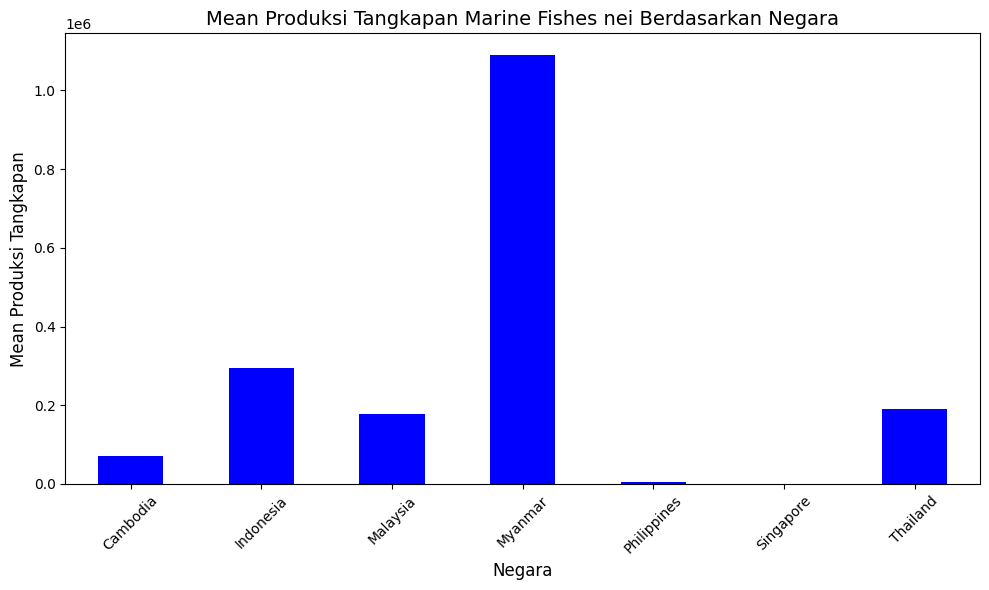

In [ ]:
# Plot Marine Fishes nei bar chart for every country.
marinef_df = df_marine[df_marine["Species"] == "Marine fishes nei"]

mean_by_country = marinef_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Marine Fishes nei Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Myanmar

#### Extract Data

Min SST: 28.40160282953761
Max SST: 29.26533564814815
Midpoint: 28.83346923884288


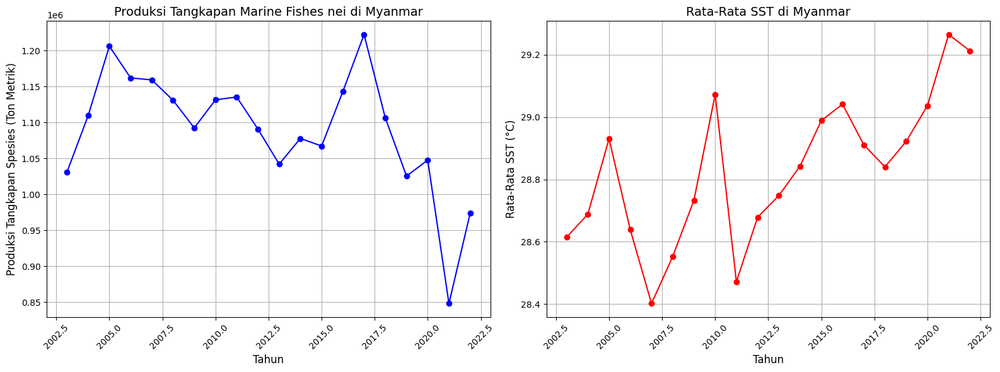

In [ ]:
# Extract Marine fishes nei
marinef_mn = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Myanmar")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_mn = marinef_mn[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_mn = marinef_mn.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
marinef_mn = marinef_mn.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
marinef_mn = hs_interval(marinef_mn)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_mn["PERIOD"], marinef_mn["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Marine Fishes nei di Myanmar", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(marinef_mn["PERIOD"], marinef_mn["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Myanmar", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
print(marinef_mn)

stat, p_value = shapiro(marinef_mn["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# If p-val is greater than alpha = 0.05, then data is distributed normally.

    PERIOD      VALUE   Mean SST  Min SST  Max SST  Hidden State (Interval)
0     2003  1030720.0  28.614484    25.09    31.80                        0
1     2004  1109640.0  28.688283    24.66    32.38                        0
2     2005  1206330.0  28.930639    25.09    33.98                        1
3     2006  1162100.0  28.638309    25.53    31.36                        0
4     2007  1159400.0  28.401603    23.64    31.21                        0
5     2008  1131000.0  28.552556    24.37    31.36                        0
6     2009  1092500.0  28.733285    25.39    31.50                        0
7     2010  1131700.0  29.072733    24.37    32.38                        1
8     2011  1135531.0  28.471702    24.95    31.07                        0
9     2012  1090902.0  28.678485    24.07    31.80                        0
10    2013  1042127.0  28.748262    24.51    31.65                        0
11    2014  1077905.0  28.842595    24.80    32.52                        1
12    2015  

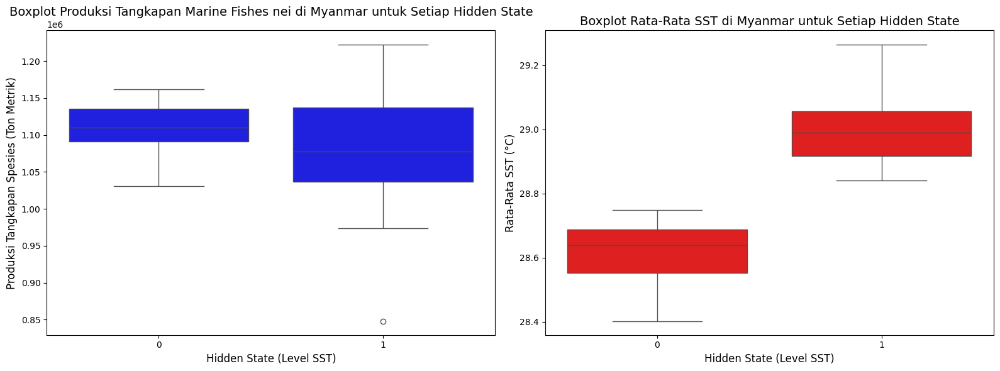

t-statistic: 0.8040500285979144, p-value: 0.4345034646187884
Observation Data: 
 [[1030720.]
 [1109640.]
 [1206330.]
 [1162100.]
 [1159400.]
 [1131000.]
 [1092500.]
 [1131700.]
 [1135531.]
 [1090902.]
 [1042127.]
 [1077905.]
 [1067300.]
 [1143070.]
 [1222620.]
 [1106578.]
 [1025505.]
 [1047728.]
 [ 848069.]
 [ 973765.]]
Hidden State - Interval: 
 [0 0 1 0 0 0 0 1 0 0 0 1 1 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_mn, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Myanmar untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_mn, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Myanmar untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# Welch's t-test for each HS
marinef_mn_0 = marinef_mn[marinef_mn["Hidden State (Interval)"] == 0]["VALUE"]
marinef_mn_1 = marinef_mn[marinef_mn["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_mn_0, marinef_mn_1, equal_var = False)
print(f"t-statistic: {t_stat}, p-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_mn_hs_int = marinef_mn.pop("Hidden State (Interval)").values

marinef_mn_x = marinef_mn.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_mn_x = marinef_mn_x.values

print("Observation Data: \n", marinef_mn_x)
print("Hidden State - Interval: \n", marinef_mn_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(marinef_mn_x, marinef_mn_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(marinef_mn_x, marinef_mn_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 1 1 1 1 1 1 1 1 0 0 0 0 1 1]
Actual HS (train):    [0 0 1 0 0 0 0 1 0 0 0 1 1 1 1]
Predicted HS (test): [0 0 0 1 0]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 1 0 0 0 0 1 0 0 0 1 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


### Cambodia

#### Extract Data

Min SST: 29.182857142857145
Max SST: 29.88958333333333
Midpoint: 29.53622023809524


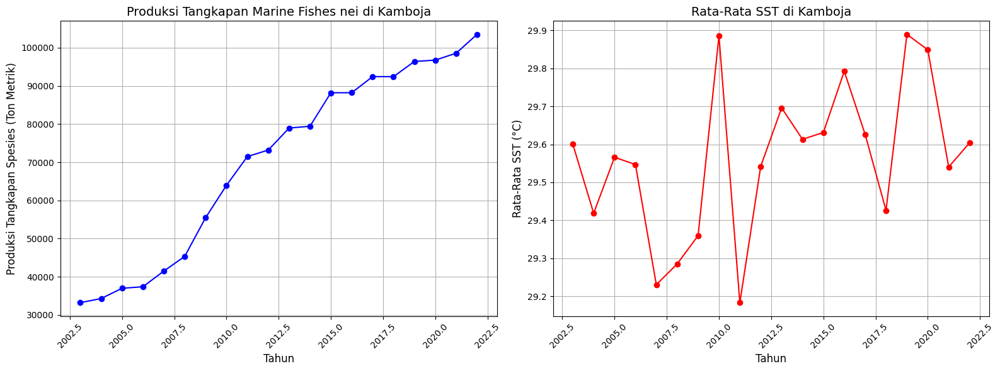

In [ ]:
# Extract Marine fishes nei in Cambodia
marinef_ca = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Cambodia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_ca = marinef_ca[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_ca = marinef_ca.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
marinef_ca = marinef_ca.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
marinef_ca = hs_interval(marinef_ca)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_ca["PERIOD"], marinef_ca["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Marine Fishes nei di Kamboja", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(marinef_ca["PERIOD"], marinef_ca["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Kamboja", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
print(marinef_ca)

stat, p_value = shapiro(marinef_ca["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

    PERIOD       VALUE   Mean SST  Min SST  Max SST  Hidden State (Interval)
0     2003   33228.693  29.600625    28.44    31.80                        1
1     2004   34319.544  29.418437    27.86    32.09                        0
2     2005   37000.000  29.565938    27.86    31.94                        1
3     2006   37400.000  29.546860    27.72    32.38                        1
4     2007   41500.000  29.230313    28.01    31.50                        0
5     2008   45345.000  29.285000    27.72    31.21                        0
6     2009   55460.000  29.359658    26.70    30.92                        0
7     2010   63938.292  29.885833    28.01    31.94                        1
8     2011   71487.150  29.182857    27.86    30.92                        0
9     2012   73180.679  29.541944    27.86    31.50                        1
10    2013   78946.424  29.696042    28.15    32.81                        1
11    2014   79426.000  29.613229    27.43    32.09                        1

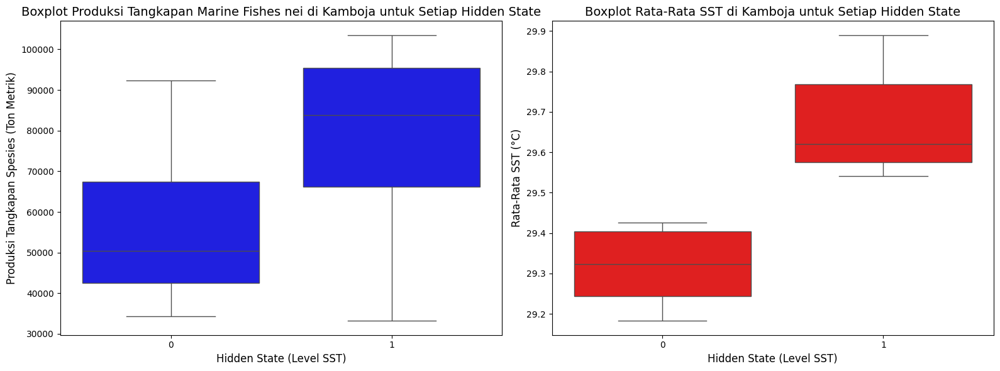

t-statistic: -1.771223384339499, p-value: 0.10511574047337473
Observation Data: 
 [[ 33228.693]
 [ 34319.544]
 [ 37000.   ]
 [ 37400.   ]
 [ 41500.   ]
 [ 45345.   ]
 [ 55460.   ]
 [ 63938.292]
 [ 71487.15 ]
 [ 73180.679]
 [ 78946.424]
 [ 79426.   ]
 [ 88189.154]
 [ 88200.   ]
 [ 92419.091]
 [ 92407.478]
 [ 96382.992]
 [ 96735.   ]
 [ 98548.289]
 [103475.   ]]
Hidden State - Interval: 
 [1 0 1 1 0 0 0 1 0 1 1 1 1 1 1 0 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_ca, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Kamboja untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_ca, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Kamboja untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# Welch's t-test for each HS
marinef_ca_0 = marinef_ca[marinef_ca["Hidden State (Interval)"] == 0]["VALUE"]
marinef_ca_1 = marinef_ca[marinef_ca["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_ca_0, marinef_ca_1, equal_var = False)
print(f"t-statistic: {t_stat}, p-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_ca_hs_int = marinef_ca.pop("Hidden State (Interval)").values

marinef_ca_x = marinef_ca.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_ca_x = marinef_ca_x.values

print("Observation Data: \n", marinef_ca_x)
print("Hidden State - Interval: \n", marinef_ca_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(marinef_ca_x, marinef_ca_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(marinef_ca_x, marinef_ca_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [1 0 1 1 0 0 0 1 0 1 1 1 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [1 0 1 1 0 0 0 1 0 1 1 1 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]


### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


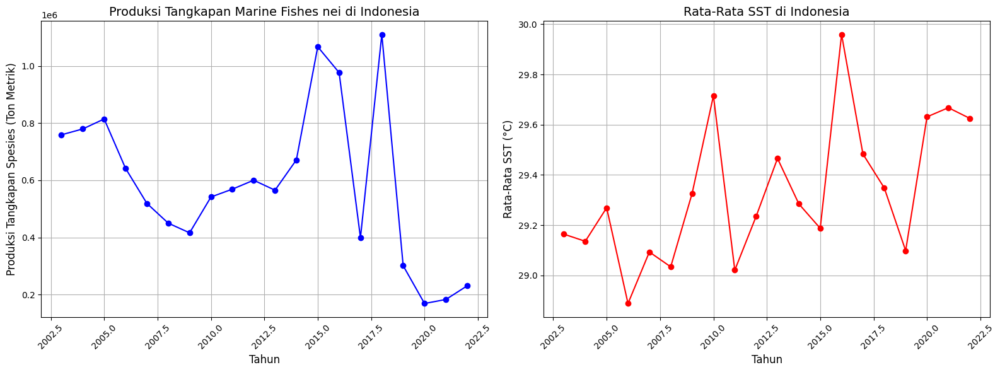

In [ ]:
# Extract Marine fishes nei in Indonesia
marinef_id = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_id = marinef_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_id = marinef_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
marinef_id = marinef_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
marinef_id = hs_interval(marinef_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_id["PERIOD"], marinef_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Marine Fishes nei di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(marinef_id["PERIOD"], marinef_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(marinef_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9648094930475245
p-value: 0.6436771558661792


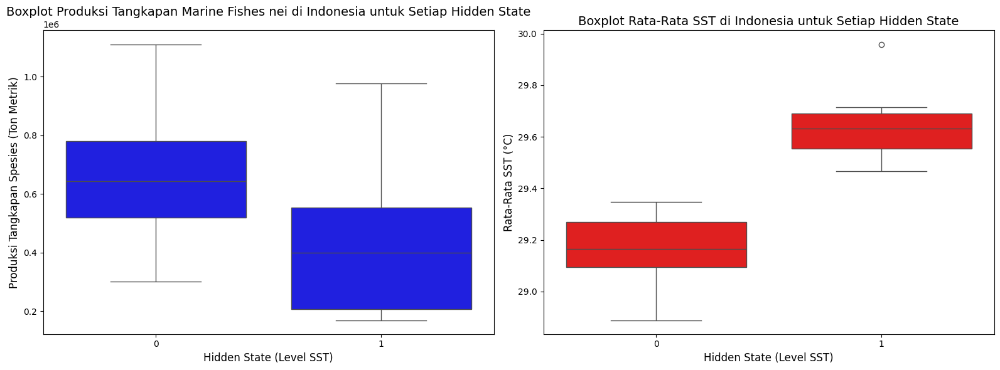

t-statistic: 1.8144608754788765, p-value: 0.09824159540621762
Observation Data: 
 [[ 759116.   ]
 [ 779690.   ]
 [ 814489.   ]
 [ 641894.   ]
 [ 519110.   ]
 [ 449959.   ]
 [ 416119.   ]
 [ 541498.   ]
 [ 568851.   ]
 [ 600160.025]
 [ 565301.431]
 [ 671473.4  ]
 [1067199.694]
 [ 976873.529]
 [ 399107.324]
 [1110233.188]
 [ 300986.805]
 [ 168759.688]
 [ 182906.588]
 [ 230761.895]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# Welch's t-test for each HS
marinef_id_0 = marinef_id[marinef_id["Hidden State (Interval)"] == 0]["VALUE"]
marinef_id_1 = marinef_id[marinef_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_id_0, marinef_id_1, equal_var = False)
print(f"t-statistic: {t_stat}, p-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_id_hs_int = marinef_id.pop("Hidden State (Interval)").values

marinef_id_x = marinef_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_id_x = marinef_id_x.values

print("Observation Data: \n", marinef_id_x)
print("Hidden State - Interval: \n", marinef_id_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(marinef_id_x, marinef_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(marinef_id_x, marinef_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 1 1 1 1 1 1 1 1 0 0 0 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

marinef_id = pd.concat([marinef_id.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

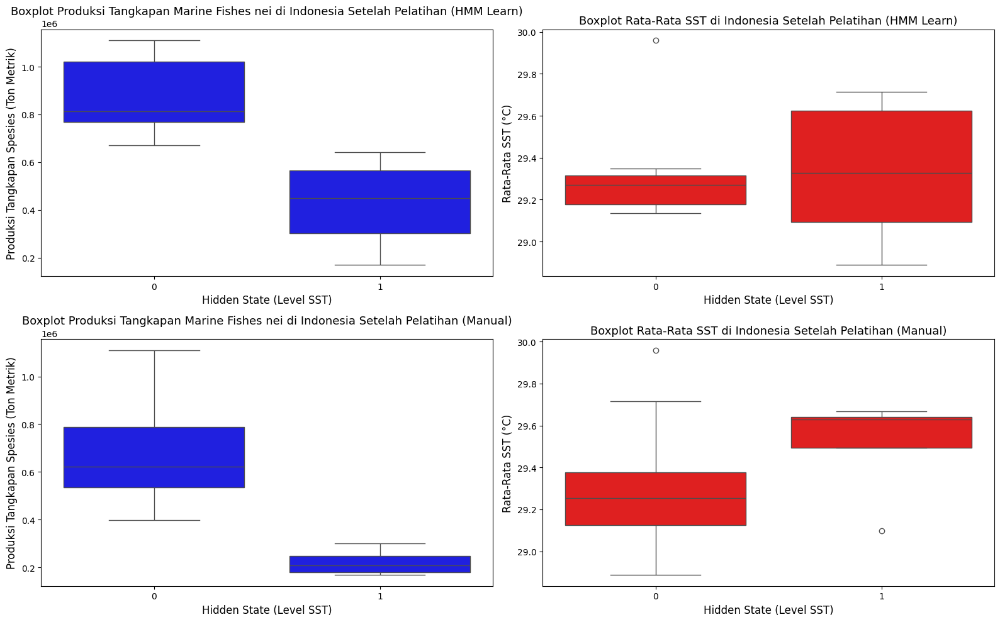

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=marinef_id, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=marinef_id, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=marinef_id, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=marinef_id, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = marinef_id.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.335492
1    29.329566
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.288144
1    29.505625
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
marinef_id_0 = marinef_id[marinef_id["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
marinef_id_1 = marinef_id[marinef_id["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_id_0, marinef_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
marinef_id_0 = marinef_id[marinef_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_id_1 = marinef_id[marinef_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_id_0, marinef_id_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: 0.04433128458034058, p-value: 0.965344597146095
Manual Code -- t-statistic: -1.4323161313037613, p-value: 0.21631341557434777


### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


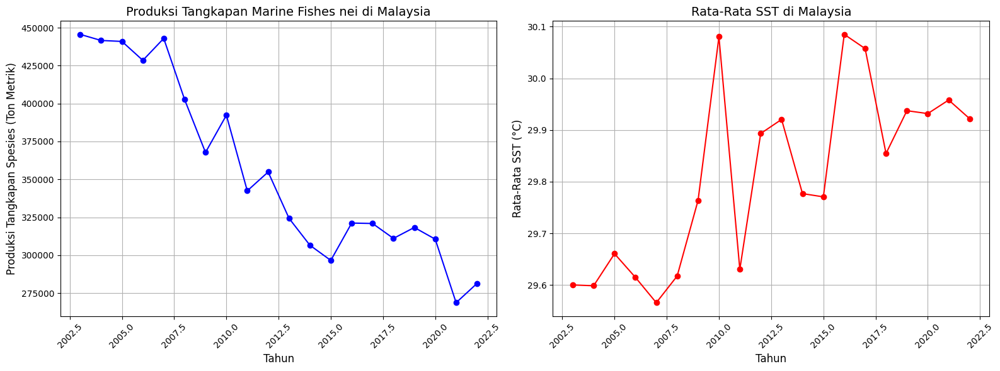

In [ ]:
# Extract Marine fishes nei in Malaysia
marinef_my = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_my = marinef_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_my = marinef_my.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
marinef_my = marinef_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
marinef_my = hs_interval(marinef_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_my["PERIOD"], marinef_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Marine Fishes nei di Malaysia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(marinef_my["PERIOD"], marinef_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Malaysia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(marinef_my["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.894895068350978
p-value: 0.03311751304912452


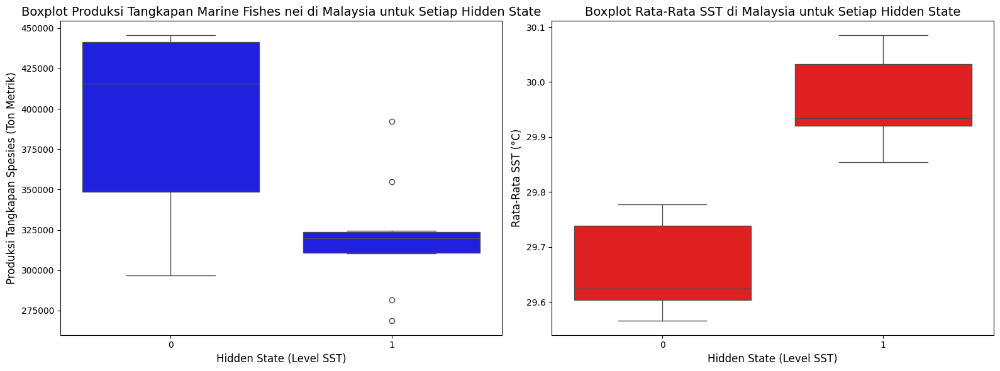

t-statistic: 3.296381161153465, p-value: 0.005069825661142556
Observation Data: 
 [[445610.   ]
 [441599.   ]
 [440961.   ]
 [428482.   ]
 [442938.   ]
 [402631.   ]
 [367750.   ]
 [392320.   ]
 [342442.   ]
 [354875.   ]
 [324318.237]
 [306566.141]
 [296561.409]
 [321202.378]
 [320904.712]
 [311071.651]
 [318279.835]
 [310562.466]
 [268680.   ]
 [281365.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# Welch's t-test for each HS
marinef_my_0 = marinef_my[marinef_my["Hidden State (Interval)"] == 0]["VALUE"]
marinef_my_1 = marinef_my[marinef_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_my_0, marinef_my_1, equal_var = False)
print(f"t-statistic: {t_stat}, p-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_my_hs_int = marinef_my.pop("Hidden State (Interval)").values

marinef_my_x = marinef_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_my_x = marinef_my_x.values

print("Observation Data: \n", marinef_my_x)
print("Hidden State - Interval: \n", marinef_my_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(marinef_my_x, marinef_my_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(marinef_my_x, marinef_my_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

marinef_my = pd.concat([marinef_my.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

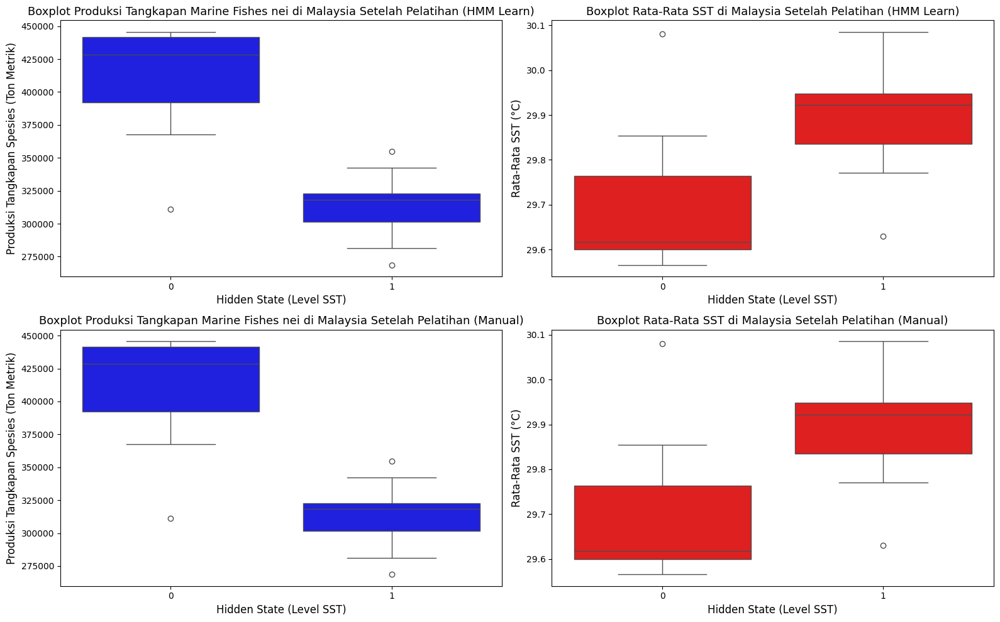

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=marinef_my, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=marinef_my, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=marinef_my, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=marinef_my, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = marinef_my.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.706274
1    29.898546
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.706274
1    29.898546
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
marinef_my_0 = marinef_my[marinef_my["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
marinef_my_1 = marinef_my[marinef_my["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_my_0, marinef_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
marinef_my_0 = marinef_my[marinef_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_my_1 = marinef_my[marinef_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_my_0, marinef_my_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -2.8070513809250897, p-value: 0.013315978067794174
Manual Code -- t-statistic: -2.8070513809250897, p-value: 0.013315978067794174


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


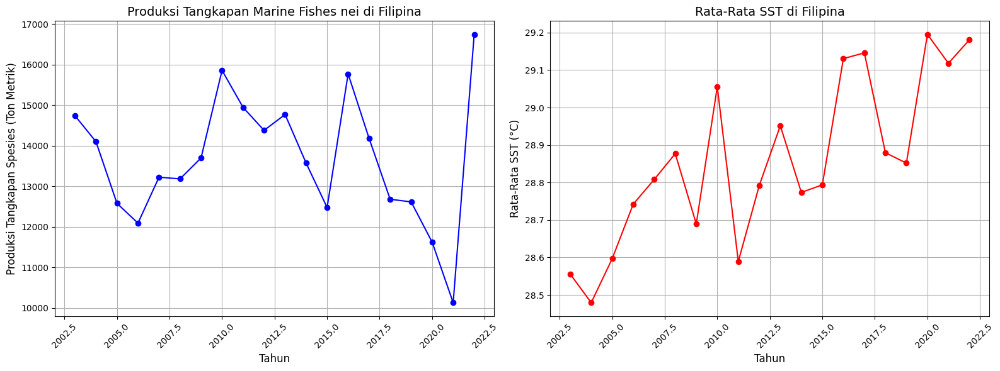

In [ ]:
# Extract Marine fishes nei in Philippines
marinef_ph = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_ph = marinef_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_ph = marinef_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
marinef_ph = marinef_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
marinef_ph = hs_interval(marinef_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_ph["PERIOD"], marinef_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Marine Fishes nei di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(marinef_ph["PERIOD"], marinef_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(marinef_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9884108797241489
p-value: 0.9954296561006346


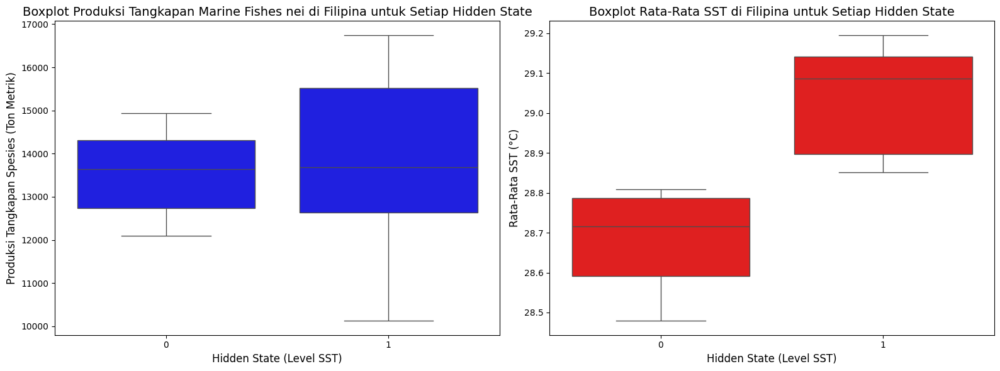

T-statistic: -0.2392972241685151, P-value: 0.814660503513571
Observation Data: 
 [[14738.   ]
 [14098.   ]
 [12576.   ]
 [12090.   ]
 [13222.   ]
 [13180.   ]
 [13695.   ]
 [15856.   ]
 [14943.   ]
 [14377.   ]
 [14768.   ]
 [13571.   ]
 [12474.   ]
 [15769.   ]
 [14175.   ]
 [12678.   ]
 [12613.   ]
 [11618.42 ]
 [10127.45 ]
 [16743.379]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_ph_0 = marinef_ph[marinef_ph["Hidden State (Interval)"] == 0]["VALUE"]
marinef_ph_1 = marinef_ph[marinef_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_ph_0, marinef_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_ph_hs_int = marinef_ph.pop("Hidden State (Interval)").values

marinef_ph_x = marinef_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_ph_x = marinef_ph_x.values

print("Observation Data: \n", marinef_ph_x)
print("Hidden State - Interval: \n", marinef_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(marinef_ph_x, marinef_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(marinef_ph_x, marinef_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 0 0 0 0 0 1 1 1 1 0 0 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 0 0 0 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


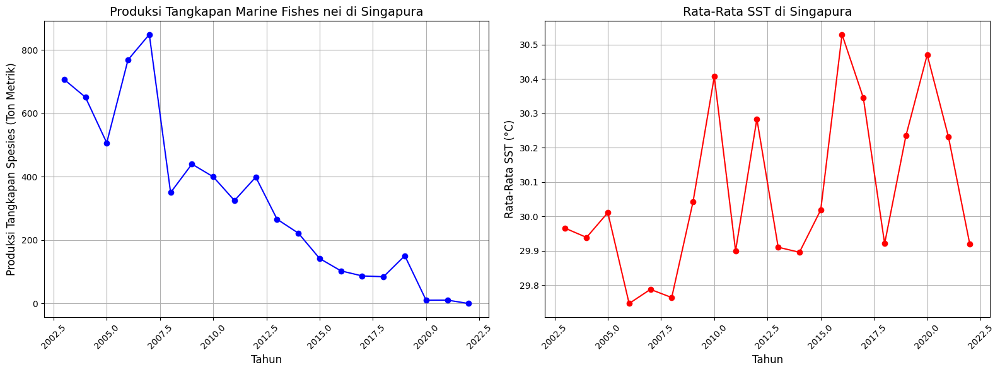

In [ ]:
# Extract Marine fishes nei in Singapore
marinef_sg = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_sg = marinef_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_sg = marinef_sg.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
marinef_sg = marinef_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
marinef_sg = hs_interval(marinef_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_sg["PERIOD"], marinef_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Marine Fishes nei di Singapura", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(marinef_sg["PERIOD"], marinef_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Singapura", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(marinef_sg["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9250253800268148
p-value: 0.12383373056953889


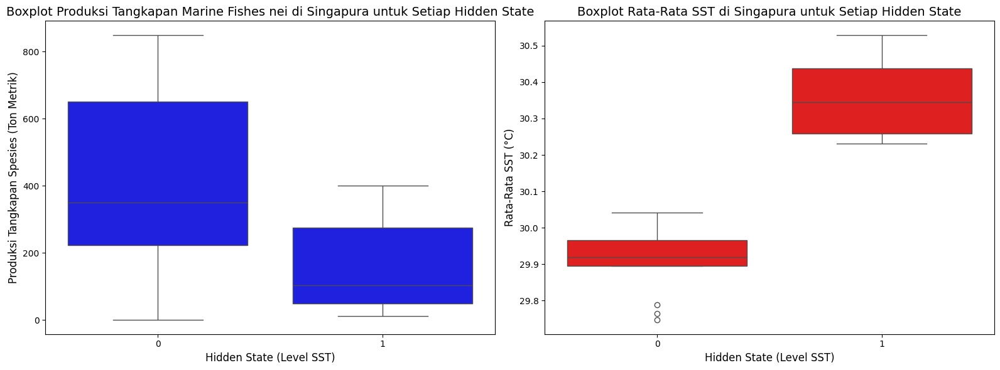

T-statistic: 2.464615427225459, P-value: 0.02431603402828103
Observation Data: 
 [[707.   ]
 [651.   ]
 [507.   ]
 [769.   ]
 [849.   ]
 [350.   ]
 [440.   ]
 [400.   ]
 [325.   ]
 [399.   ]
 [266.   ]
 [222.   ]
 [142.   ]
 [103.   ]
 [ 87.   ]
 [ 84.54 ]
 [150.735]
 [ 10.45 ]
 [ 10.7  ]
 [  0.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_sg_0 = marinef_sg[marinef_sg["Hidden State (Interval)"] == 0]["VALUE"]
marinef_sg_1 = marinef_sg[marinef_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_sg_0, marinef_sg_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_sg_hs_int = marinef_sg.pop("Hidden State (Interval)").values

marinef_sg_x = marinef_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_sg_x = marinef_sg_x.values

print("Observation Data: \n", marinef_sg_x)
print("Hidden State - Interval: \n", marinef_sg_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(marinef_sg_x, marinef_sg_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(marinef_sg_x, marinef_sg_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 0]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 0]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

marinef_sg = pd.concat([marinef_sg.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

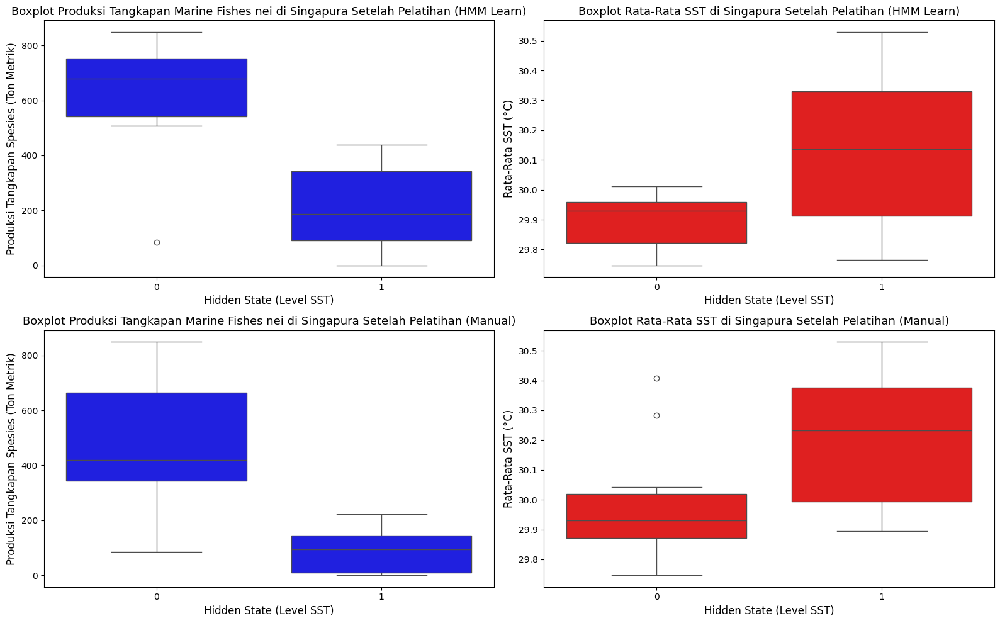

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=marinef_sg, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Singapura Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=marinef_sg, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Singapura Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=marinef_sg, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Singapura Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=marinef_sg, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Singapura Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = marinef_sg.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_sg.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_sg.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.895278
1    30.139355
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.973247
1    30.205460
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.909475
1    30.357067
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
marinef_sg_0 = marinef_sg[marinef_sg["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
marinef_sg_1 = marinef_sg[marinef_sg["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_sg_0, marinef_sg_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
marinef_sg_0 = marinef_sg[marinef_sg["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_sg_1 = marinef_sg[marinef_sg["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_sg_0, marinef_sg_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -3.1035583720562596, p-value: 0.0061382840686710185
Manual Code -- t-statistic: -2.259020004578007, p-value: 0.041654092572774255


### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


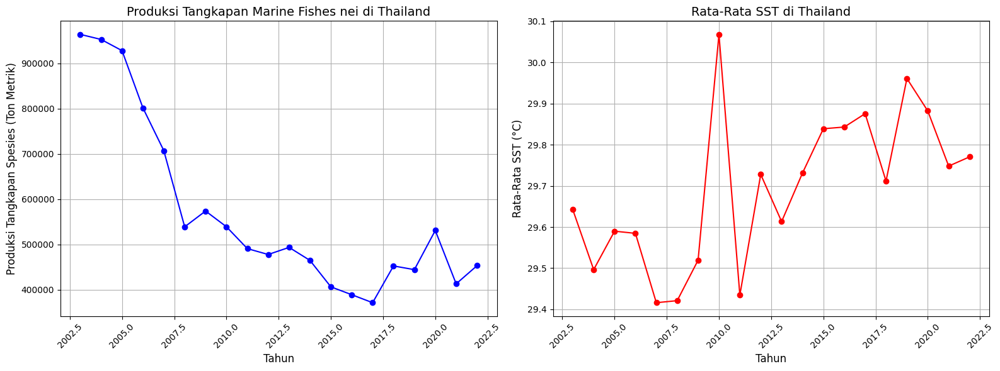

In [ ]:
# Extract Marine fishes nei in Thailand
marinef_th = df_marine[(df_marine["Species"] == "Marine fishes nei") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
marinef_th = marinef_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
marinef_th = marinef_th.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
marinef_th = marinef_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
marinef_th = hs_interval(marinef_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(marinef_th["PERIOD"], marinef_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Marine Fishes nei di Thailand", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(marinef_th["PERIOD"], marinef_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Thailand", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(marinef_th["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.8050444693217491
p-value: 0.001028340616762383


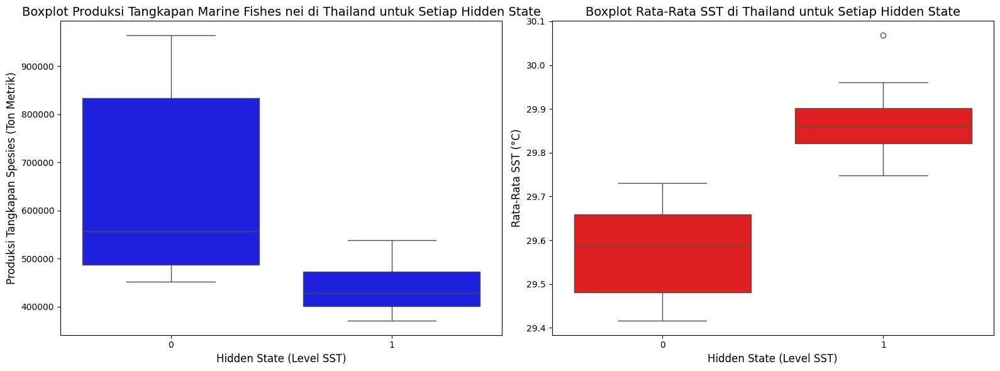

T-statistic: 2.7885371138034, P-value: 0.012130926876953444
Observation Data: 
 [[964149.   ]
 [952897.   ]
 [928177.   ]
 [801681.   ]
 [707224.   ]
 [538784.   ]
 [573740.   ]
 [538968.   ]
 [490674.   ]
 [477640.   ]
 [493382.   ]
 [464599.   ]
 [406174.   ]
 [388777.816]
 [371140.03 ]
 [452353.28 ]
 [444168.23 ]
 [530795.45 ]
 [412798.86 ]
 [452993.82 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = marinef_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = marinef_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
marinef_th_0 = marinef_th[marinef_th["Hidden State (Interval)"] == 0]["VALUE"]
marinef_th_1 = marinef_th[marinef_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(marinef_th_0, marinef_th_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
marinef_th_hs_int = marinef_th.pop("Hidden State (Interval)").values

marinef_th_x = marinef_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
marinef_th_x = marinef_th_x.values

print("Observation Data: \n", marinef_th_x)
print("Hidden State - Interval: \n", marinef_th_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(marinef_th_x, marinef_th_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(marinef_th_x, marinef_th_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

marinef_th = pd.concat([marinef_th.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

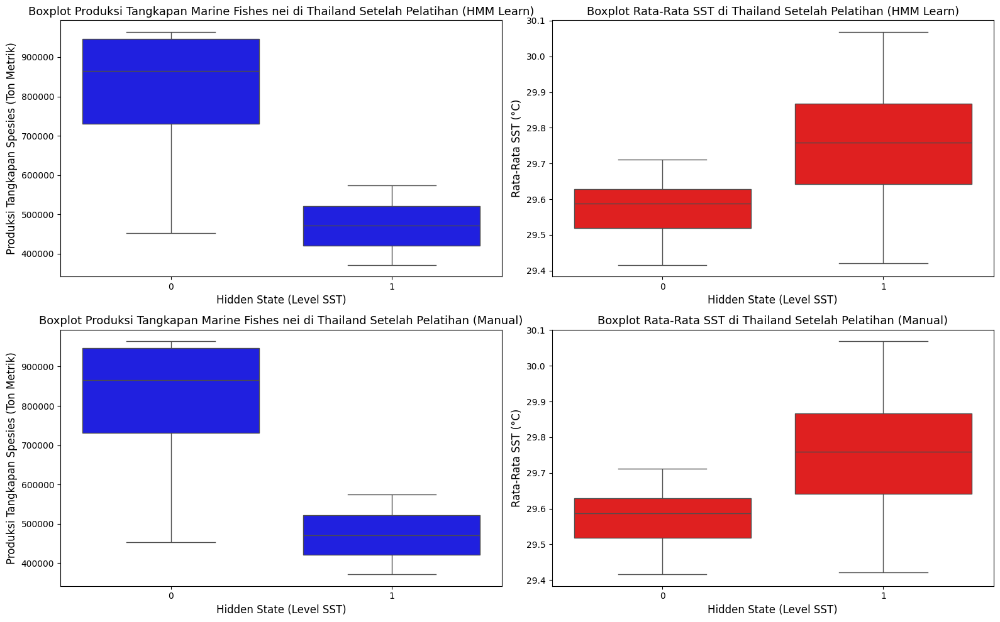

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=marinef_th, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=marinef_th, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=marinef_th, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Marine Fishes nei di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=marinef_th, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = marinef_th.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = marinef_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.573520
1    29.745377
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.573520
1    29.745377
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
marinef_th_0 = marinef_th[marinef_th["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
marinef_th_1 = marinef_th[marinef_th["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_th_0, marinef_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
marinef_th_0 = marinef_th[marinef_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
marinef_th_1 = marinef_th[marinef_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(marinef_th_0, marinef_th_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -2.5768509625228817, p-value: 0.019906483562993845
Manual Code -- t-statistic: -2.5768509625228817, p-value: 0.019906483562993845


## Sardinellas nei (done)

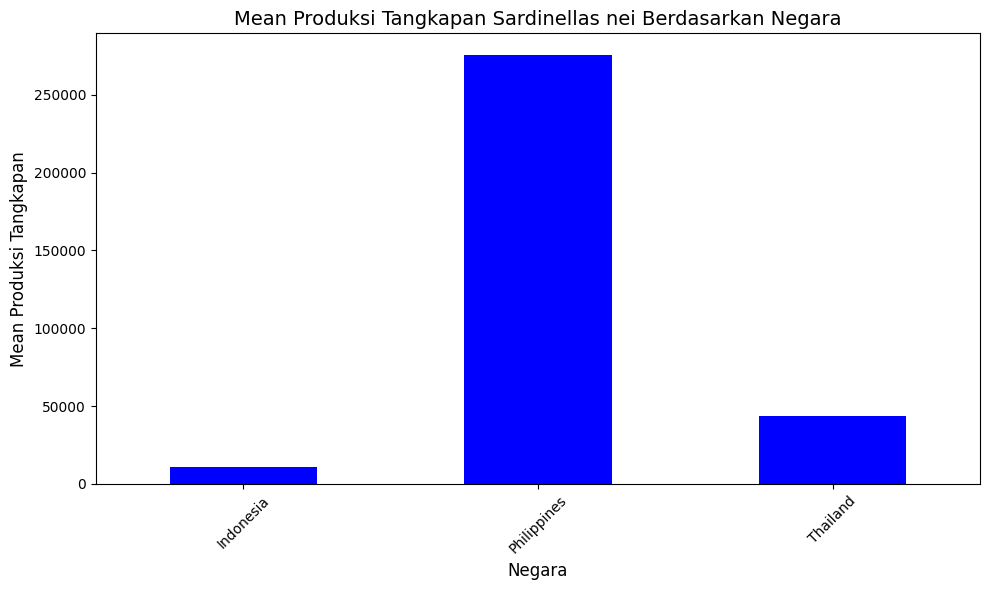

In [ ]:
# Plot Sardinellas nei bar chart for every country.
sardinellas_df = df_marine[df_marine["Species"] == "Sardinellas nei"]

mean_by_country = sardinellas_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Sardinellas nei Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

In [ ]:
print(sardinellas_df[sardinellas_df["Country"] == "Indonesia"])

      PERIOD          Species    Country      VALUE   Mean SST  Min SST  \
1138    2019  Sardinellas nei  Indonesia   6271.878  29.098526    21.74   
1139    2019  Sardinellas nei  Indonesia   5959.110  29.098526    21.74   
1214    2020  Sardinellas nei  Indonesia  13117.128  29.631132    24.37   
1215    2020  Sardinellas nei  Indonesia  14573.368  29.631132    24.37   
1290    2021  Sardinellas nei  Indonesia   9033.349  29.667584    24.37   
1291    2021  Sardinellas nei  Indonesia  16704.707  29.667584    24.37   
1366    2022  Sardinellas nei  Indonesia  10456.437  29.625258    24.22   
1367    2022  Sardinellas nei  Indonesia  12275.493  29.625258    24.22   

      Max SST  
1138    35.00  
1139    35.00  
1214    35.00  
1215    35.00  
1290    34.27  
1291    34.27  
1366    35.00  
1367    35.00  


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


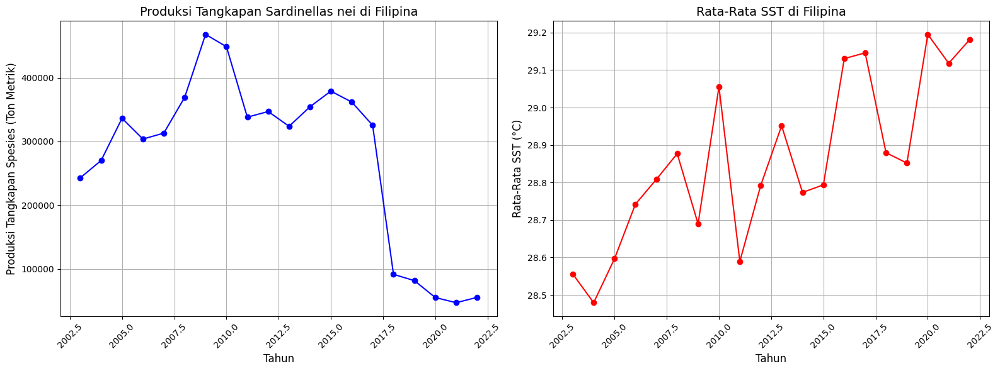

In [ ]:
# Extract Sardinellas nei in Philippines
sardinellas_ph = df_marine[(df_marine["Species"] == "Sardinellas nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
sardinellas_ph = sardinellas_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
sardinellas_ph = sardinellas_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
sardinellas_ph = sardinellas_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
sardinellas_ph = hs_interval(sardinellas_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(sardinellas_ph["PERIOD"], sardinellas_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Sardinellas nei di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(sardinellas_ph["PERIOD"], sardinellas_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(sardinellas_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.8541571689166974
p-value: 0.006262610750486624


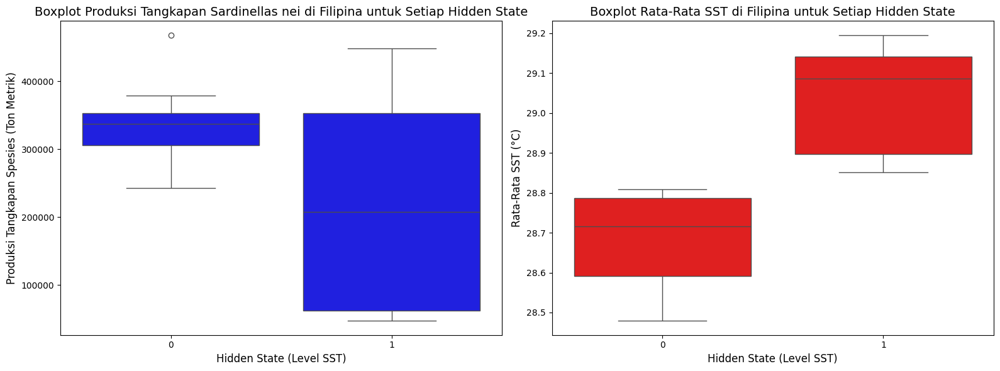

T-statistic: 2.1760595239381613, P-value: 0.051075413868952105
Observation Data: 
 [[242968.   ]
 [270227.   ]
 [336304.   ]
 [303766.   ]
 [313082.   ]
 [369199.   ]
 [467853.   ]
 [448556.   ]
 [338076.   ]
 [346938.   ]
 [323744.   ]
 [354423.   ]
 [378897.   ]
 [361794.   ]
 [325419.   ]
 [ 91696.   ]
 [ 81878.   ]
 [ 55361.31 ]
 [ 47279.15 ]
 [ 55610.623]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = sardinellas_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Sardinellas nei di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = sardinellas_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
sardinellas_ph_0 = sardinellas_ph[sardinellas_ph["Hidden State (Interval)"] == 0]["VALUE"]
sardinellas_ph_1 = sardinellas_ph[sardinellas_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(sardinellas_ph_0, sardinellas_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
sardinellas_ph_hs_int = sardinellas_ph.pop("Hidden State (Interval)").values

sardinellas_ph_x = sardinellas_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
sardinellas_ph_x = sardinellas_ph_x.values

print("Observation Data: \n", sardinellas_ph_x)
print("Hidden State - Interval: \n", sardinellas_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(sardinellas_ph_x, sardinellas_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(sardinellas_ph_x, sardinellas_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 0 0 0 0 1 1 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

sardinellas_ph = pd.concat([sardinellas_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

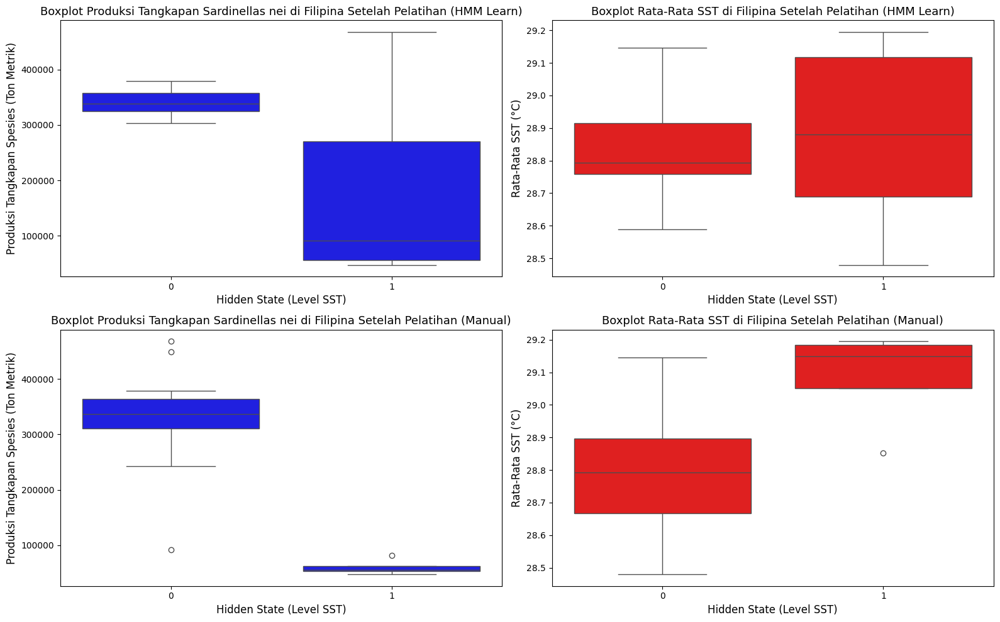

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=sardinellas_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Sardinellas nei di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=sardinellas_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=sardinellas_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Sardinellas nei di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=sardinellas_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = sardinellas_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = sardinellas_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = sardinellas_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.836506
1    28.889533
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.803837
1    29.086495
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
sardinellas_ph_0 = sardinellas_ph[sardinellas_ph["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
sardinellas_ph_1 = sardinellas_ph[sardinellas_ph["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(sardinellas_ph_0, sardinellas_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
sardinellas_ph_0 = sardinellas_ph[sardinellas_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
sardinellas_ph_1 = sardinellas_ph[sardinellas_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(sardinellas_ph_0, sardinellas_ph_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -0.5040305762361172, p-value: 0.6222992180272306
Manual Code -- t-statistic: -3.00103898032626, p-value: 0.02610598075382743


### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


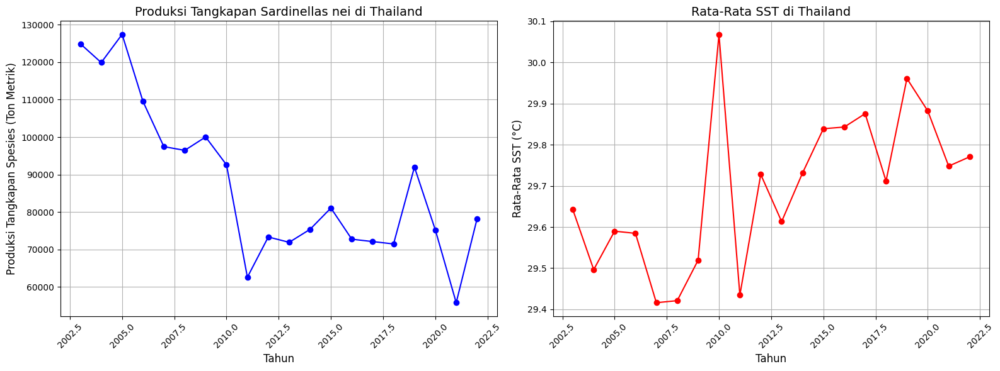

In [ ]:
# Extract Sardinellas nei in Thailand
sardinellas_th = df_marine[(df_marine["Species"] == "Sardinellas nei") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
sardinellas_th = sardinellas_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
sardinellas_th = sardinellas_th.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
sardinellas_th = sardinellas_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
sardinellas_th = hs_interval(sardinellas_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(sardinellas_th["PERIOD"], sardinellas_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Sardinellas nei di Thailand", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(sardinellas_th["PERIOD"], sardinellas_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Thailand", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(sardinellas_th["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9220243984500343
p-value: 0.10839150759758143


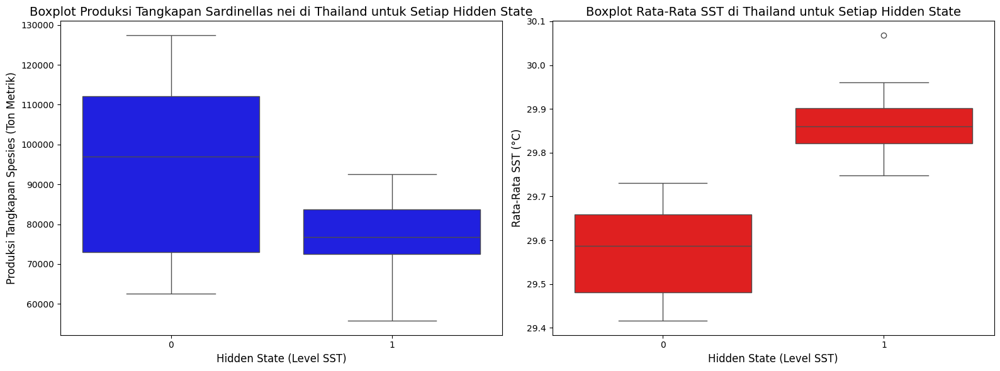

T-statistic: 2.1357264983019872, P-value: 0.04735211962270696
Observation Data: 
 [[124919.  ]
 [119901.  ]
 [127427.  ]
 [109508.  ]
 [ 97448.  ]
 [ 96455.  ]
 [100027.  ]
 [ 92588.  ]
 [ 62580.  ]
 [ 73325.  ]
 [ 71897.  ]
 [ 75359.  ]
 [ 81051.  ]
 [ 72729.44]
 [ 72095.77]
 [ 71463.07]
 [ 91988.65]
 [ 75213.23]
 [ 55775.01]
 [ 78201.31]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = sardinellas_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Sardinellas nei di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = sardinellas_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
sardinellas_th_0 = sardinellas_th[sardinellas_th["Hidden State (Interval)"] == 0]["VALUE"]
sardinellas_th_1 = sardinellas_th[sardinellas_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(sardinellas_th_0, sardinellas_th_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
sardinellas_th_hs_int = sardinellas_th.pop("Hidden State (Interval)").values

sardinellas_th_x = sardinellas_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
sardinellas_th_x = sardinellas_th_x.values

print("Observation Data: \n", sardinellas_th_x)
print("Hidden State - Interval: \n", sardinellas_th_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(sardinellas_th_x, sardinellas_th_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(sardinellas_th_x, sardinellas_th_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 0 1 1 1]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 0 1 1 1]
Actual HS (test):    [0 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

sardinellas_th = pd.concat([sardinellas_th.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

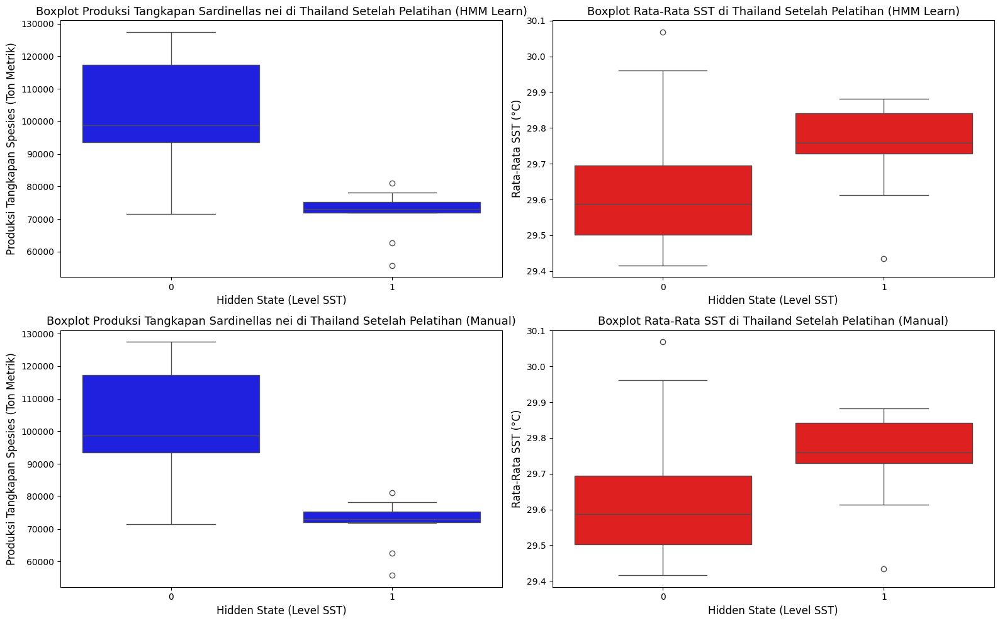

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=sardinellas_th, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Sardinellas nei di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=sardinellas_th, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=sardinellas_th, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Sardinellas nei di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=sardinellas_th, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = sardinellas_th.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = sardinellas_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = sardinellas_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.641099
1    29.746541
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.641099
1    29.746541
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
sardinellas_th_0 = sardinellas_th[sardinellas_th["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
sardinellas_th_1 = sardinellas_th[sardinellas_th["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(sardinellas_th_0, sardinellas_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
sardinellas_th_0 = sardinellas_th[sardinellas_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
sardinellas_th_1 = sardinellas_th[sardinellas_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(sardinellas_th_0, sardinellas_th_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -1.2917981041642943, p-value: 0.21581564132543912
Manual Code -- t-statistic: -1.2917981041642943, p-value: 0.21581564132543912


## Scads nei (done)

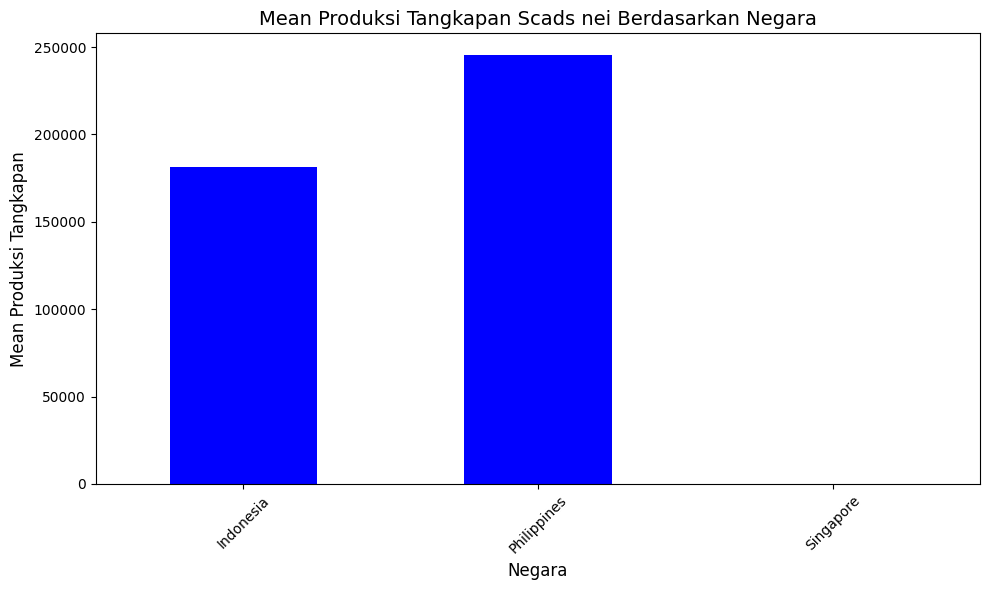

In [ ]:
# Plot Scads nei bar chart for every country.
scads_df = df_marine[df_marine["Species"] == "Scads nei"]

mean_by_country = scads_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Scads nei Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


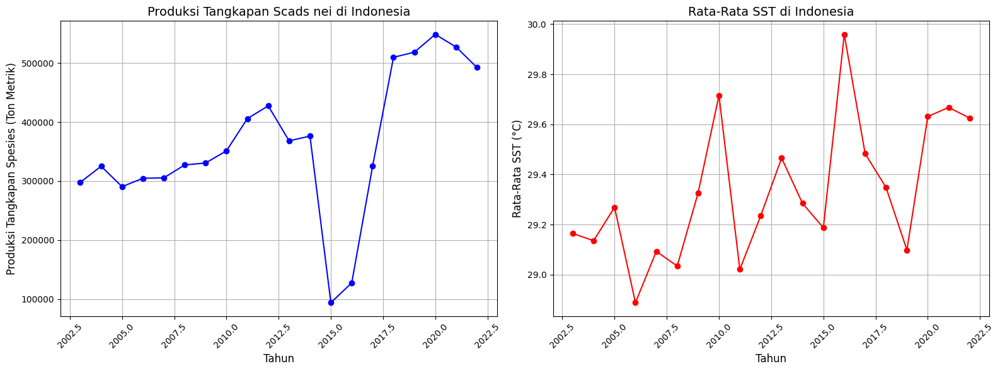

In [ ]:
# Extract Scads nei in Indonesia
scads_id = df_marine[(df_marine["Species"] == "Scads nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
scads_id = scads_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
scads_id = scads_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
scads_id = scads_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
scads_id = hs_interval(scads_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(scads_id["PERIOD"], scads_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Scads nei di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(scads_id["PERIOD"], scads_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(scads_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9236393711440007
p-value: 0.1164446004910995


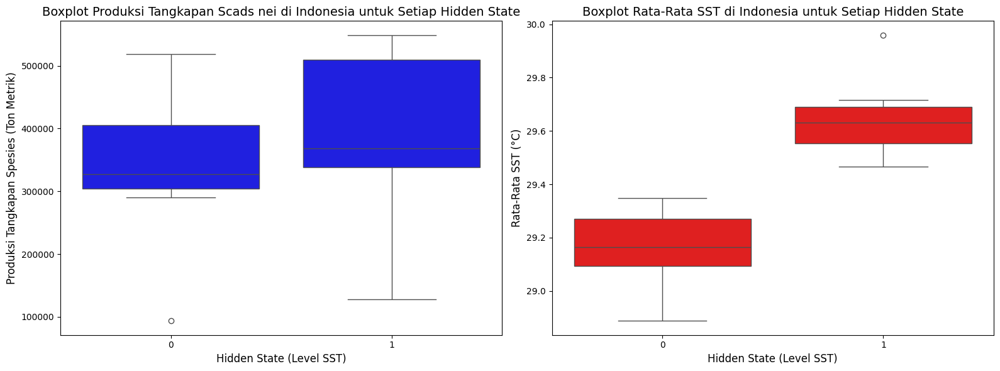

T-statistic: -0.702116869425752, P-value: 0.4992404212584708
Observation Data: 
 [[297937.   ]
 [325187.   ]
 [290609.   ]
 [304739.   ]
 [305485.   ]
 [327367.   ]
 [330687.   ]
 [351216.   ]
 [405808.   ]
 [427510.   ]
 [368221.   ]
 [376276.   ]
 [ 93914.   ]
 [127563.   ]
 [325561.711]
 [509734.73 ]
 [518516.14 ]
 [548659.909]
 [527173.162]
 [492396.619]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = scads_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Scads nei di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = scads_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
scads_id_0 = scads_id[scads_id["Hidden State (Interval)"] == 0]["VALUE"]
scads_id_1 = scads_id[scads_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(scads_id_0, scads_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
scads_id_hs_int = scads_id.pop("Hidden State (Interval)").values

scads_id_x = scads_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
scads_id_x = scads_id_x.values

print("Observation Data: \n", scads_id_x)
print("Hidden State - Interval: \n", scads_id_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(scads_id_x, scads_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(scads_id_x, scads_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 0 0 0 0]
Actual HS (test):    [0 0 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


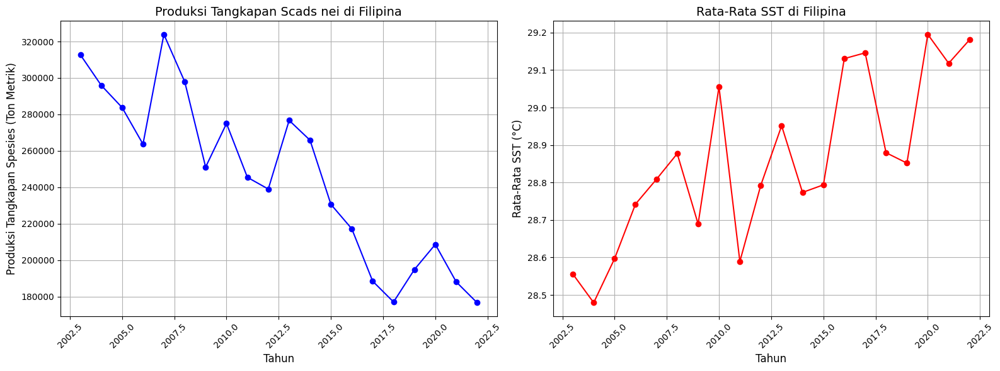

In [ ]:
# Extract Scads nei in Philippines
scads_ph = df_marine[(df_marine["Species"] == "Scads nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
scads_ph = scads_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
scads_ph = scads_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
scads_ph = scads_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
scads_ph = hs_interval(scads_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(scads_ph["PERIOD"], scads_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Scads nei di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(scads_ph["PERIOD"], scads_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(scads_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9504213490819479
p-value: 0.373530836291118


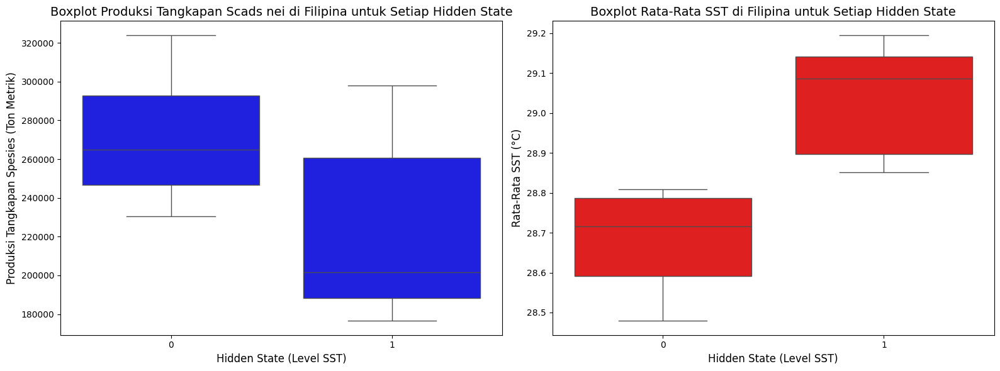

T-statistic: 2.9036966123054664, P-value: 0.010330770849279658
Observation Data: 
 [[312738.   ]
 [295952.   ]
 [283756.   ]
 [263651.   ]
 [323922.   ]
 [297892.   ]
 [251072.   ]
 [274994.   ]
 [245431.   ]
 [239003.   ]
 [276697.   ]
 [265806.   ]
 [230586.   ]
 [217172.   ]
 [188408.   ]
 [176988.   ]
 [194826.   ]
 [208622.62 ]
 [188036.33 ]
 [176597.736]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = scads_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Scads nei di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = scads_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
scads_ph_0 = scads_ph[scads_ph["Hidden State (Interval)"] == 0]["VALUE"]
scads_ph_1 = scads_ph[scads_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(scads_ph_0, scads_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
scads_ph_hs_int = scads_ph.pop("Hidden State (Interval)").values

scads_ph_x = scads_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
scads_ph_x = scads_ph_x.values

print("Observation Data: \n", scads_ph_x)
print("Hidden State - Interval: \n", scads_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(scads_ph_x, scads_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(scads_ph_x, scads_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

scads_ph = pd.concat([scads_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

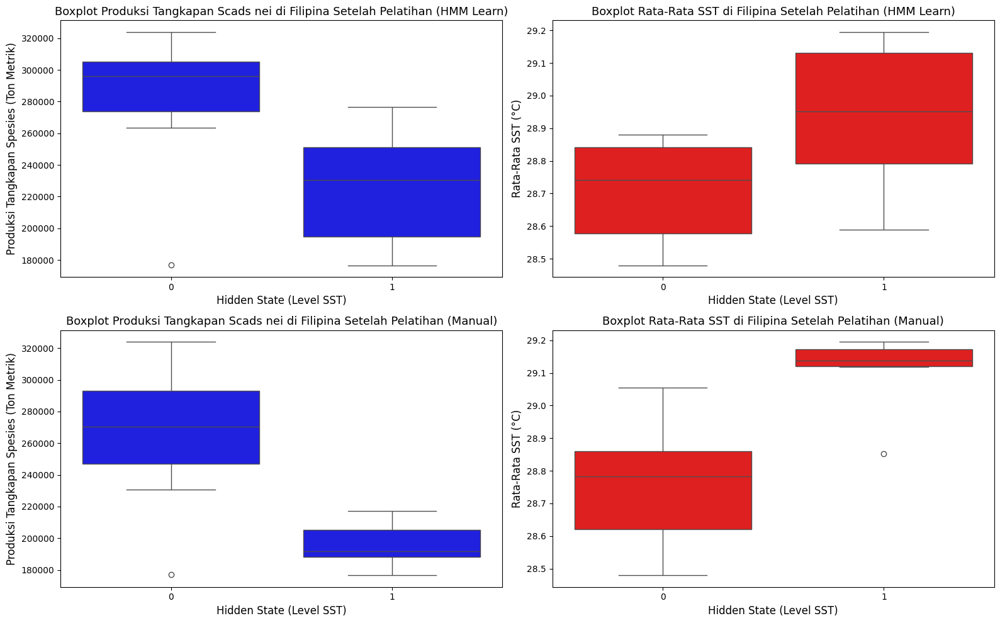

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=scads_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Scads nei di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=scads_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=scads_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Scads nei di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=scads_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = scads_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = scads_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = scads_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.705643
1    28.943682
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.756068
1    29.103735
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
scads_ph_0 = scads_ph[scads_ph["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
scads_ph_1 = scads_ph[scads_ph["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(scads_ph_0, scads_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
scads_ph_0 = scads_ph[scads_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
scads_ph_1 = scads_ph[scads_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(scads_ph_0, scads_ph_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -2.84273663051757, p-value: 0.012179104811843125
Manual Code -- t-statistic: -5.161099024134963, p-value: 0.00023127594154200462


### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


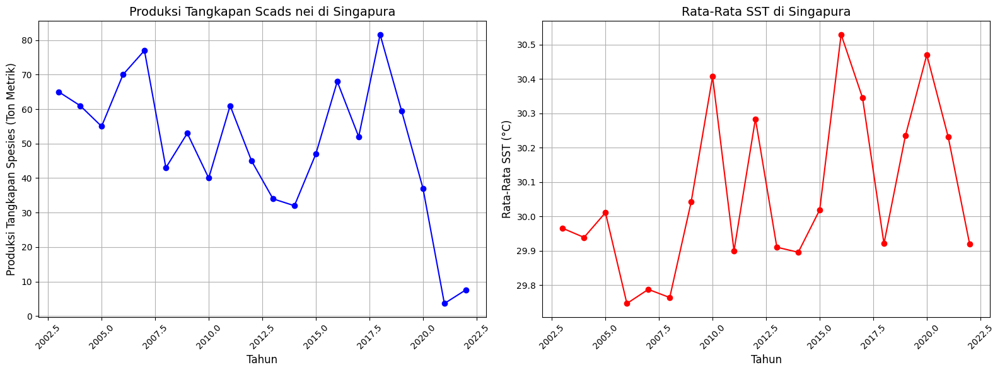

In [ ]:
# Extract Scads nei in Singapore
scads_sg = df_marine[(df_marine["Species"] == "Scads nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
scads_sg = scads_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
scads_sg = scads_sg.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
scads_sg = scads_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
scads_sg = hs_interval(scads_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(scads_sg["PERIOD"], scads_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Scads nei di Singapura", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(scads_sg["PERIOD"], scads_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Singapura", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(scads_sg["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9503211791257066
p-value: 0.3719913111656103


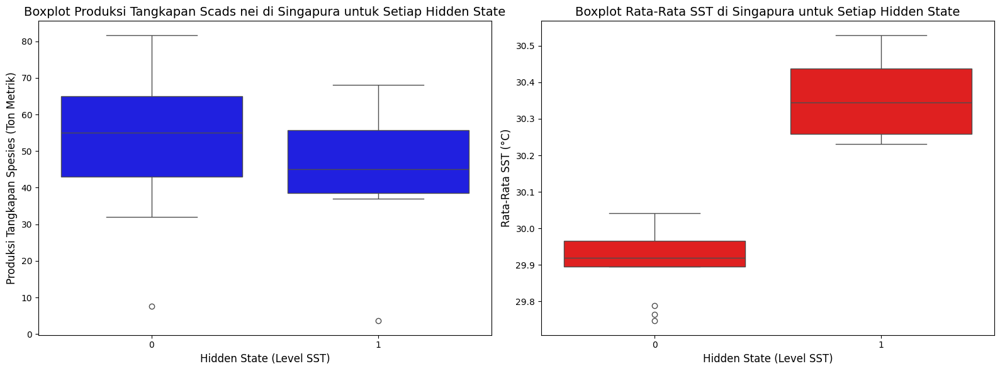

T-statistic: 0.9592902426378357, P-value: 0.35604092699450707
Observation Data: 
 [[65.   ]
 [61.   ]
 [55.   ]
 [70.   ]
 [77.   ]
 [43.   ]
 [53.   ]
 [40.   ]
 [61.   ]
 [45.   ]
 [34.   ]
 [32.   ]
 [47.   ]
 [68.   ]
 [52.   ]
 [81.64 ]
 [59.555]
 [37.06 ]
 [ 3.65 ]
 [ 7.6  ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = scads_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Scads nei di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = scads_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
scads_sg_0 = scads_sg[scads_sg["Hidden State (Interval)"] == 0]["VALUE"]
scads_sg_1 = scads_sg[scads_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(scads_sg_0, scads_sg_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
scads_sg_hs_int = scads_sg.pop("Hidden State (Interval)").values

scads_sg_x = scads_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
scads_sg_x = scads_sg_x.values

print("Observation Data: \n", scads_sg_x)
print("Hidden State - Interval: \n", scads_sg_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(scads_sg_x, scads_sg_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(scads_sg_x, scads_sg_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 0 1 1 1]
Actual HS (test):    [0 1 1 1 0]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 0 0 1 1]
Actual HS (test):    [0 1 1 1 0]


## Yellowfin tuna (done)

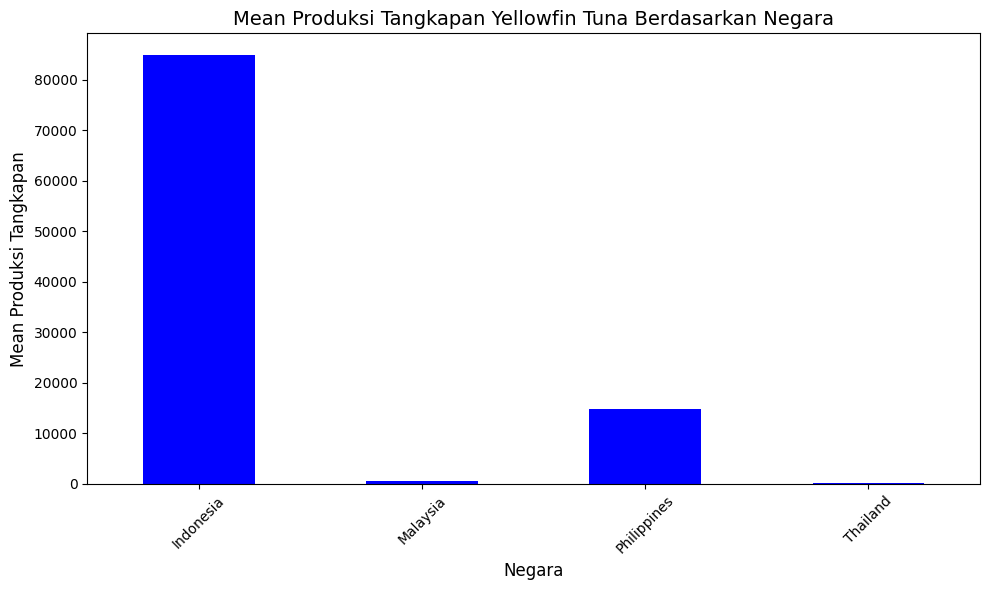

In [ ]:
# Plot Yellowfin Tuna bar chart for every country.
yellowfin_df = df_marine[df_marine["Species"] == "Yellowfin tuna"]

mean_by_country = yellowfin_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Yellowfin Tuna Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


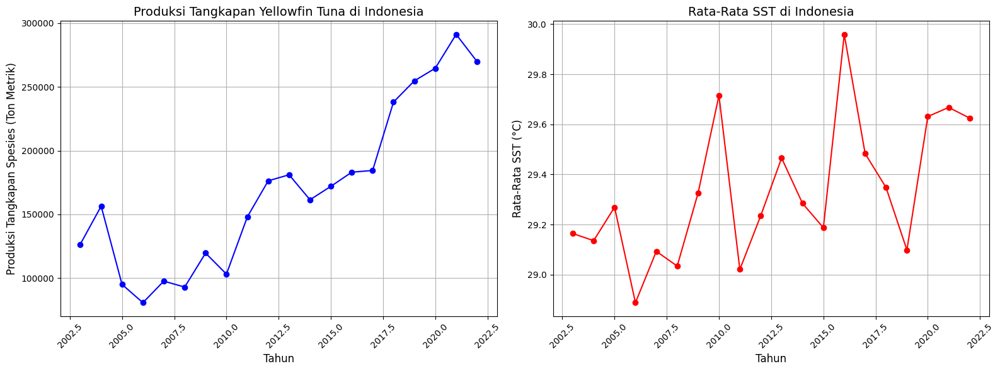

In [ ]:
# Extract Yellowfin tuna in Indonesia
yellowfin_id = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_id = yellowfin_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_id = yellowfin_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
yellowfin_id = yellowfin_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
yellowfin_id = hs_interval(yellowfin_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_id["PERIOD"], yellowfin_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Yellowfin Tuna di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(yellowfin_id["PERIOD"], yellowfin_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(yellowfin_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9281083775186558
p-value: 0.1419925313023659


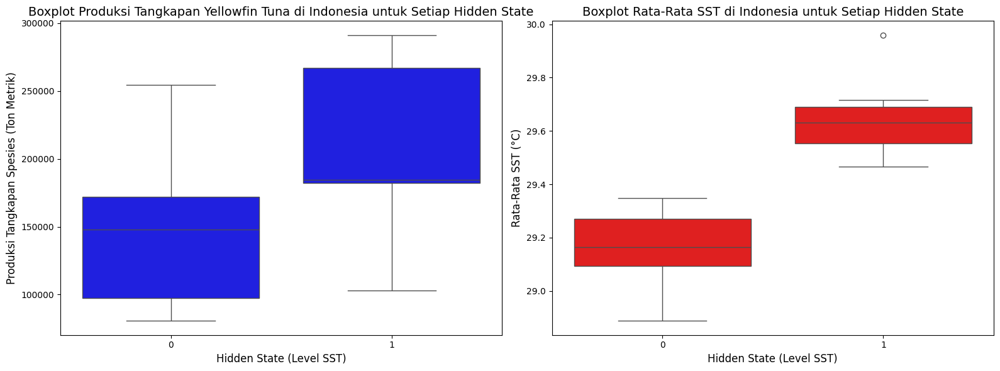

T-statistic: -2.1568336352482, P-value: 0.05548273937774918
Observation Data: 
 [[126511.   ]
 [156429.   ]
 [ 95029.   ]
 [ 80708.   ]
 [ 97608.   ]
 [ 92964.   ]
 [119623.   ]
 [103135.   ]
 [147992.   ]
 [176293.927]
 [181041.865]
 [161447.895]
 [171961.577]
 [183071.791]
 [184427.393]
 [238096.461]
 [254731.22 ]
 [264606.66 ]
 [291165.771]
 [269843.157]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_id_0 = yellowfin_id[yellowfin_id["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_id_1 = yellowfin_id[yellowfin_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_id_0, yellowfin_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_id_hs_int = yellowfin_id.pop("Hidden State (Interval)").values

yellowfin_id_x = yellowfin_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_id_x = yellowfin_id_x.values

print("Observation Data: \n", yellowfin_id_x)
print("Hidden State - Interval: \n", yellowfin_id_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(yellowfin_id_x, yellowfin_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(yellowfin_id_x, yellowfin_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 0 0 0 0]
Actual HS (test):    [0 0 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

yellowfin_id = pd.concat([yellowfin_id.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

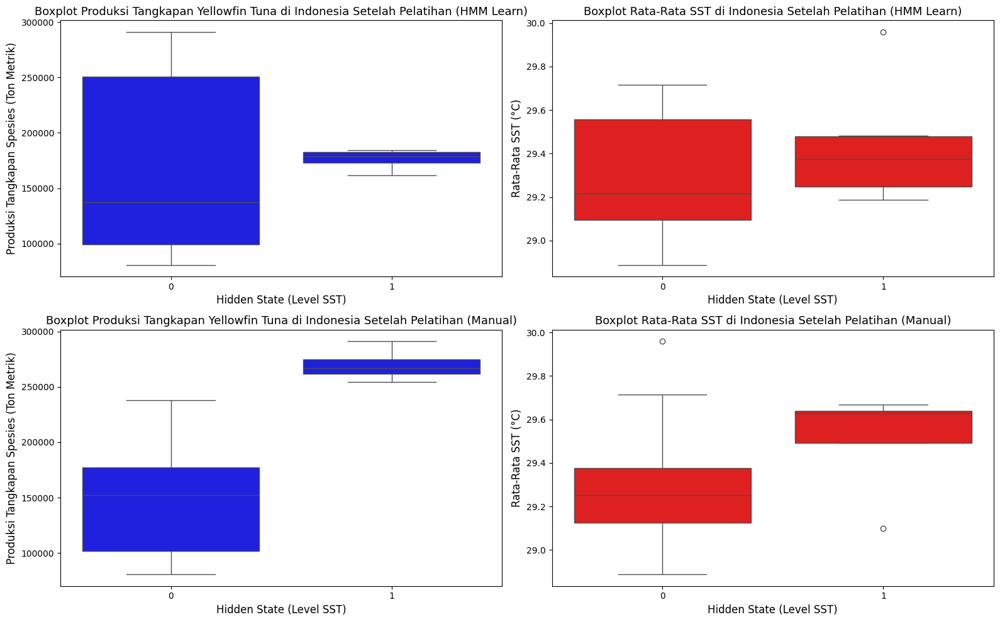

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=yellowfin_id, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=yellowfin_id, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=yellowfin_id, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=yellowfin_id, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = yellowfin_id.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = yellowfin_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = yellowfin_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.286962
1    29.435888
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.288144
1    29.505625
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
yellowfin_id_0 = yellowfin_id[yellowfin_id["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
yellowfin_id_1 = yellowfin_id[yellowfin_id["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_id_0, yellowfin_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
yellowfin_id_0 = yellowfin_id[yellowfin_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
yellowfin_id_1 = yellowfin_id[yellowfin_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_id_0, yellowfin_id_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -1.0883320992656509, p-value: 0.3040853426924341
Manual Code -- t-statistic: -1.4323161313037613, p-value: 0.21631341557434777


### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


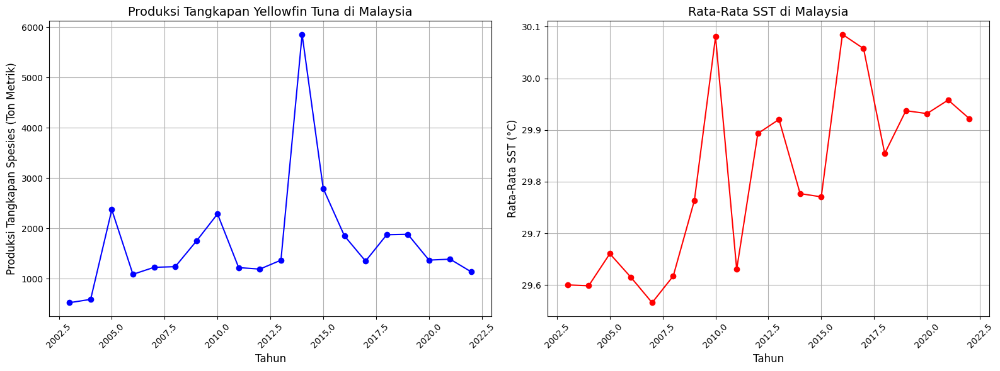

In [ ]:
# Extract Yellowfin tuna in Malaysia
yellowfin_my = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_my = yellowfin_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_my = yellowfin_my.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
yellowfin_my = yellowfin_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
yellowfin_my = hs_interval(yellowfin_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_my["PERIOD"], yellowfin_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Yellowfin Tuna di Malaysia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(yellowfin_my["PERIOD"], yellowfin_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Malaysia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(yellowfin_my["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.7020053155219832
p-value: 4.1247457628526375e-05


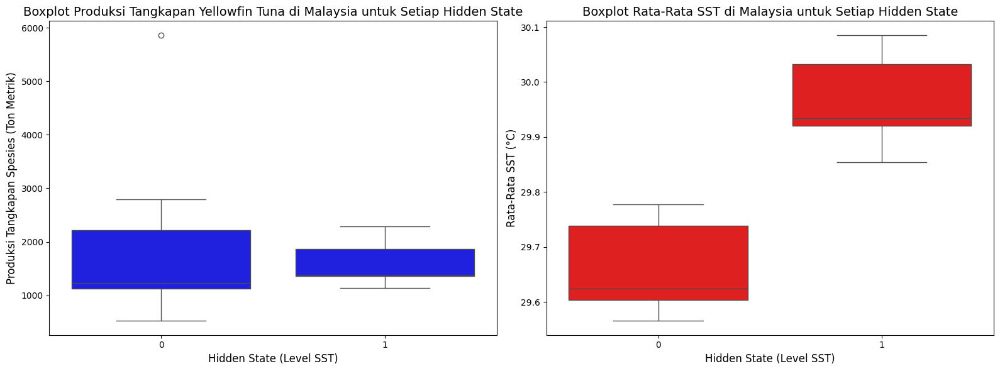

T-statistic: 0.5768350711615997, P-value: 0.5767686563137291
Observation Data: 
 [[ 526.   ]
 [ 592.   ]
 [2375.   ]
 [1090.   ]
 [1229.   ]
 [1242.   ]
 [1750.   ]
 [2291.   ]
 [1223.72 ]
 [1193.87 ]
 [1371.493]
 [5860.32 ]
 [2794.493]
 [1855.805]
 [1352.647]
 [1876.286]
 [1885.287]
 [1373.001]
 [1390.787]
 [1138.681]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_my_0 = yellowfin_my[yellowfin_my["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_my_1 = yellowfin_my[yellowfin_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_my_0, yellowfin_my_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_my_hs_int = yellowfin_my.pop("Hidden State (Interval)").values

yellowfin_my_x = yellowfin_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_my_x = yellowfin_my_x.values

print("Observation Data: \n", yellowfin_my_x)
print("Hidden State - Interval: \n", yellowfin_my_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(yellowfin_my_x, yellowfin_my_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(yellowfin_my_x, yellowfin_my_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 1 1 1 1 1 1 1 1 1 1 0 0 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 1 1 1 1 1 1 1 1 0 0 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


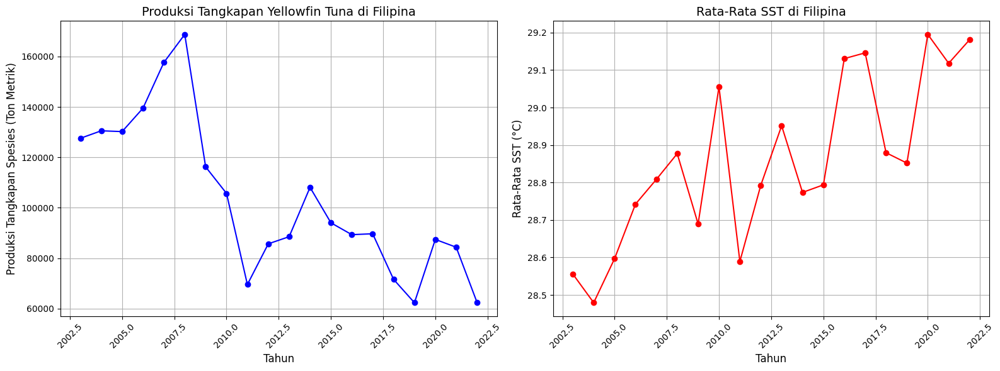

In [ ]:
# Extract Yellowfin tuna in Philippines
yellowfin_ph = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_ph = yellowfin_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_ph = yellowfin_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
yellowfin_ph = yellowfin_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
yellowfin_ph = hs_interval(yellowfin_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_ph["PERIOD"], yellowfin_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Yellowfin Tuna di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(yellowfin_ph["PERIOD"], yellowfin_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(yellowfin_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9380858028494966
p-value: 0.22056103156689028


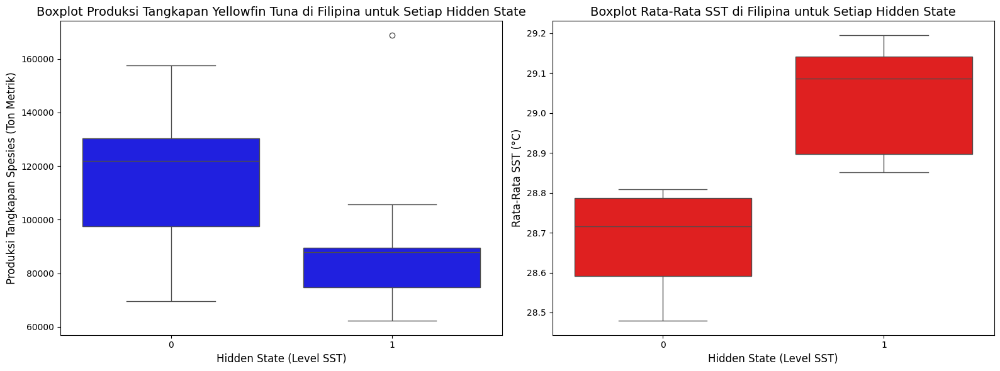

T-statistic: 1.9406422728959045, P-value: 0.06839129587683251
Observation Data: 
 [[127559.   ]
 [130533.   ]
 [130221.   ]
 [139508.   ]
 [157646.   ]
 [168790.   ]
 [116225.   ]
 [105702.   ]
 [ 69544.   ]
 [ 85693.25 ]
 [ 88518.154]
 [108097.004]
 [ 94034.   ]
 [ 89330.   ]
 [ 89683.27 ]
 [ 71606.   ]
 [ 62335.   ]
 [ 87438.   ]
 [ 84344.   ]
 [ 62398.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_ph_0 = yellowfin_ph[yellowfin_ph["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_ph_1 = yellowfin_ph[yellowfin_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_ph_0, yellowfin_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_ph_hs_int = yellowfin_ph.pop("Hidden State (Interval)").values

yellowfin_ph_x = yellowfin_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_ph_x = yellowfin_ph_x.values

print("Observation Data: \n", yellowfin_ph_x)
print("Hidden State - Interval: \n", yellowfin_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(yellowfin_ph_x, yellowfin_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(yellowfin_ph_x, yellowfin_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

yellowfin_ph = pd.concat([yellowfin_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

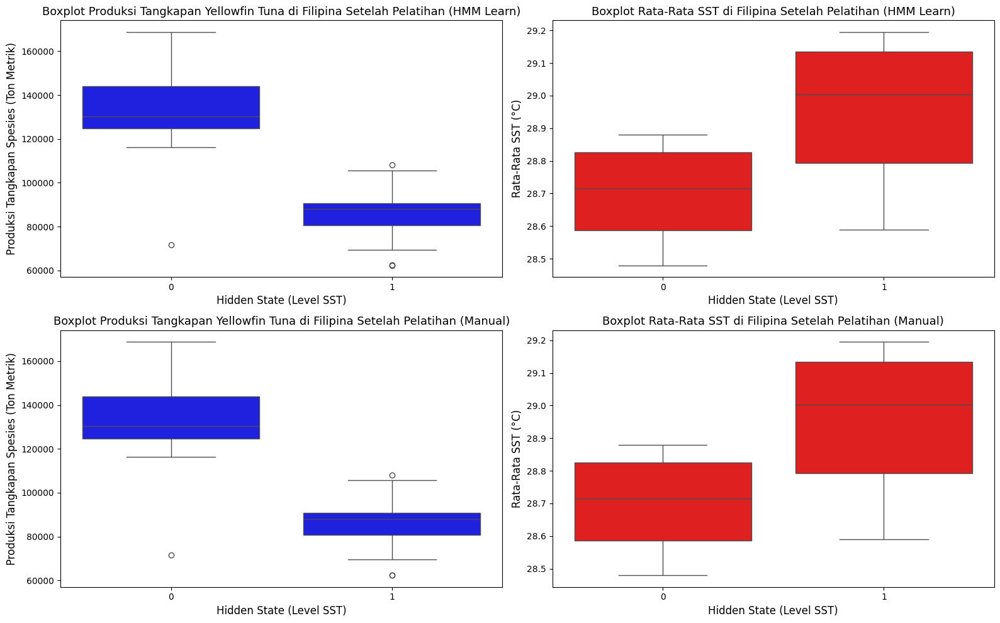

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=yellowfin_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=yellowfin_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=yellowfin_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=yellowfin_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = yellowfin_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = yellowfin_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = yellowfin_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.703631
1    28.964860
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.703631
1    28.964860
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
yellowfin_ph_0 = yellowfin_ph[yellowfin_ph["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
yellowfin_ph_1 = yellowfin_ph[yellowfin_ph["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_ph_0, yellowfin_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
yellowfin_ph_0 = yellowfin_ph[yellowfin_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
yellowfin_ph_1 = yellowfin_ph[yellowfin_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_ph_0, yellowfin_ph_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -3.331720902823341, p-value: 0.003788563791837182
Manual Code -- t-statistic: -3.331720902823341, p-value: 0.003788563791837182


### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


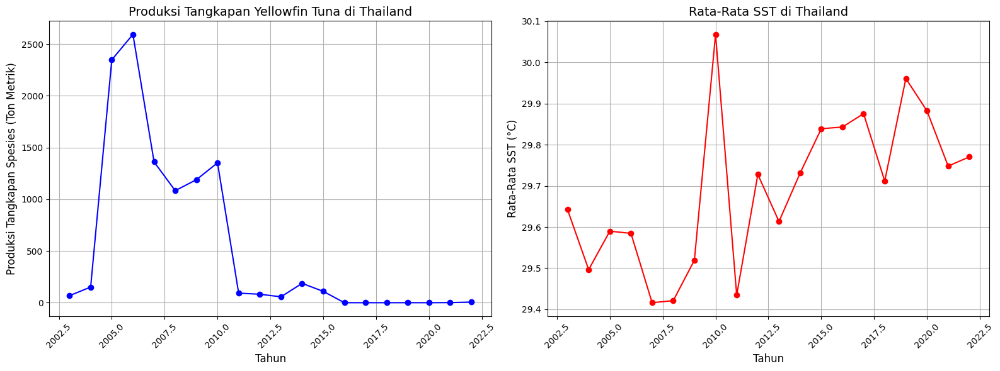

In [ ]:
# Extract Yellowfin tuna in Thailand
yellowfin_th = df_marine[(df_marine["Species"] == "Yellowfin tuna") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
yellowfin_th = yellowfin_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
yellowfin_th = yellowfin_th.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
yellowfin_th = yellowfin_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
yellowfin_th = hs_interval(yellowfin_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(yellowfin_th["PERIOD"], yellowfin_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Yellowfin Tuna di Thailand", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(yellowfin_th["PERIOD"], yellowfin_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Thailand", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(yellowfin_th["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.6907812949039409
p-value: 3.0161083767109732e-05


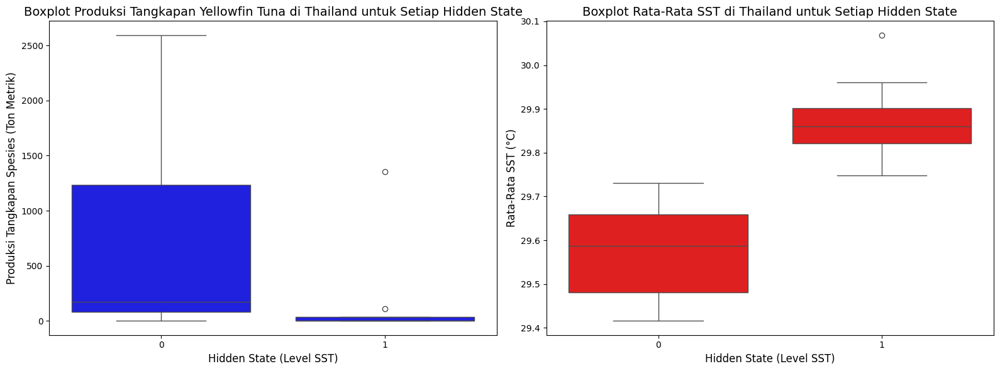

T-statistic: 1.8337062661923098, P-value: 0.08417268559369454
Observation Data: 
 [[  68.   ]
 [ 151.   ]
 [2348.   ]
 [2594.   ]
 [1361.   ]
 [1083.   ]
 [1189.   ]
 [1352.   ]
 [  92.12 ]
 [  81.8  ]
 [  56.835]
 [ 186.806]
 [ 109.451]
 [   0.   ]
 [   0.   ]
 [   0.   ]
 [   0.   ]
 [   0.   ]
 [   1.   ]
 [   6.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = yellowfin_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = yellowfin_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
yellowfin_th_0 = yellowfin_th[yellowfin_th["Hidden State (Interval)"] == 0]["VALUE"]
yellowfin_th_1 = yellowfin_th[yellowfin_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(yellowfin_th_0, yellowfin_th_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
yellowfin_th_hs_int = yellowfin_th.pop("Hidden State (Interval)").values

yellowfin_th_x = yellowfin_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
yellowfin_th_x = yellowfin_th_x.values

print("Observation Data: \n", yellowfin_th_x)
print("Hidden State - Interval: \n", yellowfin_th_hs_int)

#### Model

In [47]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(yellowfin_th_x, yellowfin_th_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(yellowfin_th_x, yellowfin_th_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [1 1 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

yellowfin_th = pd.concat([yellowfin_th.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

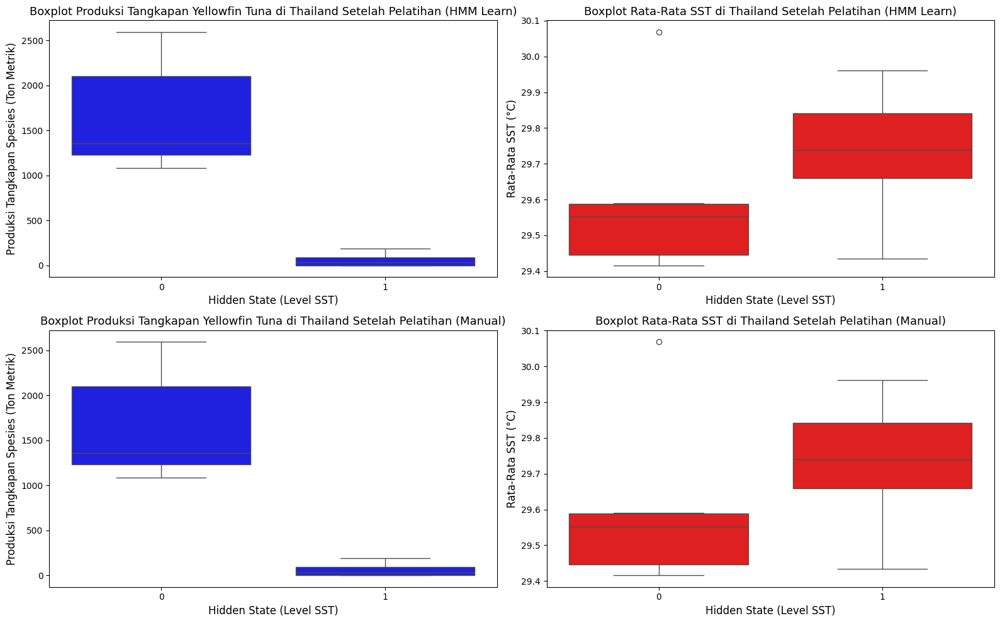

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=yellowfin_th, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=yellowfin_th, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=yellowfin_th, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Yellowfin Tuna di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=yellowfin_th, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = yellowfin_th.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = yellowfin_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = yellowfin_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.599914
1    29.734065
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.599914
1    29.734065
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
yellowfin_th_0 = yellowfin_th[yellowfin_th["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
yellowfin_th_1 = yellowfin_th[yellowfin_th["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_th_0, yellowfin_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
yellowfin_th_0 = yellowfin_th[yellowfin_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
yellowfin_th_1 = yellowfin_th[yellowfin_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(yellowfin_th_0, yellowfin_th_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -1.2612318698162184, p-value: 0.24943615330317206
Manual Code -- t-statistic: -1.2612318698162184, p-value: 0.24943615330317206


## Short mackerel (done)

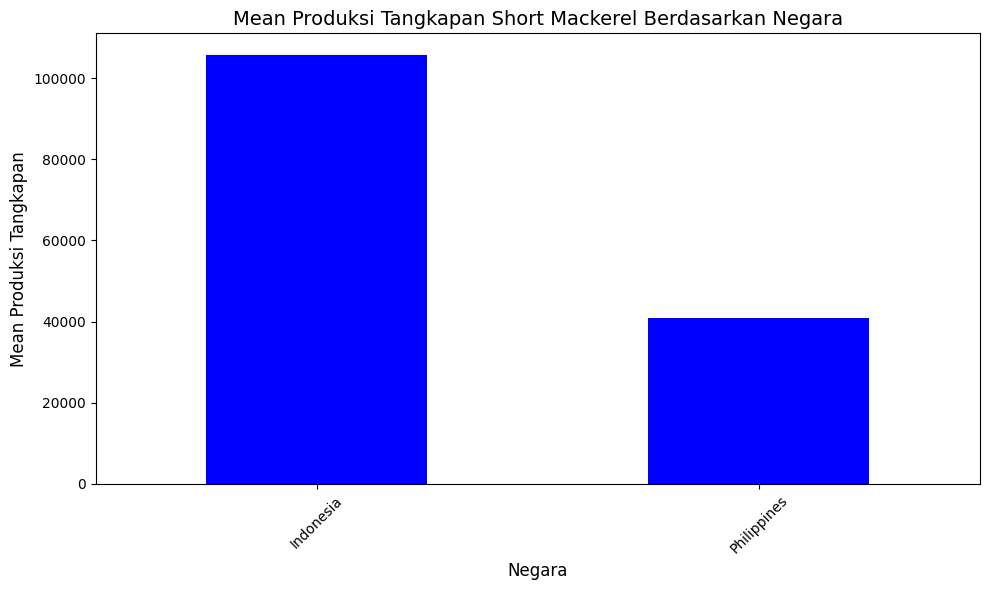

In [ ]:
# Plot Short Mackerel bar chart for every country.
short_df = df_marine[df_marine["Species"] == "Short mackerel"]

mean_by_country = short_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Short Mackerel Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


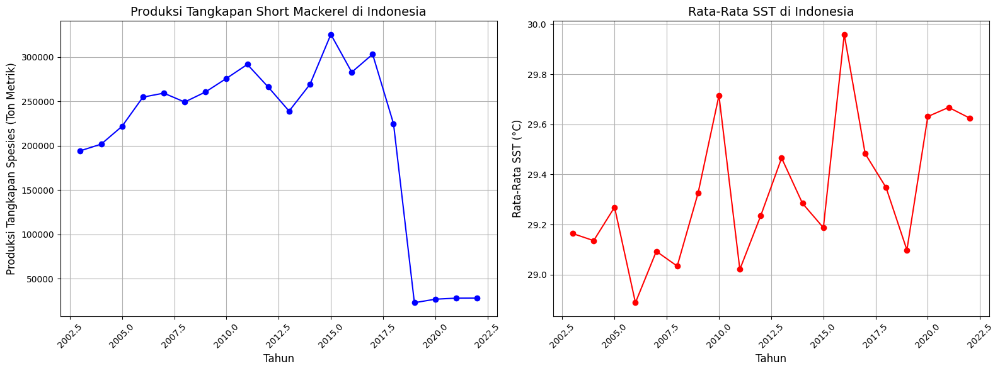

In [ ]:
# Extract Short mackerel in Indonesia
short_id = df_marine[(df_marine["Species"] == "Short mackerel") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
short_id = short_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
short_id = short_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
short_id = short_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
short_id = hs_interval(short_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(short_id["PERIOD"], short_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Short Mackerel di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(short_id["PERIOD"], short_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(short_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.7745778107912413
p-value: 0.0003696752342665617


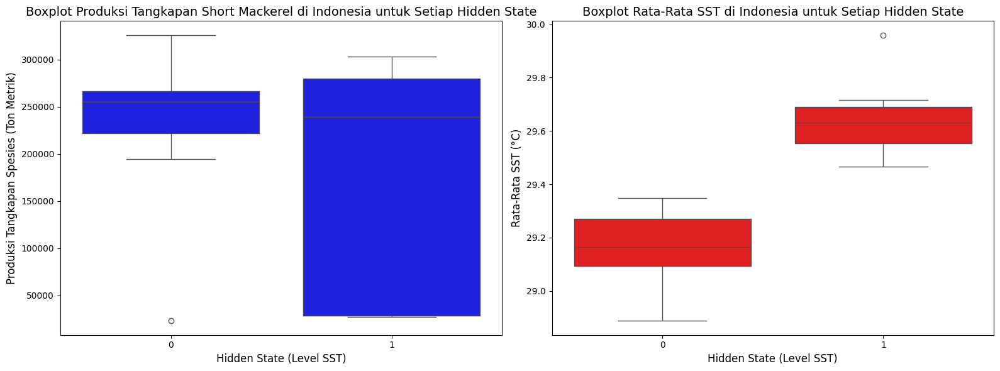

T-statistic: 1.1922646908571475, P-value: 0.26747948929104626
Observation Data: 
 [[194427.   ]
 [201882.   ]
 [222032.   ]
 [254960.   ]
 [259458.   ]
 [249438.   ]
 [260833.   ]
 [276110.   ]
 [291863.   ]
 [266358.   ]
 [239216.   ]
 [269411.   ]
 [325774.   ]
 [283106.   ]
 [303363.819]
 [224996.135]
 [ 23014.633]
 [ 26943.313]
 [ 28149.965]
 [ 28226.926]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = short_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Short Mackerel di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = short_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
short_id_0 = short_id[short_id["Hidden State (Interval)"] == 0]["VALUE"]
short_id_1 = short_id[short_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(short_id_0, short_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
short_id_hs_int = short_id.pop("Hidden State (Interval)").values

short_id_x = short_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
short_id_x = short_id_x.values

print("Observation Data: \n", short_id_x)
print("Hidden State - Interval: \n", short_id_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(short_id_x, short_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(short_id_x, short_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 1 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 0 0 0 0]
Actual HS (test):    [0 0 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


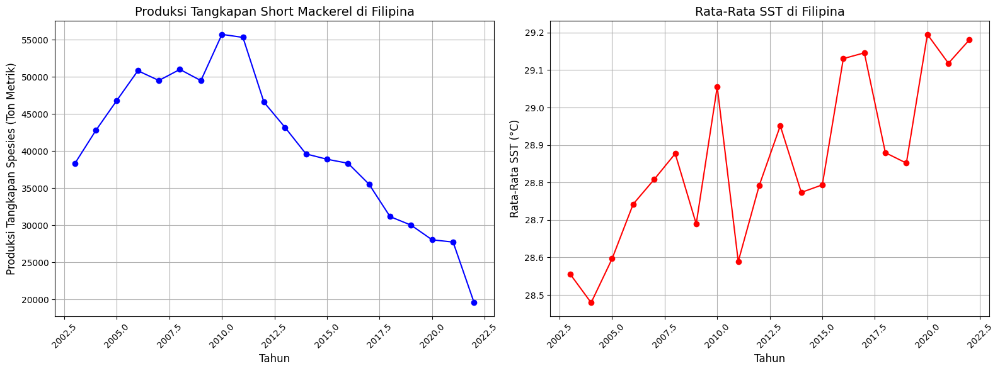

In [ ]:
# Extract Short mackerel in Philippines
short_ph = df_marine[(df_marine["Species"] == "Short mackerel") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
short_ph = short_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
short_ph = short_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
short_ph = short_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
short_ph = hs_interval(short_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(short_ph["PERIOD"], short_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Short Mackerel di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(short_ph["PERIOD"], short_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(short_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9619563696889112
p-value: 0.5836327563121864


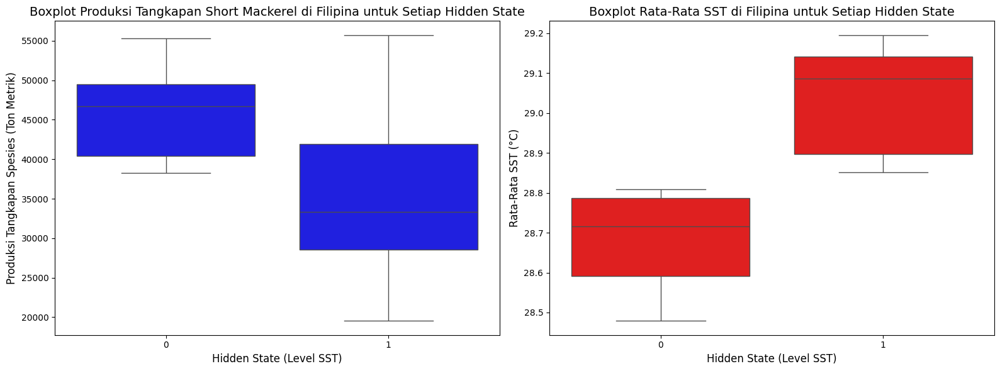

T-statistic: 2.4552920318890483, P-value: 0.028430382868983084
Observation Data: 
 [[38294.   ]
 [42760.   ]
 [46810.   ]
 [50810.   ]
 [49494.   ]
 [50986.   ]
 [49478.   ]
 [55708.   ]
 [55300.   ]
 [46572.   ]
 [43180.   ]
 [39602.   ]
 [38881.   ]
 [38339.   ]
 [35518.   ]
 [31153.   ]
 [30003.   ]
 [28026.64 ]
 [27722.31 ]
 [19552.302]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = short_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Short Mackerel di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = short_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
short_ph_0 = short_ph[short_ph["Hidden State (Interval)"] == 0]["VALUE"]
short_ph_1 = short_ph[short_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(short_ph_0, short_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
short_ph_hs_int = short_ph.pop("Hidden State (Interval)").values

short_ph_x = short_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
short_ph_x = short_ph_x.values

print("Observation Data: \n", short_ph_x)
print("Hidden State - Interval: \n", short_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(short_ph_x, short_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(short_ph_x, short_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 0 0 0 0 0 0 0 0 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

short_ph = pd.concat([short_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

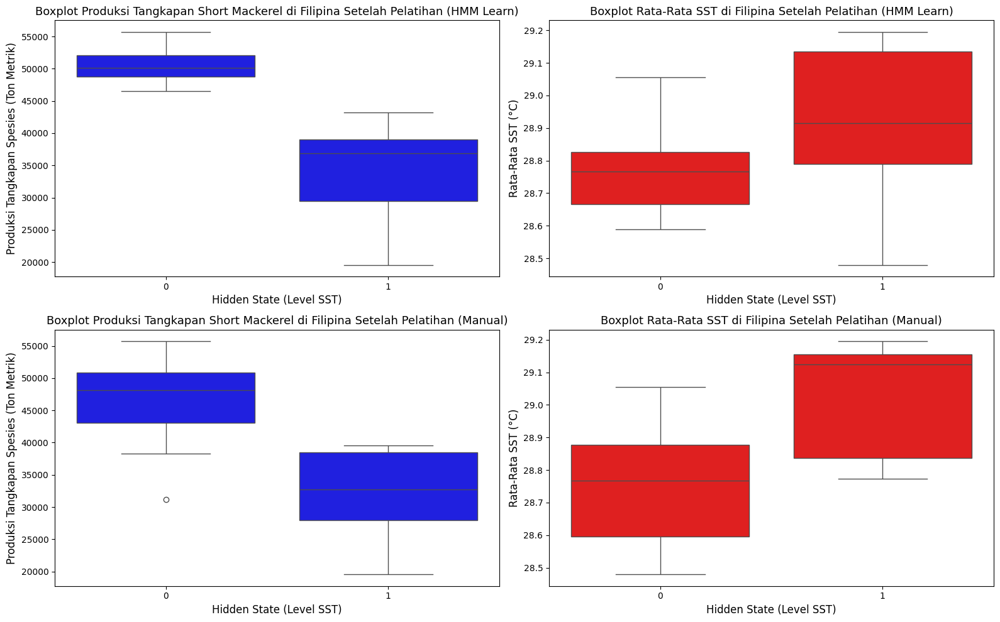

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=short_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Short Mackerel di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=short_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=short_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Short Mackerel di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=short_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = short_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = short_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = short_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.768904
1    28.921344
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.751465
1    29.023723
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
short_ph_0 = short_ph[short_ph["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
short_ph_1 = short_ph[short_ph["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(short_ph_0, short_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
short_ph_0 = short_ph[short_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
short_ph_1 = short_ph[short_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(short_ph_0, short_ph_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -1.7192717817268615, p-value: 0.10272990822141324
Manual Code -- t-statistic: -3.3193660599284964, p-value: 0.004799214704978753


## Stolephorus anchovies nei (done)

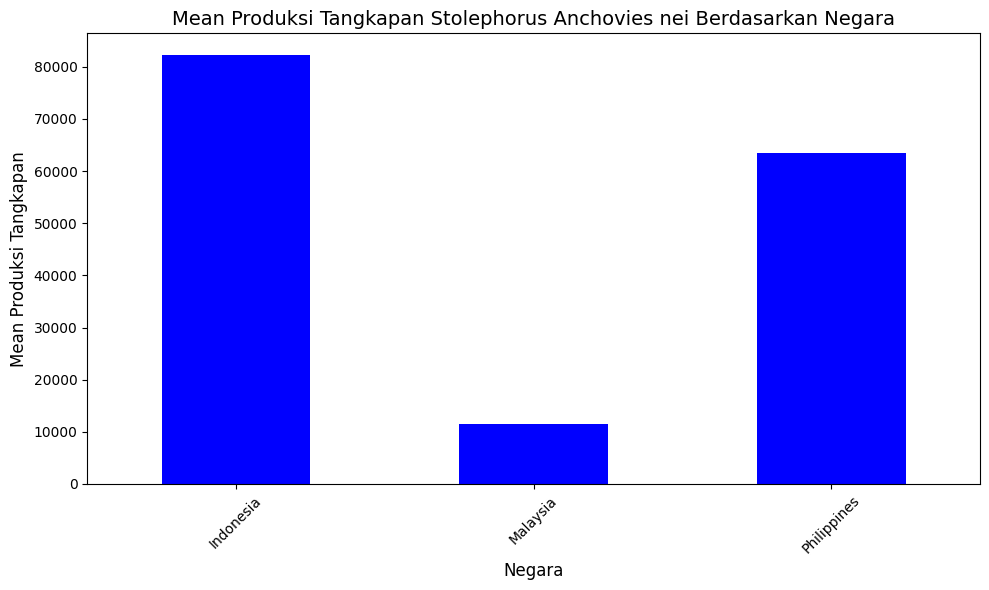

In [ ]:
# Plot Stolephorus Anchovies nei bar chart for every country.
stole_df = df_marine[df_marine["Species"] == "Stolephorus anchovies nei"]

mean_by_country = stole_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Stolephorus Anchovies nei Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


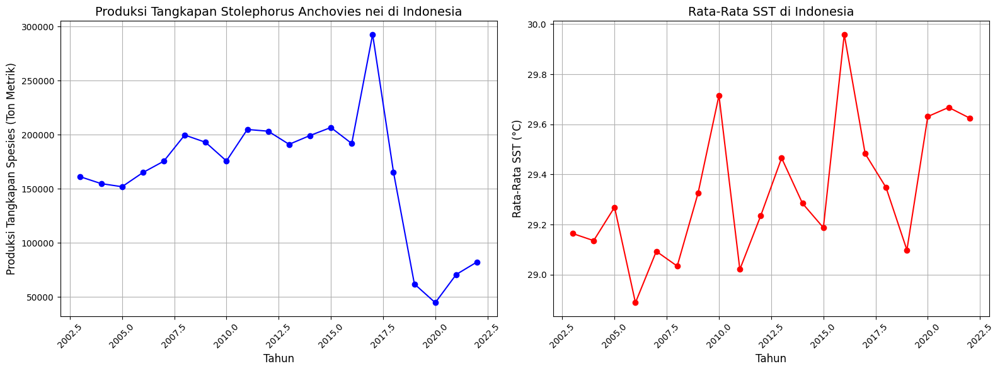

In [ ]:
# Extract Stolephorus anchovies nei in Indonesia
stole_id = df_marine[(df_marine["Species"] == "Stolephorus anchovies nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
stole_id = stole_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
stole_id = stole_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
stole_id = stole_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
stole_id = hs_interval(stole_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(stole_id["PERIOD"], stole_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Stolephorus Anchovies nei di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(stole_id["PERIOD"], stole_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(stole_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.8864962401076629
p-value: 0.023198614942506936


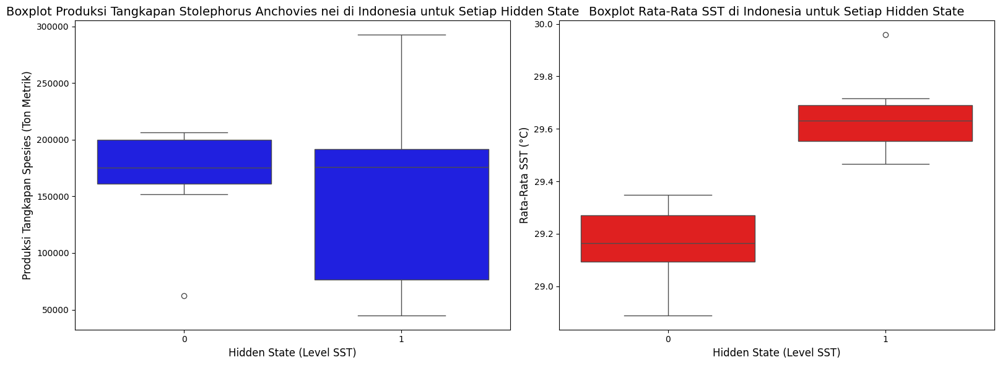

T-statistic: 0.6463863550217038, P-value: 0.5378282939181288
Observation Data: 
 [[161141.   ]
 [154811.   ]
 [151926.   ]
 [165024.   ]
 [175522.   ]
 [199675.   ]
 [192966.   ]
 [175726.   ]
 [204839.   ]
 [203220.   ]
 [191094.   ]
 [199226.   ]
 [206635.   ]
 [191842.   ]
 [292656.929]
 [165312.51 ]
 [ 62106.334]
 [ 44810.319]
 [ 70821.906]
 [ 82442.03 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = stole_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Stolephorus Anchovies nei di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = stole_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
stole_id_0 = stole_id[stole_id["Hidden State (Interval)"] == 0]["VALUE"]
stole_id_1 = stole_id[stole_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(stole_id_0, stole_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
stole_id_hs_int = stole_id.pop("Hidden State (Interval)").values

stole_id_x = stole_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
stole_id_x = stole_id_x.values

print("Observation Data: \n", stole_id_x)
print("Hidden State - Interval: \n", stole_id_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
#trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(stole_id_x, stole_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(stole_id_x, stole_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]


### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


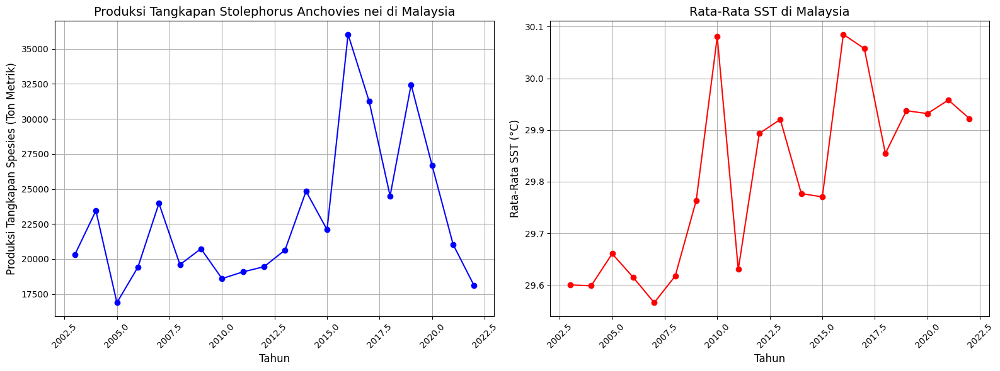

In [ ]:
# Extract Stolephorus anchovies nei in Malaysia
stole_my = df_marine[(df_marine["Species"] == "Stolephorus anchovies nei") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
stole_my = stole_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
stole_my = stole_my.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
stole_my = stole_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
stole_my = hs_interval(stole_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(stole_my["PERIOD"], stole_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Stolephorus Anchovies nei di Malaysia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(stole_my["PERIOD"], stole_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Malaysia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(stole_my["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.8612771129148452
p-value: 0.008284803764555907


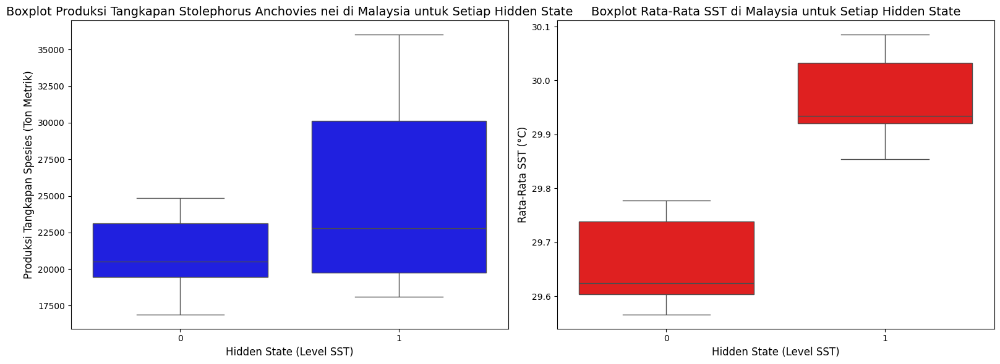

T-statistic: -1.7550684526033484, P-value: 0.1054664199426077
Observation Data: 
 [[20319.   ]
 [23449.   ]
 [16887.   ]
 [19425.   ]
 [23975.   ]
 [19600.   ]
 [20735.   ]
 [18605.   ]
 [19085.   ]
 [19452.   ]
 [20643.   ]
 [24837.   ]
 [22093.   ]
 [36027.   ]
 [31267.   ]
 [24503.   ]
 [32440.48 ]
 [26667.333]
 [21038.   ]
 [18098.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = stole_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Stolephorus Anchovies nei di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = stole_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
stole_my_0 = stole_my[stole_my["Hidden State (Interval)"] == 0]["VALUE"]
stole_my_1 = stole_my[stole_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(stole_my_0, stole_my_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
stole_my_hs_int = stole_my.pop("Hidden State (Interval)").values

stole_my_x = stole_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
stole_my_x = stole_my_x.values

print("Observation Data: \n", stole_my_x)
print("Hidden State - Interval: \n", stole_my_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(stole_my_x, stole_my_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(stole_my_x, stole_my_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 0 0 0 0]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 0 0]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

stole_my = pd.concat([stole_my.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

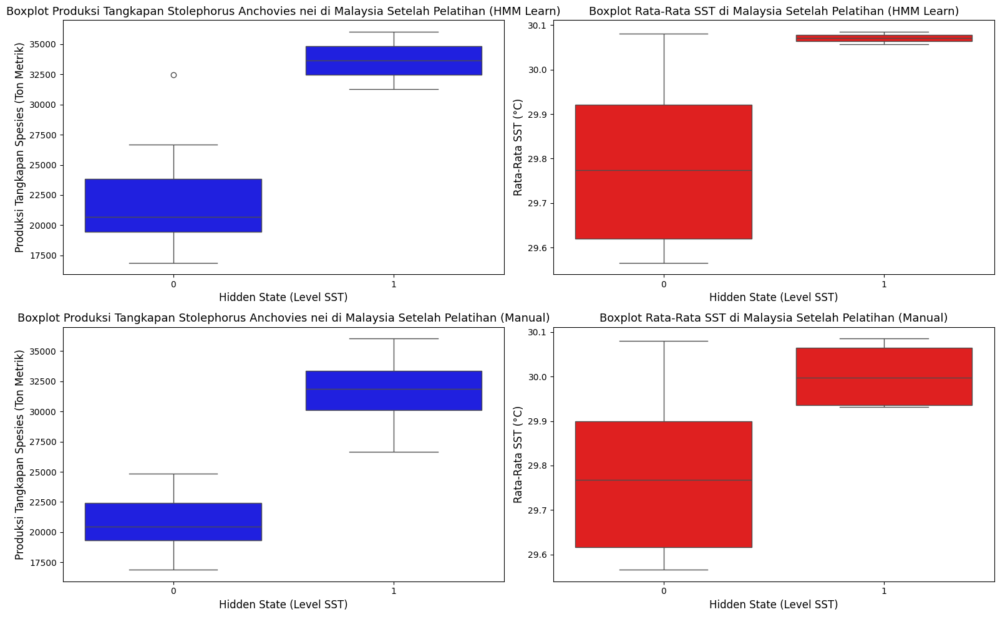

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=stole_my, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Stolephorus Anchovies nei di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=stole_my, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=stole_my, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Stolephorus Anchovies nei di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=stole_my, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = stole_my.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = stole_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = stole_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.783205
1    30.071389
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.764277
1    30.003009
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


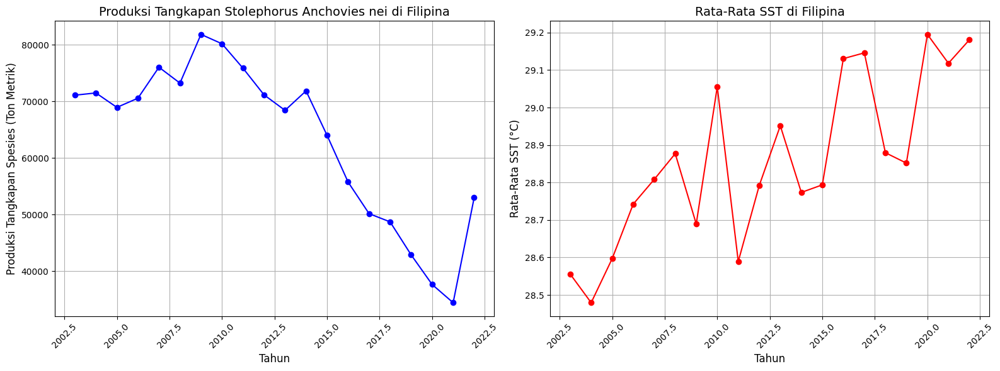

In [ ]:
# Extract Stolephorus anchovies nei in Philippines
stole_ph = df_marine[(df_marine["Species"] == "Stolephorus anchovies nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
stole_ph = stole_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
stole_ph = stole_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
stole_ph = stole_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
stole_ph = hs_interval(stole_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(stole_ph["PERIOD"], stole_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Stolephorus Anchovies nei di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(stole_ph["PERIOD"], stole_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(stole_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.894873746018229
p-value: 0.0330873401322866


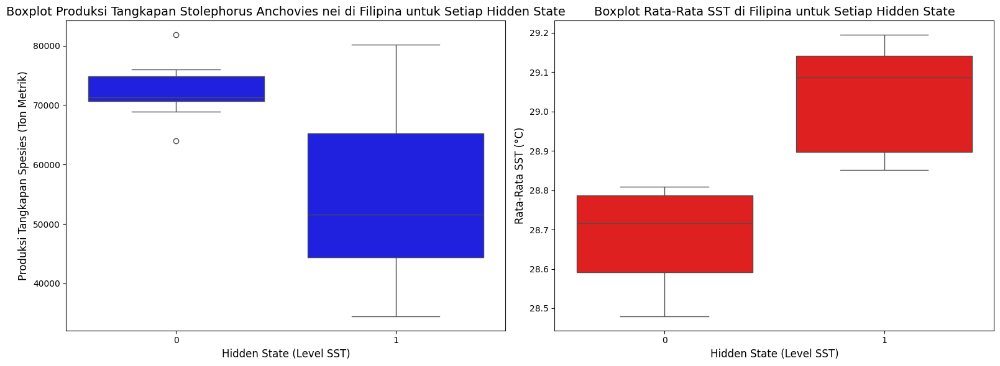

T-statistic: 3.5403475989042263, P-value: 0.004792716354274501
Observation Data: 
 [[71101.   ]
 [71498.   ]
 [68947.   ]
 [70569.   ]
 [76042.   ]
 [73235.   ]
 [81842.   ]
 [80183.   ]
 [75867.   ]
 [71165.   ]
 [68425.   ]
 [71855.   ]
 [64007.   ]
 [55761.   ]
 [50174.   ]
 [48723.   ]
 [42900.   ]
 [37663.26 ]
 [34445.44 ]
 [52993.623]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = stole_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Stolephorus Anchovies nei di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = stole_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
stole_ph_0 = stole_ph[stole_ph["Hidden State (Interval)"] == 0]["VALUE"]
stole_ph_1 = stole_ph[stole_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(stole_ph_0, stole_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
stole_ph_hs_int = stole_ph.pop("Hidden State (Interval)").values

stole_ph_x = stole_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
stole_ph_x = stole_ph_x.values

print("Observation Data: \n", stole_ph_x)
print("Hidden State - Interval: \n", stole_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(stole_ph_x, stole_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(stole_ph_x, stole_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

stole_ph = pd.concat([stole_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

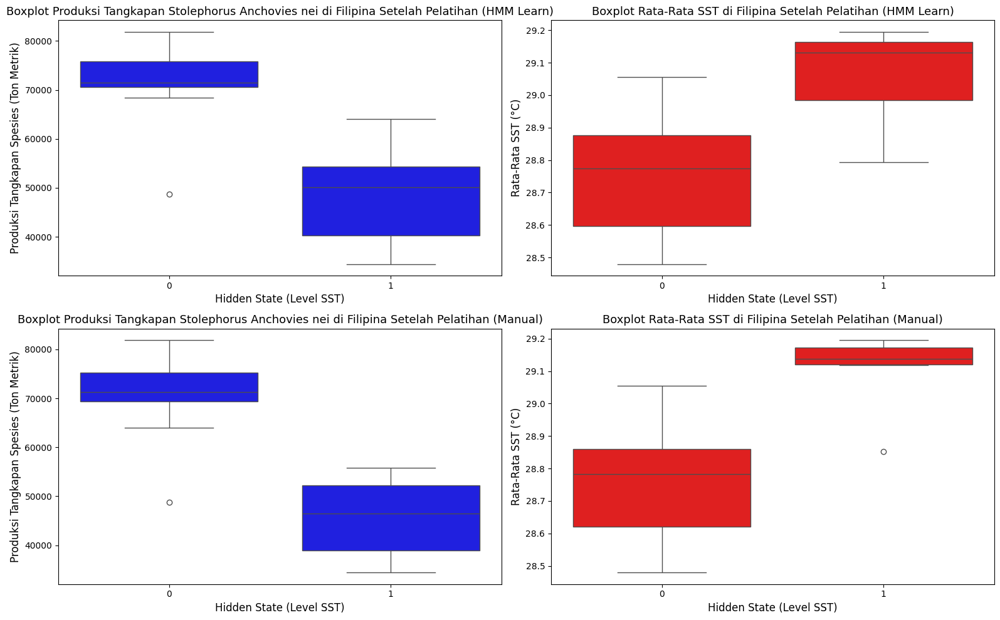

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=stole_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Stolephorus Anchovies nei di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=stole_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=stole_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Stolephorus Anchovies nei di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=stole_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = stole_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = stole_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = stole_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.753167
1    29.059456
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.756068
1    29.103735
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
stole_ph_0 = stole_ph[stole_ph["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
stole_ph_1 = stole_ph[stole_ph["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(stole_ph_0, stole_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
stole_ph_0 = stole_ph[stole_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
stole_ph_1 = stole_ph[stole_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(stole_ph_0, stole_ph_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -3.9438697955865374, p-value: 0.001785400293382692
Manual Code -- t-statistic: -5.161099024134963, p-value: 0.00023127594154200462


## Kawakawa (done)

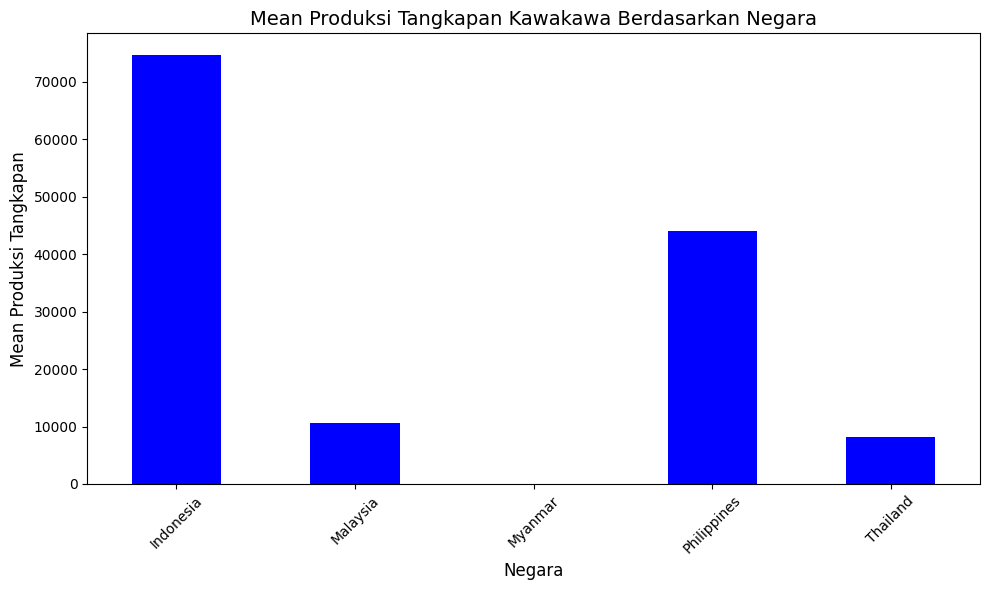

In [ ]:
# Plot Kawakawa bar chart for every country.
kawakawa_df = df_marine[df_marine["Species"] == "Kawakawa"]

mean_by_country = kawakawa_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Kawakawa Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


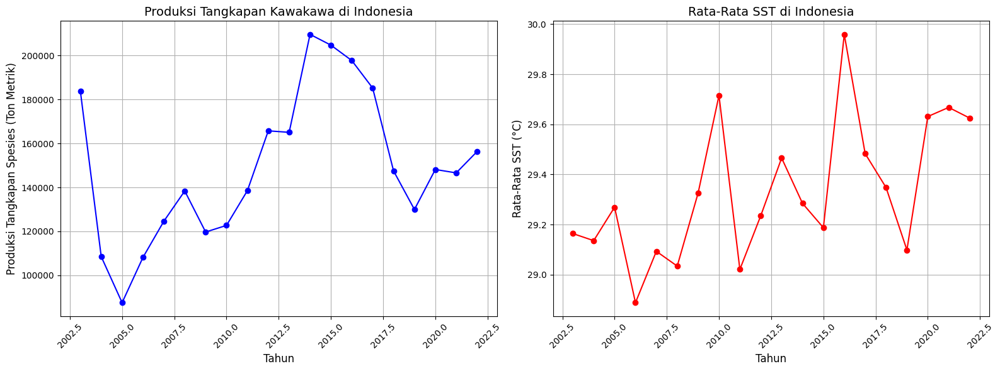

In [ ]:
# Extract Kawakawa in Indonesia
kawakawa_id = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_id = kawakawa_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_id = kawakawa_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
kawakawa_id = kawakawa_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
kawakawa_id = hs_interval(kawakawa_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_id["PERIOD"], kawakawa_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Kawakawa di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(kawakawa_id["PERIOD"], kawakawa_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(kawakawa_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9698973712287036
p-value: 0.752704868402275


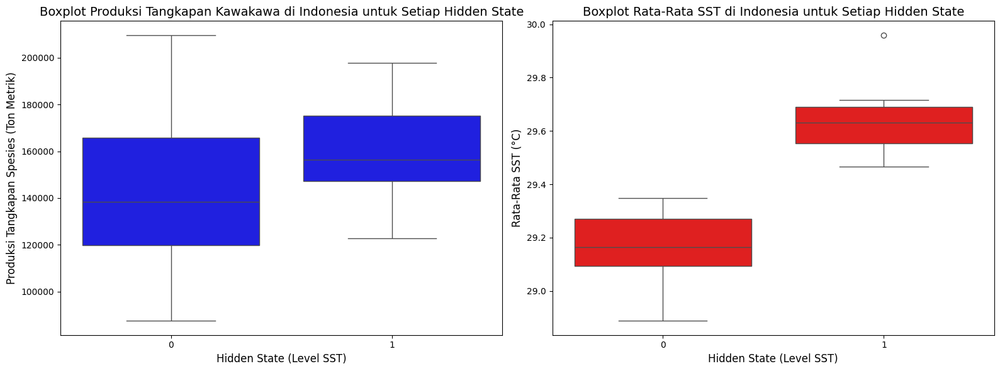

T-statistic: -1.177638510026559, P-value: 0.2552604165615726
Observation Data: 
 [[183864.   ]
 [108529.   ]
 [ 87583.   ]
 [108195.   ]
 [124634.   ]
 [138384.   ]
 [119713.   ]
 [122726.   ]
 [138528.   ]
 [165719.189]
 [165041.   ]
 [209578.809]
 [204687.161]
 [197680.647]
 [185163.121]
 [147505.086]
 [129952.316]
 [148146.419]
 [146602.587]
 [156308.933]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Kawakawa di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_id_0 = kawakawa_id[kawakawa_id["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_id_1 = kawakawa_id[kawakawa_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_id_0, kawakawa_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_id_hs_int = kawakawa_id.pop("Hidden State (Interval)").values

kawakawa_id_x = kawakawa_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_id_x = kawakawa_id_x.values

print("Observation Data: \n", kawakawa_id_x)
print("Hidden State - Interval: \n", kawakawa_id_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(kawakawa_id_x, kawakawa_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(kawakawa_id_x, kawakawa_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 0 0 0 0 0 0 0 0 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 0 0 0 0]
Actual HS (test):    [0 0 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [1 0 0 0 0 0 0 0 0 0 0 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 0 0 0 0]
Actual HS (test):    [0 0 1 1 1]


### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


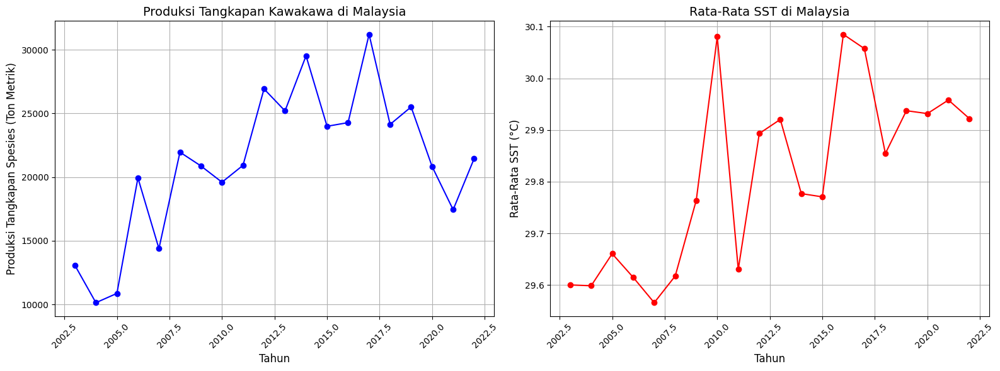

In [ ]:
# Extract Kawakawa in Malaysia
kawakawa_my = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_my = kawakawa_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_my = kawakawa_my.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
kawakawa_my = kawakawa_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
kawakawa_my = hs_interval(kawakawa_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_my["PERIOD"], kawakawa_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Kawakawa di Malaysia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(kawakawa_my["PERIOD"], kawakawa_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Malaysia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(kawakawa_my["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9608005114125203
p-value: 0.5599636400485961


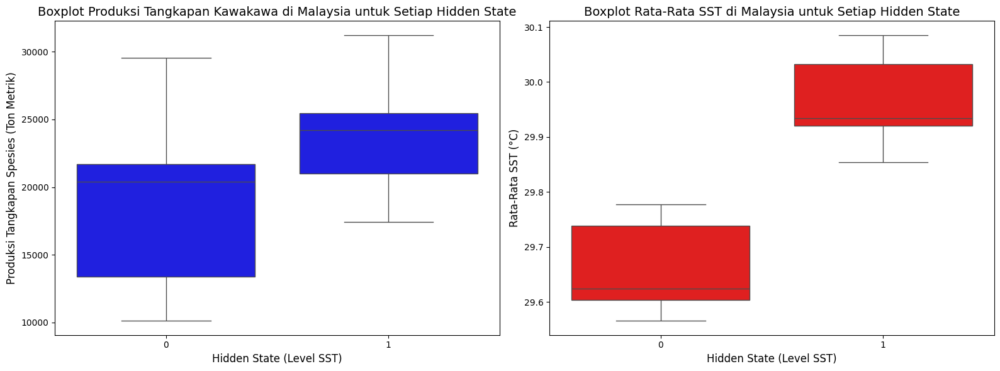

T-statistic: -2.173600485376653, P-value: 0.04587823352144075
Observation Data: 
 [[13075.   ]
 [10136.   ]
 [10866.   ]
 [19940.   ]
 [14384.   ]
 [21962.   ]
 [20877.   ]
 [19602.   ]
 [20927.   ]
 [26931.181]
 [25206.   ]
 [29533.   ]
 [23995.   ]
 [24284.321]
 [31216.054]
 [24144.878]
 [25515.532]
 [20830.37 ]
 [17442.073]
 [21462.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Kawakawa di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_my_0 = kawakawa_my[kawakawa_my["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_my_1 = kawakawa_my[kawakawa_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_my_0, kawakawa_my_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_my_hs_int = kawakawa_my.pop("Hidden State (Interval)").values

kawakawa_my_x = kawakawa_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_my_x = kawakawa_my_x.values

print("Observation Data: \n", kawakawa_my_x)
print("Hidden State - Interval: \n", kawakawa_my_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(kawakawa_my_x, kawakawa_my_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(kawakawa_my_x, kawakawa_my_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

kawakawa_my = pd.concat([kawakawa_my.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

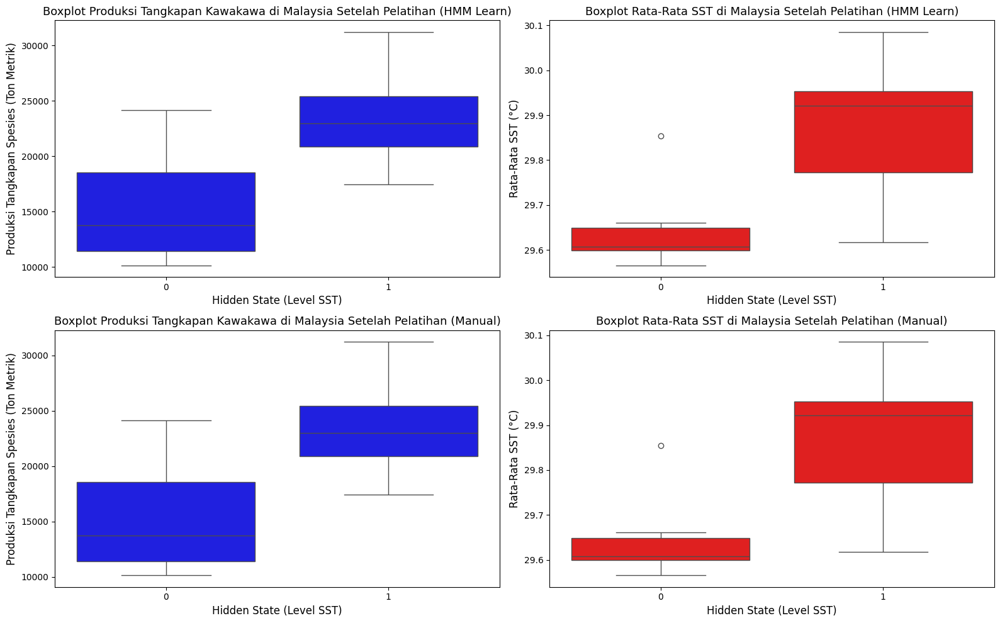

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=kawakawa_my, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Kawakawa di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=kawakawa_my, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=kawakawa_my, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Kawakawa di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=kawakawa_my, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = kawakawa_my.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = kawakawa_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = kawakawa_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.649115
1    29.881842
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.649115
1    29.881842
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
kawakawa_my_0 = kawakawa_my[kawakawa_my["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
kawakawa_my_1 = kawakawa_my[kawakawa_my["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_my_0, kawakawa_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
kawakawa_my_0 = kawakawa_my[kawakawa_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
kawakawa_my_1 = kawakawa_my[kawakawa_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_my_0, kawakawa_my_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -3.946509401877047, p-value: 0.0015324276190569503
Manual Code -- t-statistic: -3.946509401877047, p-value: 0.0015324276190569503


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


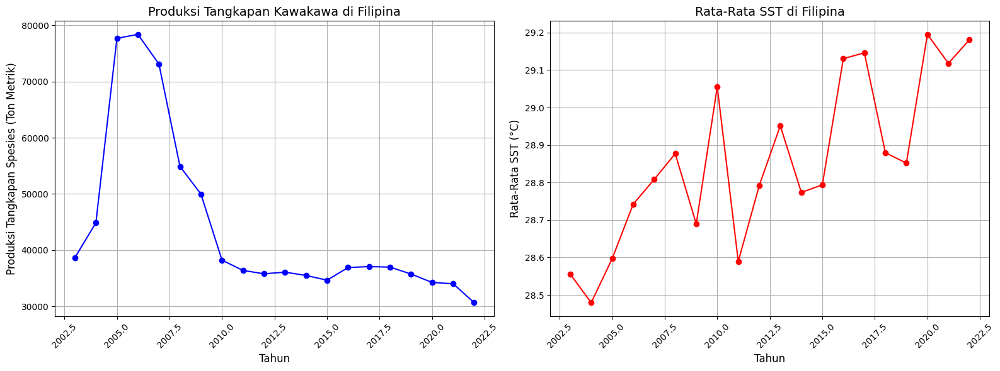

In [ ]:
# Extract Kawakawa in Philippines
kawakawa_ph = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_ph = kawakawa_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_ph = kawakawa_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
kawakawa_ph = kawakawa_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
kawakawa_ph = hs_interval(kawakawa_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_ph["PERIOD"], kawakawa_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Kawakawa di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(kawakawa_ph["PERIOD"], kawakawa_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(kawakawa_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.6988228881665097
p-value: 3.772004330157595e-05


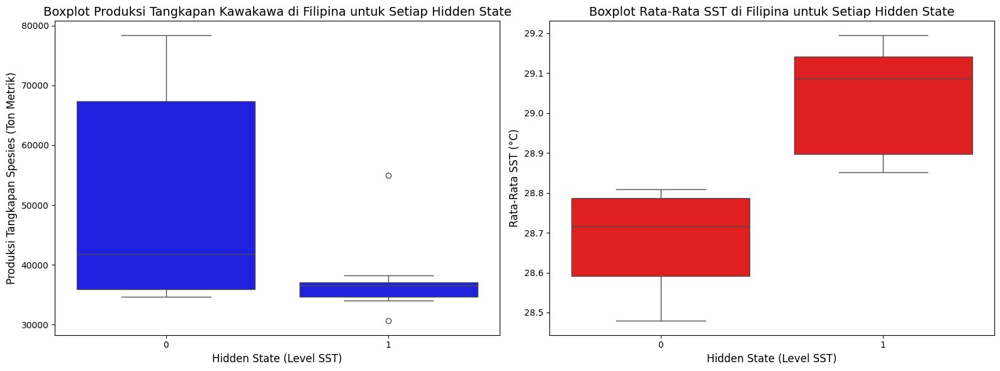

T-statistic: 2.096168536043017, P-value: 0.0596131098898555
Observation Data: 
 [[38675.   ]
 [44875.   ]
 [77674.   ]
 [78377.   ]
 [73094.   ]
 [54907.   ]
 [49973.   ]
 [38237.   ]
 [36403.   ]
 [35807.   ]
 [36100.   ]
 [35514.   ]
 [34671.   ]
 [36918.   ]
 [37090.   ]
 [36993.   ]
 [35759.   ]
 [34273.26 ]
 [34035.85 ]
 [30668.855]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Kawakawa di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_ph_0 = kawakawa_ph[kawakawa_ph["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_ph_1 = kawakawa_ph[kawakawa_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_ph_0, kawakawa_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_ph_hs_int = kawakawa_ph.pop("Hidden State (Interval)").values

kawakawa_ph_x = kawakawa_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_ph_x = kawakawa_ph_x.values

print("Observation Data: \n", kawakawa_ph_x)
print("Hidden State - Interval: \n", kawakawa_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(kawakawa_ph_x, kawakawa_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(kawakawa_ph_x, kawakawa_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 1 1 1 0]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

kawakawa_ph = pd.concat([kawakawa_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

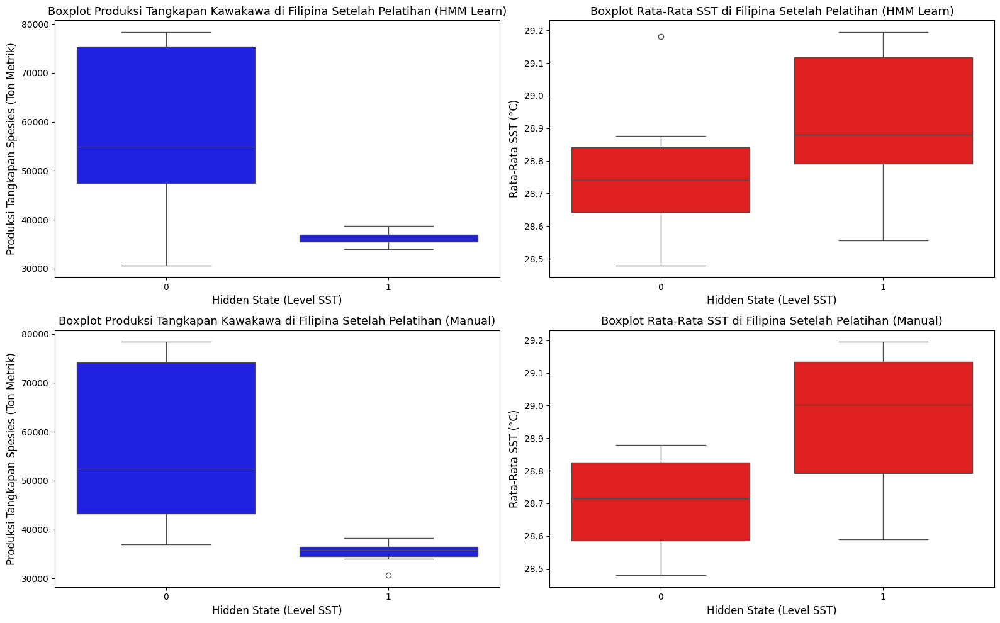

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=kawakawa_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Kawakawa di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=kawakawa_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=kawakawa_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Kawakawa di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=kawakawa_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = kawakawa_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = kawakawa_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = kawakawa_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.767772
1    28.910228
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.703631
1    28.964860
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
kawakawa_ph_0 = kawakawa_ph[kawakawa_ph["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
kawakawa_ph_1 = kawakawa_ph[kawakawa_ph["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_ph_0, kawakawa_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
kawakawa_ph_0 = kawakawa_ph[kawakawa_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
kawakawa_ph_1 = kawakawa_ph[kawakawa_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_ph_0, kawakawa_ph_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -1.3823779635970537, p-value: 0.19271016706395538
Manual Code -- t-statistic: -3.331720902823341, p-value: 0.003788563791837182


### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


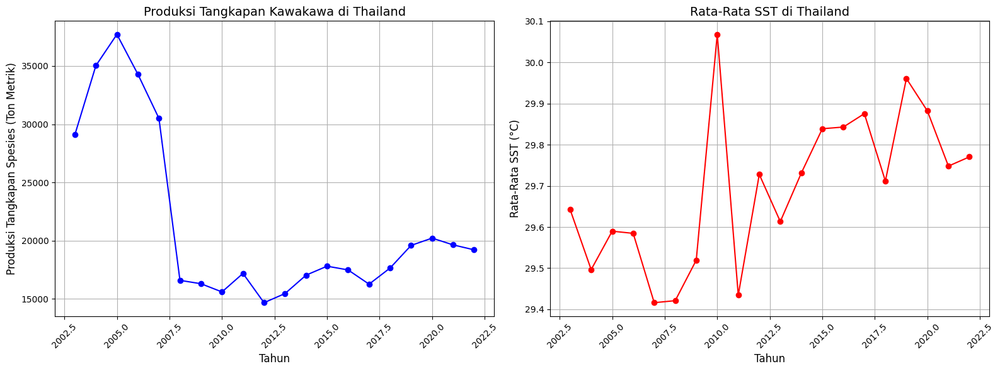

In [50]:
# Extract Kawakawa in Thailand
kawakawa_th = df_marine[(df_marine["Species"] == "Kawakawa") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
kawakawa_th = kawakawa_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
kawakawa_th = kawakawa_th.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
kawakawa_th = kawakawa_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
kawakawa_th = hs_interval(kawakawa_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(kawakawa_th["PERIOD"], kawakawa_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Kawakawa di Thailand", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(kawakawa_th["PERIOD"], kawakawa_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Thailand", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [51]:
# Saphiro-Wilk Test
stat, p_value = shapiro(kawakawa_th["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.7582555027875442
p-value: 0.00021951348422922717


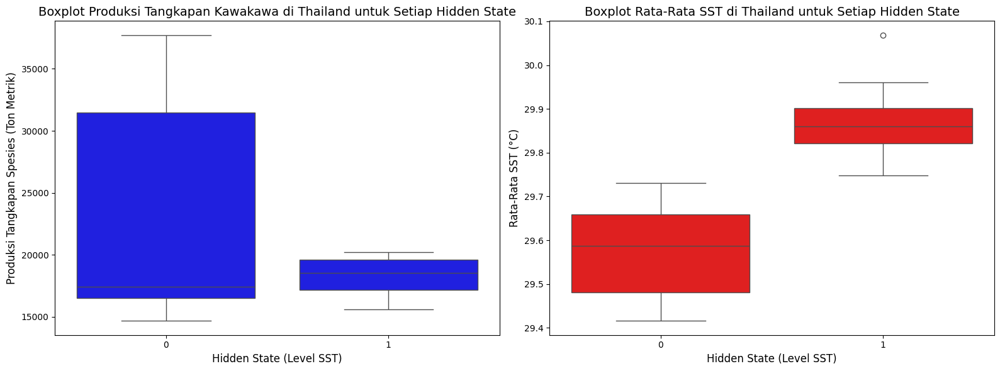

T-statistic: 1.9640554590229322, P-value: 0.07280055773943121
Observation Data: 
 [[29105.   ]
 [35028.   ]
 [37711.   ]
 [34284.   ]
 [30504.   ]
 [16601.   ]
 [16310.   ]
 [15607.   ]
 [17195.64 ]
 [14682.66 ]
 [15467.46 ]
 [17045.1  ]
 [17815.6  ]
 [17495.416]
 [16272.519]
 [17658.91 ]
 [19600.75 ]
 [20225.   ]
 [19643.09 ]
 [19219.07 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [52]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = kawakawa_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Kawakawa di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = kawakawa_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
kawakawa_th_0 = kawakawa_th[kawakawa_th["Hidden State (Interval)"] == 0]["VALUE"]
kawakawa_th_1 = kawakawa_th[kawakawa_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(kawakawa_th_0, kawakawa_th_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
kawakawa_th_hs_int = kawakawa_th.pop("Hidden State (Interval)").values

kawakawa_th_x = kawakawa_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
kawakawa_th_x = kawakawa_th_x.values

print("Observation Data: \n", kawakawa_th_x)
print("Hidden State - Interval: \n", kawakawa_th_hs_int)

#### Model

In [53]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(kawakawa_th_x, kawakawa_th_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(kawakawa_th_x, kawakawa_th_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]


In [60]:
print(init_transmat_hmm)
print(trained_transmat_hmm)
print("---")
print(init_transmat_mc)
print(trained_transmat_mc)

[[0.75         0.25        ]
 [0.2857142857 0.7142857143]]
[[0.8000000058 0.1999999942]
 [0.           1.          ]]
---
[[0.75         0.25        ]
 [0.2857142857 0.7142857143]]
[[0.8000000052 0.1999999948]
 [0.           1.          ]]


In [54]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

kawakawa_th = pd.concat([kawakawa_th.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

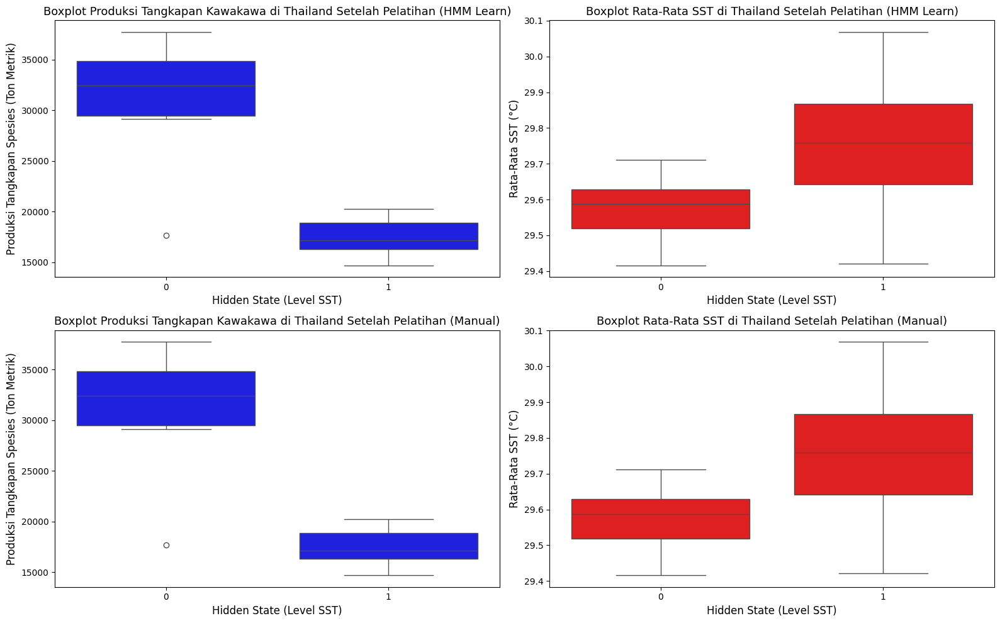

In [55]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=kawakawa_th, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Kawakawa di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=kawakawa_th, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=kawakawa_th, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Kawakawa di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=kawakawa_th, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [56]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = kawakawa_th.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = kawakawa_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = kawakawa_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.573520
1    29.745377
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.573520
1    29.745377
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64


In [57]:
# Welch's t-test for each HS
# HMM Learn
kawakawa_th_0 = kawakawa_th[kawakawa_th["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
kawakawa_th_1 = kawakawa_th[kawakawa_th["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_th_0, kawakawa_th_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
kawakawa_th_0 = kawakawa_th[kawakawa_th["Predicted HS (Manual Code)"] == 0]["Mean SST"]
kawakawa_th_1 = kawakawa_th[kawakawa_th["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(kawakawa_th_0, kawakawa_th_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -2.5768509625228817, p-value: 0.019906483562993845
Manual Code -- t-statistic: -2.5768509625228817, p-value: 0.019906483562993845


## Skipjack tuna (done)

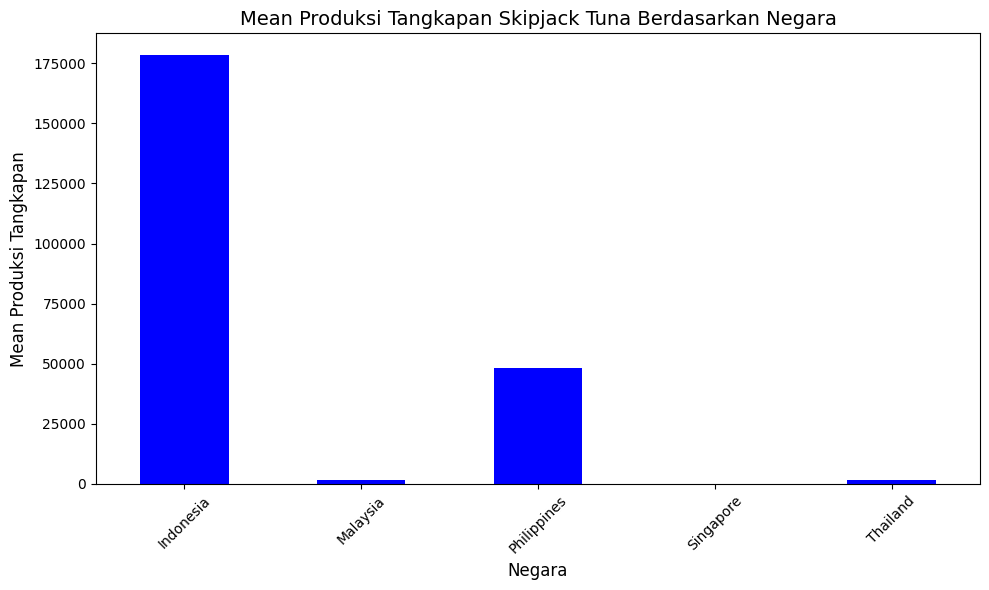

In [ ]:
# Plot Skipjack Tuna bar chart for every country.
skipjack_df = df_marine[df_marine["Species"] == "Skipjack tuna"]

mean_by_country = skipjack_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Skipjack Tuna Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


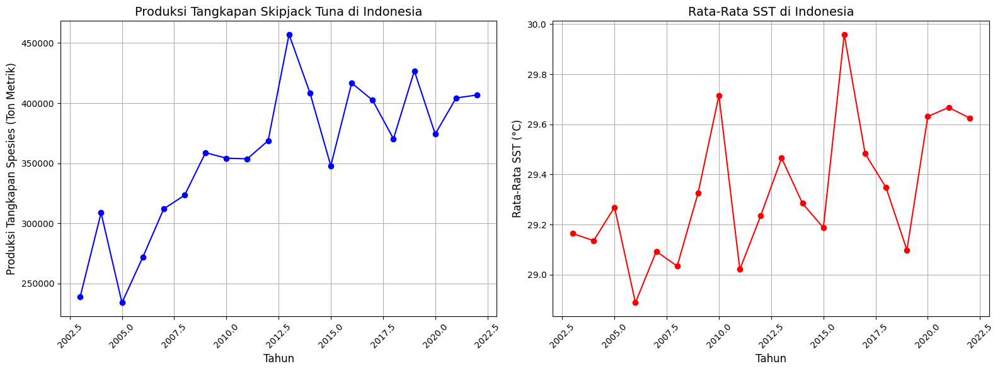

In [ ]:
# Extract Skipjack tuna in Indonesia
skipjack_id = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_id = skipjack_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_id = skipjack_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
skipjack_id = skipjack_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
skipjack_id = hs_interval(skipjack_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_id["PERIOD"], skipjack_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Skipjack Tuna di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(skipjack_id["PERIOD"], skipjack_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(skipjack_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9490398467197336
p-value: 0.35275065447547166


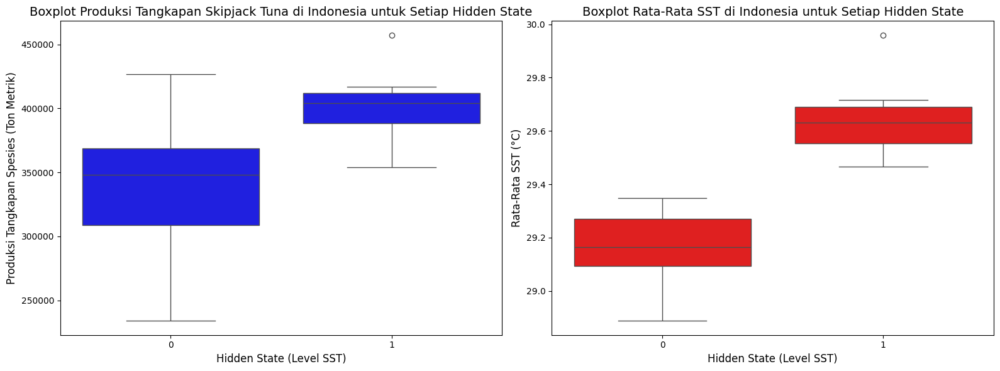

T-statistic: -3.397768414811746, P-value: 0.003218411586889376
Observation Data: 
 [[238966.   ]
 [308809.   ]
 [234069.   ]
 [271984.   ]
 [312105.   ]
 [323438.   ]
 [358836.   ]
 [354258.   ]
 [353727.   ]
 [368810.335]
 [457218.123]
 [408640.224]
 [347907.704]
 [416784.696]
 [402448.744]
 [370367.38 ]
 [426847.336]
 [374288.426]
 [404358.081]
 [406770.564]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_id_0 = skipjack_id[skipjack_id["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_id_1 = skipjack_id[skipjack_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_id_0, skipjack_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_id_hs_int = skipjack_id.pop("Hidden State (Interval)").values

skipjack_id_x = skipjack_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_id_x = skipjack_id_x.values

print("Observation Data: \n", skipjack_id_x)
print("Hidden State - Interval: \n", skipjack_id_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(skipjack_id_x, skipjack_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(skipjack_id_x, skipjack_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

skipjack_id = pd.concat([skipjack_id.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

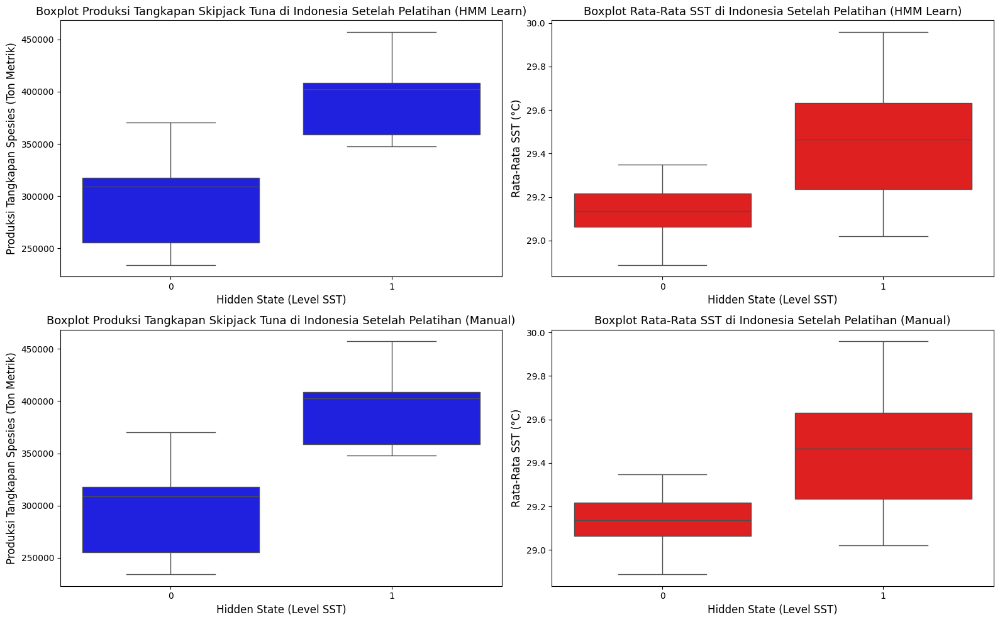

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=skipjack_id, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=skipjack_id, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=skipjack_id, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=skipjack_id, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = skipjack_id.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.133284
1    29.438447
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.133284
1    29.438447
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
skipjack_id_0 = skipjack_id[skipjack_id["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
skipjack_id_1 = skipjack_id[skipjack_id["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_id_0, skipjack_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
skipjack_id_0 = skipjack_id[skipjack_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_id_1 = skipjack_id[skipjack_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_id_0, skipjack_id_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -3.204953146872363, p-value: 0.004923795196989459
Manual Code -- t-statistic: -3.204953146872363, p-value: 0.004923795196989459


### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


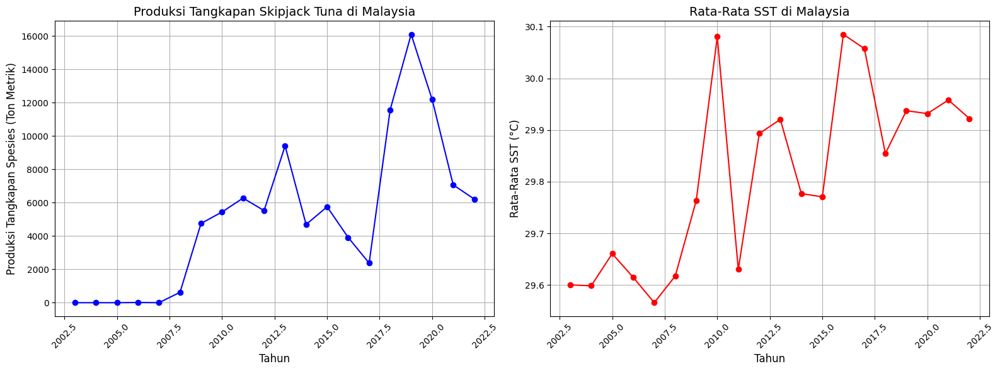

In [ ]:
# Extract Skipjack tuna in Malaysia
skipjack_my = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_my = skipjack_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_my = skipjack_my.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
skipjack_my = skipjack_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
skipjack_my = hs_interval(skipjack_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_my["PERIOD"], skipjack_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Skipjack Tuna di Malaysia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(skipjack_my["PERIOD"], skipjack_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Malaysia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(skipjack_my["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.9043630461914896
p-value: 0.04982187122554329


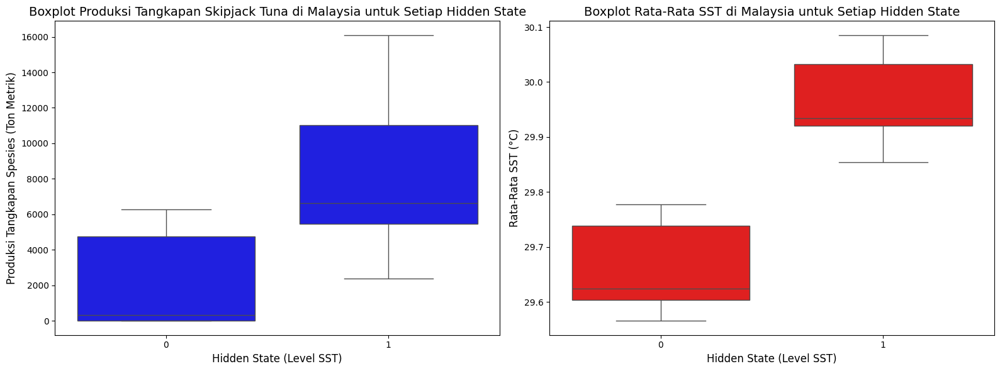

T-statistic: -3.5978869706618717, P-value: 0.002531739369935062
Observation Data: 
 [[    0.   ]
 [    0.   ]
 [    0.   ]
 [   12.   ]
 [    0.   ]
 [  622.   ]
 [ 4753.   ]
 [ 5438.   ]
 [ 6273.   ]
 [ 5523.44 ]
 [ 9399.   ]
 [ 4689.11 ]
 [ 5751.   ]
 [ 3916.558]
 [ 2373.329]
 [11568.361]
 [16090.227]
 [12176.306]
 [ 7066.479]
 [ 6216.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_my_0 = skipjack_my[skipjack_my["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_my_1 = skipjack_my[skipjack_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_my_0, skipjack_my_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_my_hs_int = skipjack_my.pop("Hidden State (Interval)").values

skipjack_my_x = skipjack_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_my_x = skipjack_my_x.values

print("Observation Data: \n", skipjack_my_x)
print("Hidden State - Interval: \n", skipjack_my_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(skipjack_my_x, skipjack_my_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(skipjack_my_x, skipjack_my_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

skipjack_my = pd.concat([skipjack_my.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

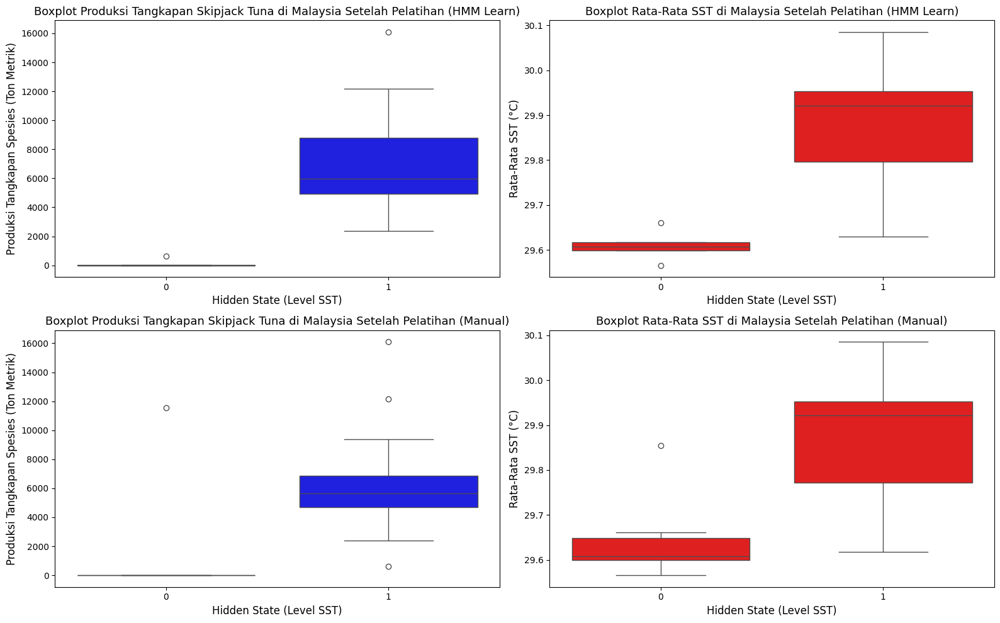

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=skipjack_my, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=skipjack_my, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=skipjack_my, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=skipjack_my, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = skipjack_my.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.609594
1    29.898779
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.649115
1    29.881842
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
skipjack_my_0 = skipjack_my[skipjack_my["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
skipjack_my_1 = skipjack_my[skipjack_my["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_my_0, skipjack_my_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
skipjack_my_0 = skipjack_my[skipjack_my["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_my_1 = skipjack_my[skipjack_my["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_my_0, skipjack_my_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -7.7584557062171955, p-value: 8.529511562259768e-07
Manual Code -- t-statistic: -3.946509401877047, p-value: 0.0015324276190569503


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


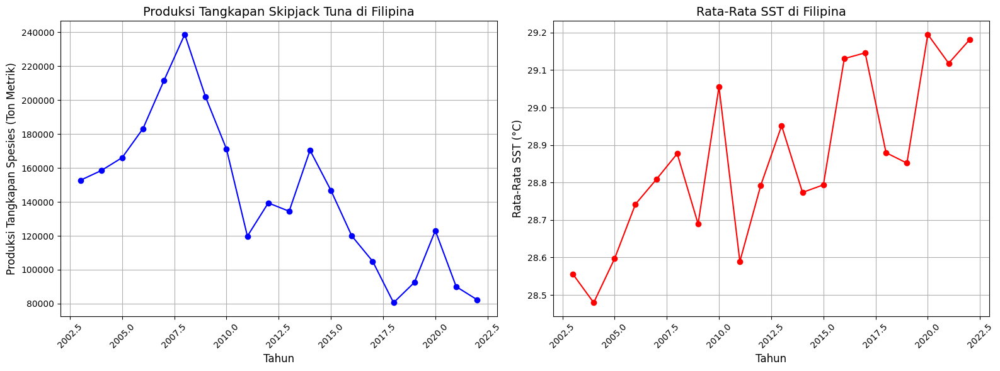

In [ ]:
# Extract Skipjack tuna in Philippines
skipjack_ph = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_ph = skipjack_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_ph = skipjack_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
skipjack_ph = skipjack_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
skipjack_ph = hs_interval(skipjack_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_ph["PERIOD"], skipjack_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Skipjack Tuna di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(skipjack_ph["PERIOD"], skipjack_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(skipjack_ph["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.968172257375493
p-value: 0.715905459785558


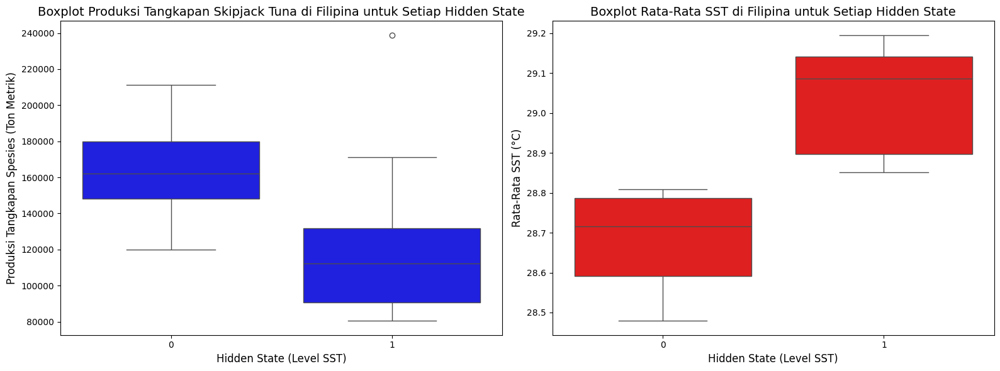

T-statistic: 2.306989075310448, P-value: 0.03647418204320411
Observation Data: 
 [[152740.   ]
 [158480.   ]
 [166081.   ]
 [183221.   ]
 [211440.   ]
 [238787.   ]
 [201782.   ]
 [171110.   ]
 [119807.   ]
 [139394.   ]
 [134484.   ]
 [170444.   ]
 [146789.   ]
 [119938.   ]
 [104964.566]
 [ 80566.   ]
 [ 92551.   ]
 [123117.   ]
 [ 90040.   ]
 [ 82331.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_ph_0 = skipjack_ph[skipjack_ph["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_ph_1 = skipjack_ph[skipjack_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_ph_0, skipjack_ph_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_ph_hs_int = skipjack_ph.pop("Hidden State (Interval)").values

skipjack_ph_x = skipjack_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_ph_x = skipjack_ph_x.values

print("Observation Data: \n", skipjack_ph_x)
print("Hidden State - Interval: \n", skipjack_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(skipjack_ph_x, skipjack_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(skipjack_ph_x, skipjack_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 1 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

skipjack_ph = pd.concat([skipjack_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

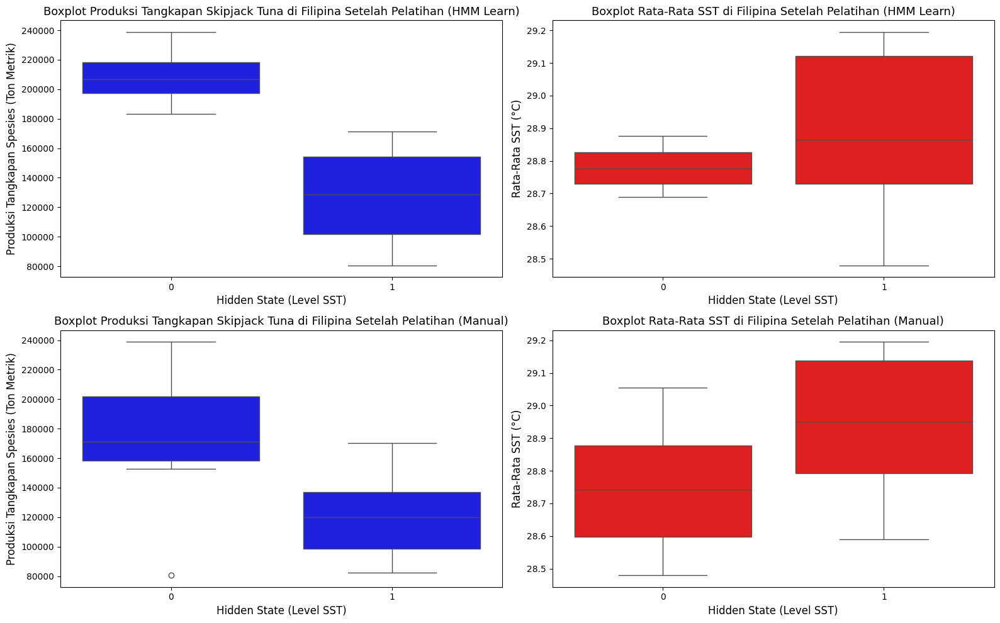

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=skipjack_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=skipjack_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=skipjack_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=skipjack_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = skipjack_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.779289
1    28.880638
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.742713
1    28.956632
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
skipjack_ph_0 = skipjack_ph[skipjack_ph["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
skipjack_ph_1 = skipjack_ph[skipjack_ph["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_ph_0, skipjack_ph_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
skipjack_ph_0 = skipjack_ph[skipjack_ph["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_ph_1 = skipjack_ph[skipjack_ph["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_ph_0, skipjack_ph_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -1.393493308903216, p-value: 0.18298618833720867
Manual Code -- t-statistic: -2.447587505978482, p-value: 0.02494506846812276


### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


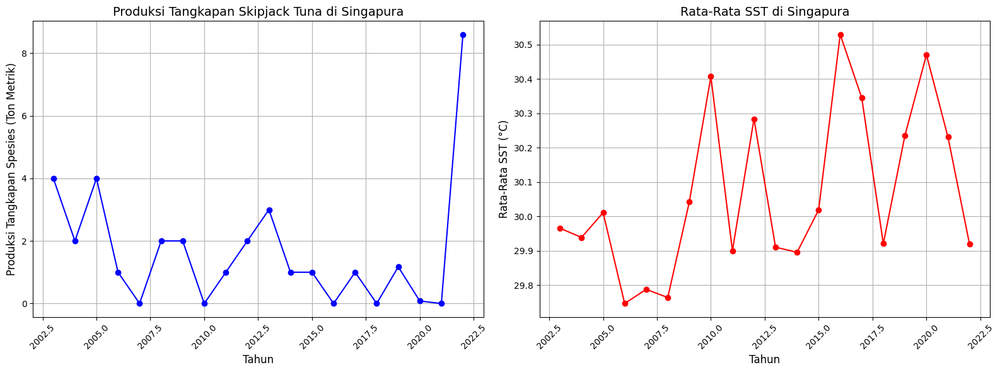

In [ ]:
# Extract Skipjack tuna in Singapore
skipjack_sg = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_sg = skipjack_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_sg = skipjack_sg.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
skipjack_sg = skipjack_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
skipjack_sg = hs_interval(skipjack_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_sg["PERIOD"], skipjack_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Skipjack Tuna di Singapura", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(skipjack_sg["PERIOD"], skipjack_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Singapura", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(skipjack_sg["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.7560714097519255
p-value: 0.00020499722496366275


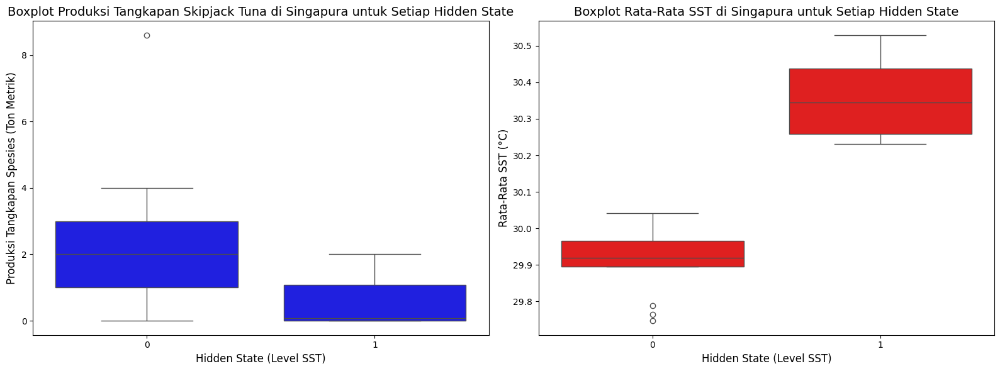

T-statistic: 2.366078538722833, P-value: 0.030670788210267485
Observation Data: 
 [[4.   ]
 [2.   ]
 [4.   ]
 [1.   ]
 [0.   ]
 [2.   ]
 [2.   ]
 [0.   ]
 [1.   ]
 [2.   ]
 [3.   ]
 [1.   ]
 [1.   ]
 [0.   ]
 [1.   ]
 [0.   ]
 [1.172]
 [0.08 ]
 [0.   ]
 [8.6  ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_sg_0 = skipjack_sg[skipjack_sg["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_sg_1 = skipjack_sg[skipjack_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_sg_0, skipjack_sg_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_sg_hs_int = skipjack_sg.pop("Hidden State (Interval)").values

skipjack_sg_x = skipjack_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_sg_x = skipjack_sg_x.values

print("Observation Data: \n", skipjack_sg_x)
print("Hidden State - Interval: \n", skipjack_sg_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(skipjack_sg_x, skipjack_sg_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(skipjack_sg_x, skipjack_sg_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 1 1 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 1 1 1 0]
Actual HS (test):    [0 1 1 1 0]
Manual Code - Interval HS
Predicted HS (train): [0 1 0 1 1 1 1 1 1 1 0 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 1 1 1 0]
Actual HS (test):    [0 1 1 1 0]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

skipjack_sg = pd.concat([skipjack_sg.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

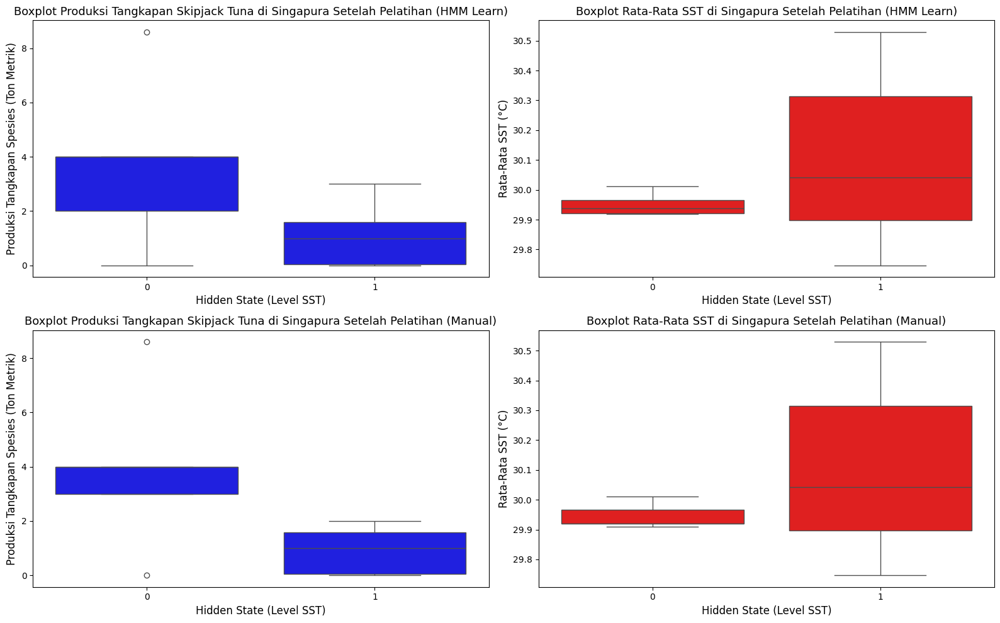

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=skipjack_sg, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Singapura Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=skipjack_sg, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Singapura Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=skipjack_sg, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Singapura Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=skipjack_sg, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Singapura Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = skipjack_sg.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_sg.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = skipjack_sg.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.951250
1    30.104426
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.945551
1    30.106326
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.909475
1    30.357067
Name: Mean SST, dtype: float64


In [ ]:
# Welch's t-test for each HS
# HMM Learn
skipjack_sg_0 = skipjack_sg[skipjack_sg["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
skipjack_sg_1 = skipjack_sg[skipjack_sg["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_sg_0, skipjack_sg_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
skipjack_sg_0 = skipjack_sg[skipjack_sg["Predicted HS (Manual Code)"] == 0]["Mean SST"]
skipjack_sg_1 = skipjack_sg[skipjack_sg["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(skipjack_sg_0, skipjack_sg_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -2.1482615531885196, p-value: 0.04780243635611559
Manual Code -- t-statistic: -2.250793399207198, p-value: 0.03891579977847817


### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


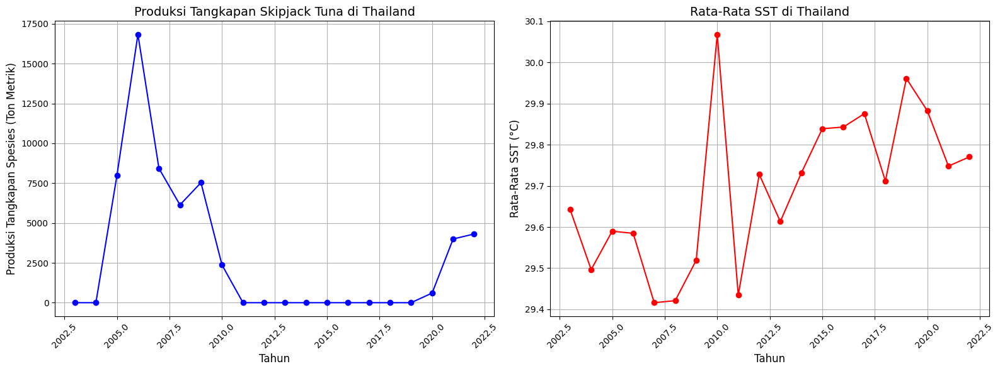

In [ ]:
# Extract Skipjack tuna in Thailand
skipjack_th = df_marine[(df_marine["Species"] == "Skipjack tuna") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
skipjack_th = skipjack_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
skipjack_th = skipjack_th.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
skipjack_th = skipjack_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
skipjack_th = hs_interval(skipjack_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(skipjack_th["PERIOD"], skipjack_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Skipjack Tuna di Thailand", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(skipjack_th["PERIOD"], skipjack_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Thailand", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
# Saphiro-Wilk Test
stat, p_value = shapiro(skipjack_th["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.7095146755258888
p-value: 5.103921879535831e-05


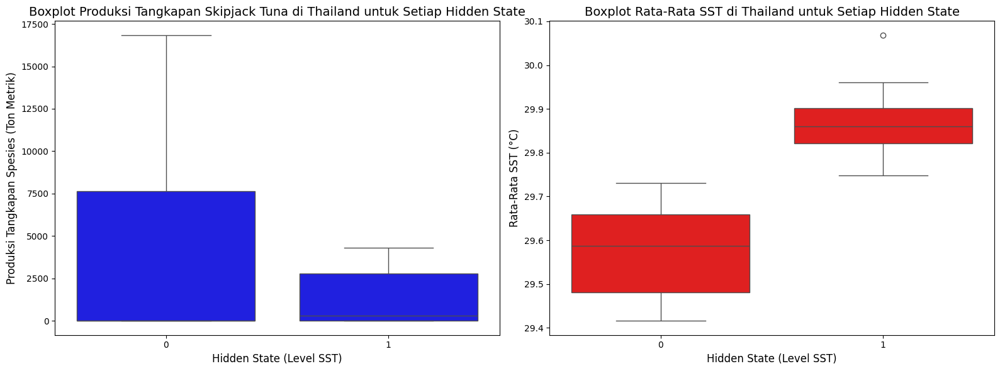

T-statistic: 1.4588279374977344, P-value: 0.16591324809019203
Observation Data: 
 [[    0.]
 [    0.]
 [ 7971.]
 [16836.]
 [ 8428.]
 [ 6138.]
 [ 7532.]
 [ 2369.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [    0.]
 [  605.]
 [ 3997.]
 [ 4312.]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = skipjack_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Skipjack Tuna di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = skipjack_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
skipjack_th_0 = skipjack_th[skipjack_th["Hidden State (Interval)"] == 0]["VALUE"]
skipjack_th_1 = skipjack_th[skipjack_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(skipjack_th_0, skipjack_th_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
skipjack_th_hs_int = skipjack_th.pop("Hidden State (Interval)").values

skipjack_th_x = skipjack_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
skipjack_th_x = skipjack_th_x.values

print("Observation Data: \n", skipjack_th_x)
print("Hidden State - Interval: \n", skipjack_th_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(skipjack_th_x, skipjack_th_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(skipjack_th_x, skipjack_th_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [1 1 0 0 0]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [1 1 0 0 0 0 0 0 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [1 1 0 0 0]
Actual HS (test):    [0 1 1 1 1]


## Common squids nei (done)

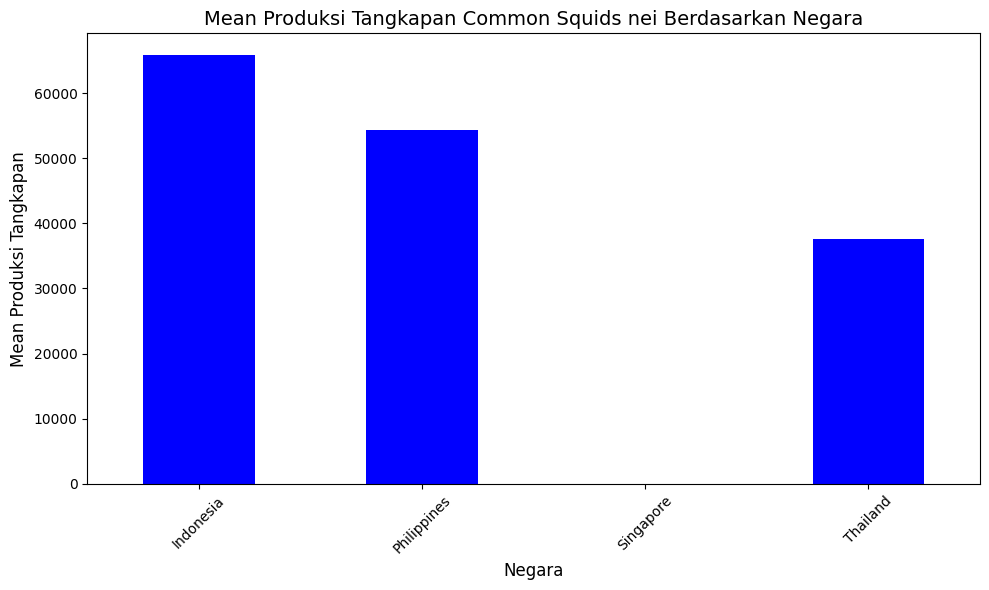

In [ ]:
# Plot Common Squids nei bar chart for every country.
common_df = df_marine[df_marine["Species"] == "Common squids nei"]

mean_by_country = common_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Common Squids nei Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Indonesia

#### Extract Data

Min SST: 28.88819016712257
Max SST: 29.95907131739048
Midpoint: 29.423630742256528


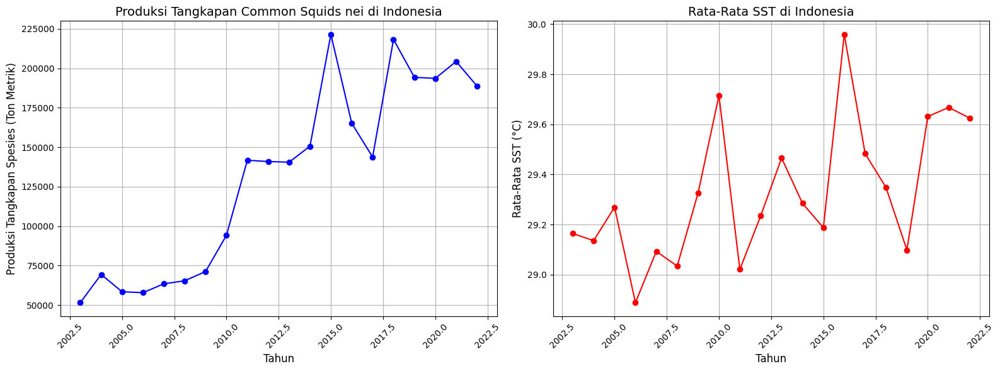

In [61]:
# Extract Common squids nei in Indonesia
common_id = df_marine[(df_marine["Species"] == "Common squids nei") & (df_marine["Country"] == "Indonesia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
common_id = common_id[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
common_id = common_id.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
common_id = common_id.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
common_id = hs_interval(common_id)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(common_id["PERIOD"], common_id["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Common Squids nei di Indonesia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(common_id["PERIOD"], common_id["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Indonesia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [62]:
# Saphiro-Wilk Test
stat, p_value = shapiro(common_id["VALUE"])
print("Stat:", stat)
print("p-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

Stat: 0.8909886829462814
p-value: 0.028042532962127404


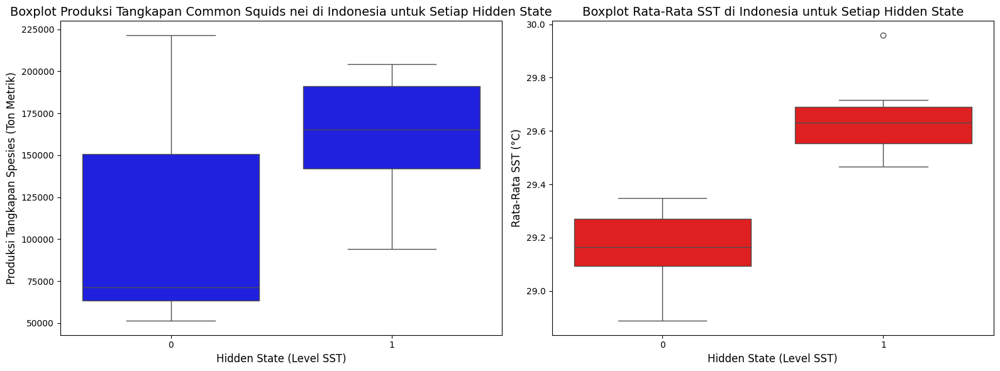

T-statistic: -1.9749025983480004, P-value: 0.06409534337049354
Observation Data: 
 [[ 51482.   ]
 [ 69357.   ]
 [ 58433.   ]
 [ 57821.   ]
 [ 63425.   ]
 [ 65372.   ]
 [ 71236.   ]
 [ 94167.   ]
 [141723.   ]
 [140924.   ]
 [140499.   ]
 [150623.   ]
 [221483.   ]
 [165175.   ]
 [143754.541]
 [218295.12 ]
 [194299.038]
 [193583.839]
 [204337.712]
 [188724.51 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1 0 0 1 1 1]


In [63]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = common_id, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = common_id, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Indonesia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
common_id_0 = common_id[common_id["Hidden State (Interval)"] == 0]["VALUE"]
common_id_1 = common_id[common_id["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(common_id_0, common_id_1, equal_var = False)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
common_id_hs_int = common_id.pop("Hidden State (Interval)").values

common_id_x = common_id.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
common_id_x = common_id_x.values

print("Observation Data: \n", common_id_x)
print("Hidden State - Interval: \n", common_id_hs_int)

#### Model

In [64]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(common_id_x, common_id_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(common_id_x, common_id_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 0 1 1 1]


In [69]:
print(init_means_hmm)
print(trained_means_hmm)
print("---")
print(init_means_mc)
print(trained_means_mc)

[[115728.7044615385]
 [161463.086       ]]
[[ 62401.3524522718]
 [149438.0073065661]]
---
[[115728.7044615385]
 [161463.086       ]]
[[ 62430.4184483622]
 [168942.2670655017]]


In [65]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

common_id = pd.concat([common_id.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

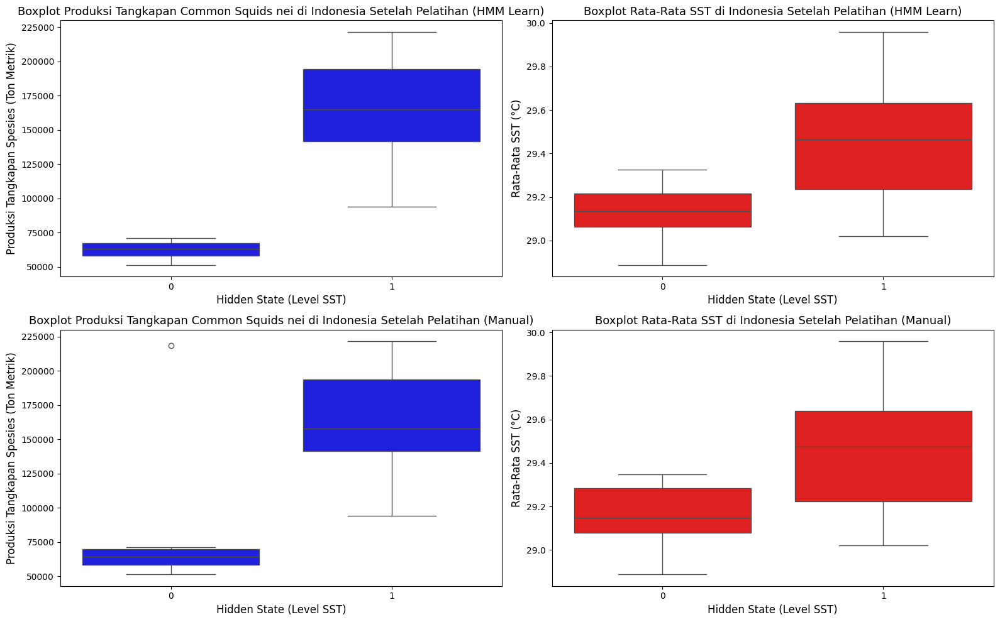

In [66]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=common_id, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=common_id, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=common_id, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=common_id, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Indonesia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [67]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = common_id.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = common_id.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = common_id.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.130122
1    29.440150
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.157350
1    29.447833
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.160440
1    29.649582
Name: Mean SST, dtype: float64


In [68]:
# Welch's t-test for each HS
# HMM Learn
common_id_0 = common_id[common_id["Predicted HS (HMM Learn)"] == 0]["Mean SST"]
common_id_1 = common_id[common_id["Predicted HS (HMM Learn)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(common_id_0, common_id_1, equal_var = False)
print(f"HMM Learn -- t-statistic: {t_stat}, p-value: {p_value}")

# Manual Code
common_id_0 = common_id[common_id["Predicted HS (Manual Code)"] == 0]["Mean SST"]
common_id_1 = common_id[common_id["Predicted HS (Manual Code)"] == 1]["Mean SST"]
t_stat, p_value = ttest_ind(common_id_0, common_id_1, equal_var = False)
print(f"Manual Code -- t-statistic: {t_stat}, p-value: {p_value}")

HMM Learn -- t-statistic: -3.3010232455507573, p-value: 0.003975030478923213
Manual Code -- t-statistic: -2.937230283744982, p-value: 0.00898630203163018


### Philippines

#### Extract Data

Min SST: 28.47943591881344
Max SST: 29.19519711600266
Midpoint: 28.83731651740805


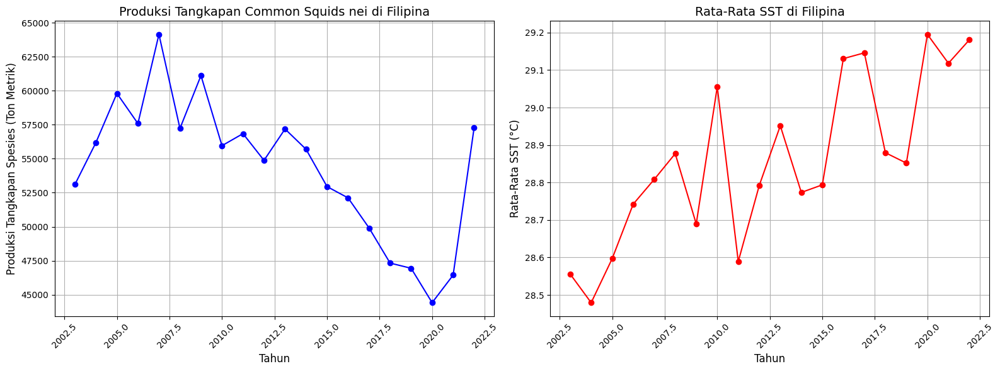

In [ ]:
# Extract Common squids nei in Philippines
common_ph = df_marine[(df_marine["Species"] == "Common squids nei") & (df_marine["Country"] == "Philippines")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
common_ph = common_ph[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
common_ph = common_ph.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
common_ph = common_ph.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
common_ph = hs_interval(common_ph)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(common_ph["PERIOD"], common_ph["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Common Squids nei di Filipina", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(common_ph["PERIOD"], common_ph["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Filipina", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

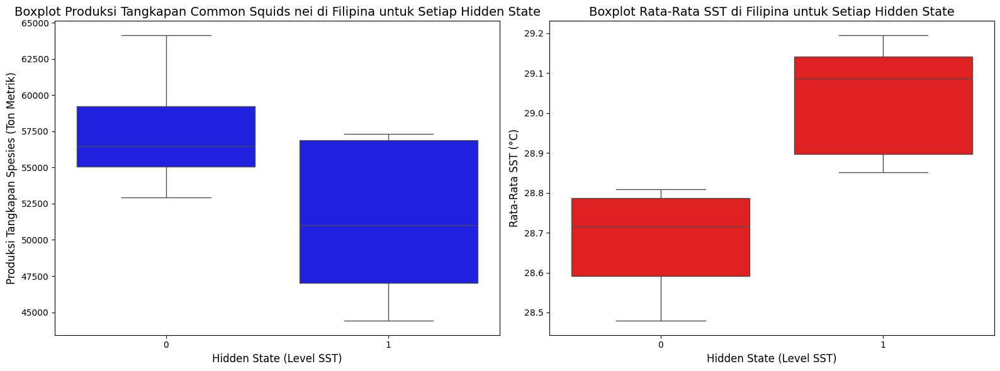

T-statistic: 2.915636349504769, P-value: 0.00922824341648172
Observation Data: 
 [[53100.  ]
 [56181.  ]
 [59801.  ]
 [57585.  ]
 [64139.  ]
 [57223.  ]
 [61112.  ]
 [55957.  ]
 [56842.  ]
 [54878.  ]
 [57183.  ]
 [55693.  ]
 [52949.  ]
 [52119.  ]
 [49909.  ]
 [47327.  ]
 [46946.  ]
 [44415.24]
 [46445.02]
 [57302.61]]
Hidden State - Interval: 
 [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = common_ph, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = common_ph, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Filipina untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
common_ph_0 = common_ph[common_ph["Hidden State (Interval)"] == 0]["VALUE"]
common_ph_1 = common_ph[common_ph["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(common_ph_0, common_ph_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
common_ph_hs_int = common_ph.pop("Hidden State (Interval)").values

common_ph_x = common_ph.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
common_ph_x = common_ph_x.values

print("Observation Data: \n", common_ph_x)
print("Hidden State - Interval: \n", common_ph_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(common_ph_x, common_ph_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(common_ph_x, common_ph_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 0 0 0 0 0 0 0 0 0 0 0 1 1 1]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [1 1 0 0 0]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 1 0 1 0 0 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 0]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

common_ph = pd.concat([common_ph.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

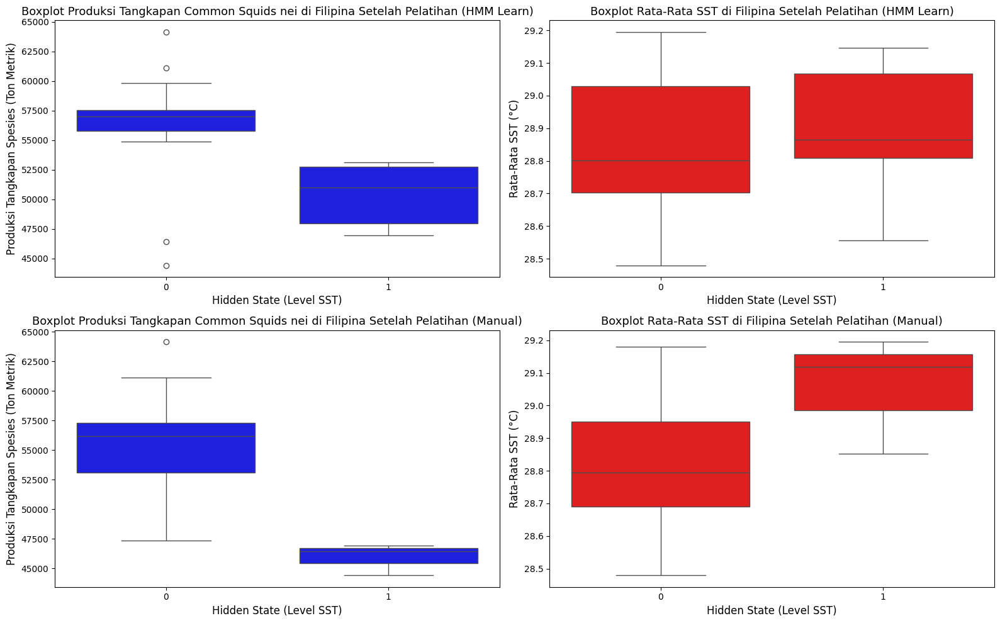

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=common_ph, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=common_ph, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=common_ph, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=common_ph, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Filipina Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = common_ph.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = common_ph.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = common_ph.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    28.846418
1    28.892918
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    28.826012
1    29.055051
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    28.682158
1    29.038578
Name: Mean SST, dtype: float64


### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


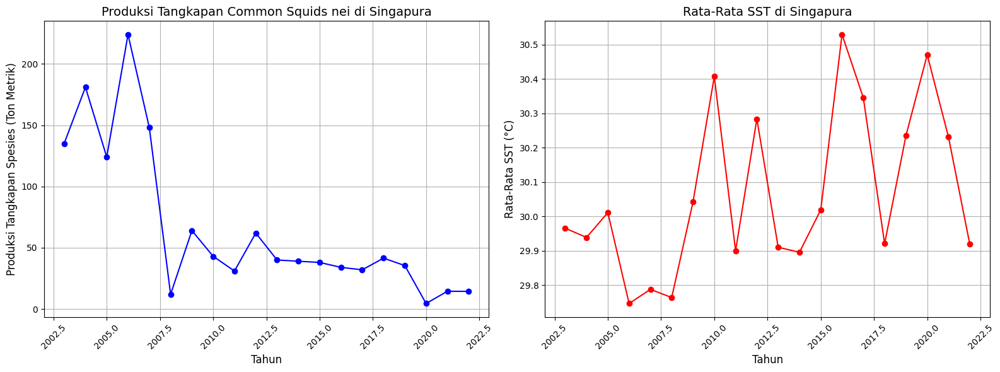

In [ ]:
# Extract Common squids nei in Singapore
common_sg = df_marine[(df_marine["Species"] == "Common squids nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
common_sg = common_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
common_sg = common_sg.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
common_sg = common_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
common_sg = hs_interval(common_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(common_sg["PERIOD"], common_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Common Squids nei di Singapura", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(common_sg["PERIOD"], common_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Singapura", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

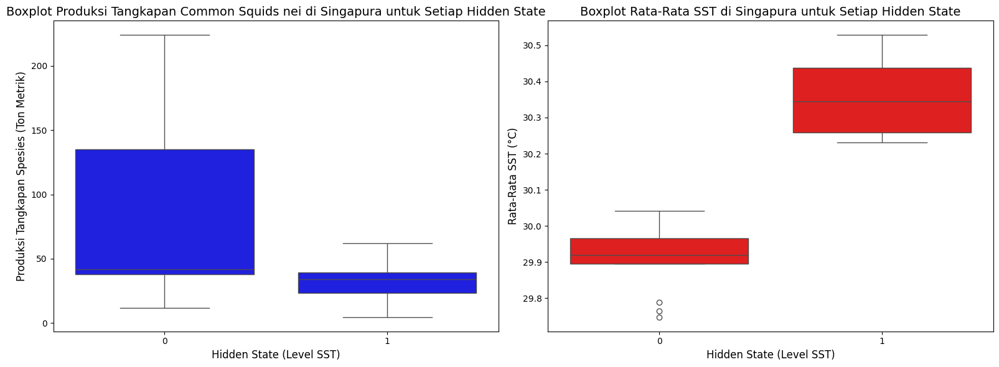

T-statistic: 1.9048669418413873, P-value: 0.07290254541631767
Observation Data: 
 [[135.   ]
 [181.   ]
 [124.   ]
 [224.   ]
 [148.   ]
 [ 12.   ]
 [ 64.   ]
 [ 43.   ]
 [ 31.   ]
 [ 62.   ]
 [ 40.   ]
 [ 39.   ]
 [ 38.   ]
 [ 34.   ]
 [ 32.   ]
 [ 41.5  ]
 [ 35.461]
 [  4.5  ]
 [ 14.5  ]
 [ 14.4  ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = common_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = common_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
common_sg_0 = common_sg[common_sg["Hidden State (Interval)"] == 0]["VALUE"]
common_sg_1 = common_sg[common_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(common_sg_0, common_sg_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
common_sg_hs_int = common_sg.pop("Hidden State (Interval)").values

common_sg_x = common_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
common_sg_x = common_sg_x.values

print("Observation Data: \n", common_sg_x)
print("Hidden State - Interval: \n", common_sg_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(common_sg_x, common_sg_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(common_sg_x, common_sg_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 0]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 0]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

common_sg = pd.concat([common_sg.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

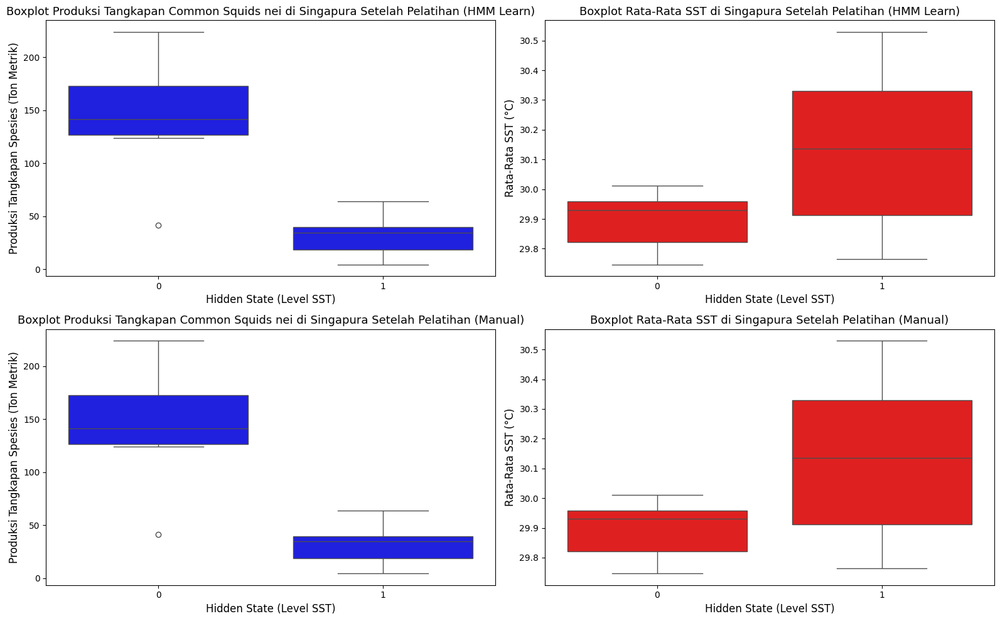

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=common_sg, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Singapura Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=common_sg, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Singapura Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=common_sg, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Singapura Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=common_sg, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Singapura Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = common_sg.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = common_sg.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = common_sg.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.895278
1    30.139355
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.895278
1    30.139355
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.909475
1    30.357067
Name: Mean SST, dtype: float64


### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


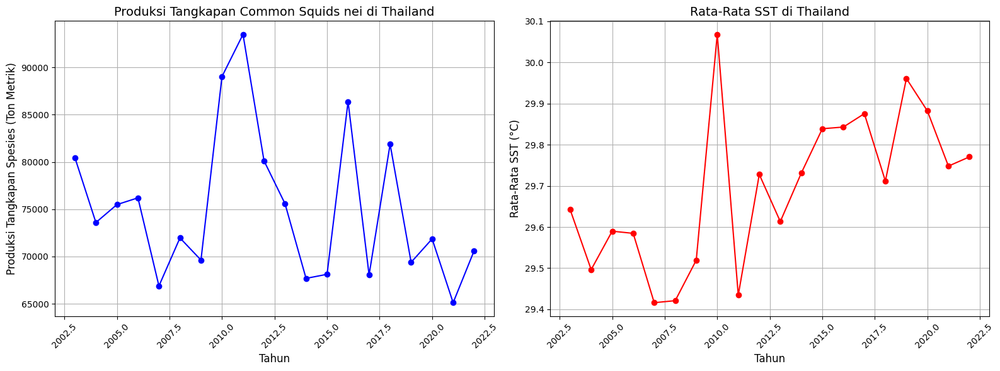

In [ ]:
# Extract Common squids nei in Thailand
common_th = df_marine[(df_marine["Species"] == "Common squids nei") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
common_th = common_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
common_th = common_th.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
common_th = common_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
common_th = hs_interval(common_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(common_th["PERIOD"], common_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Common Squids nei di Thailand", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(common_th["PERIOD"], common_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Thailand", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

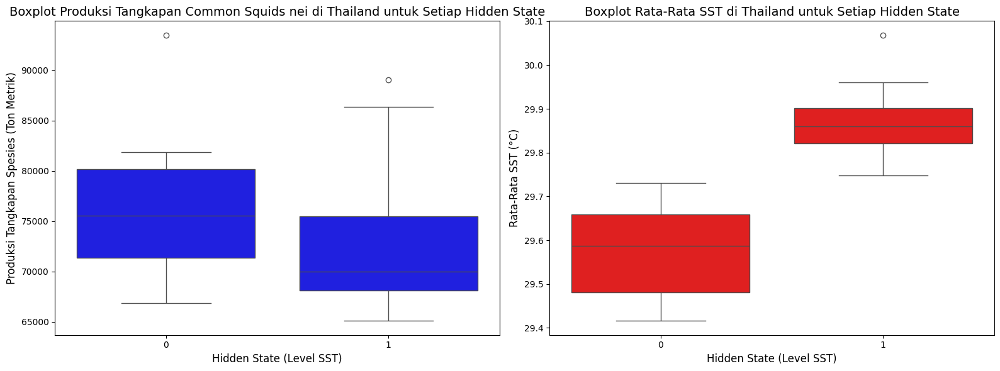

T-statistic: 0.6864928443144106, P-value: 0.5011509547593795
Observation Data: 
 [[80462.  ]
 [73594.  ]
 [75488.  ]
 [76202.  ]
 [66885.  ]
 [71964.  ]
 [69626.  ]
 [89027.  ]
 [93489.  ]
 [80121.  ]
 [75581.  ]
 [67687.  ]
 [68117.  ]
 [86380.92]
 [68052.59]
 [81877.93]
 [69386.65]
 [71862.98]
 [65115.78]
 [70616.1 ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = common_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Common Squids nei di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = common_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
common_th_0 = common_th[common_th["Hidden State (Interval)"] == 0]["VALUE"]
common_th_1 = common_th[common_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(common_th_0, common_th_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
common_th_hs_int = common_th.pop("Hidden State (Interval)").values

common_th_x = common_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
common_th_x = common_th_x.values

print("Observation Data: \n", common_th_x)
print("Hidden State - Interval: \n", common_th_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(common_th_x, common_th_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(common_th_x, common_th_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 0 0 0 0]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 1 1 1 1 1 1 0 0 0 1 1 1 0 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]


## Indian mackerels nei

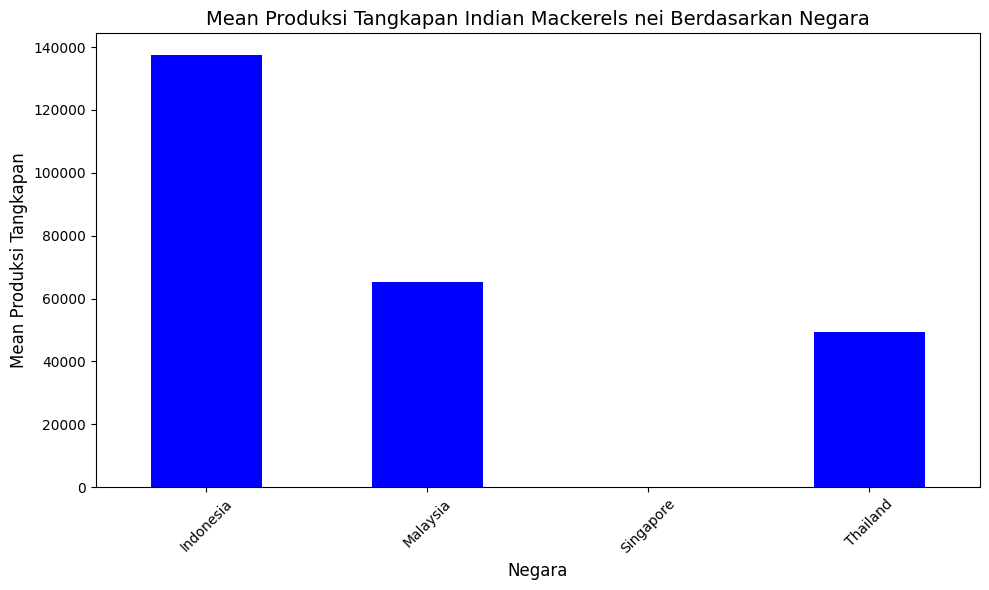

In [ ]:
# Plot Indian Mackerels nei bar chart for every country.
indian_df = df_marine[df_marine["Species"] == "Indian mackerels nei"]

mean_by_country = indian_df.groupby("Country")["VALUE"].mean()

mean_by_country.plot(kind = "bar", figsize = (10, 6), color = "blue")
plt.xlabel("Negara", fontsize = 12)
plt.ylabel("Mean Produksi Tangkapan", fontsize = 12)
plt.title("Mean Produksi Tangkapan Indian Mackerels nei Berdasarkan Negara", fontsize = 14)
plt.xticks(rotation = 45)
plt.tight_layout()
plt.show()

### Malaysia

#### Extract Data

Min SST: 29.565822828130795
Max SST: 30.085139594501744
Midpoint: 29.82548121131627


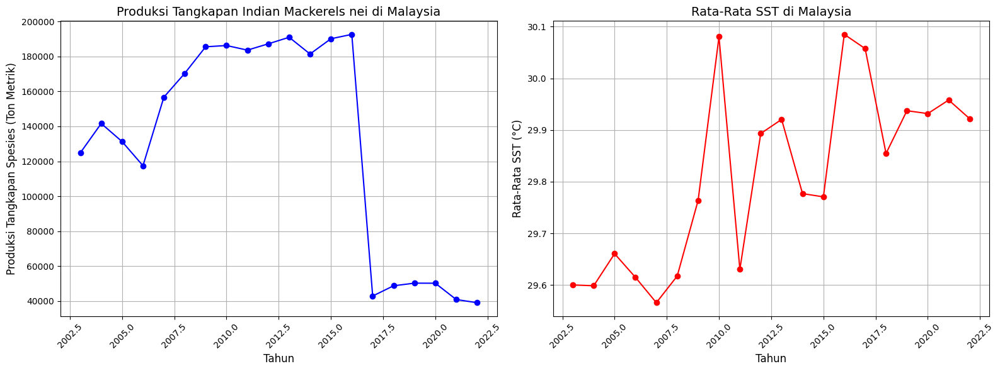

In [ ]:
# Extract Indian mackerels nei in Malaysia
indian_my = df_marine[(df_marine["Species"] == "Indian mackerels nei") & (df_marine["Country"] == "Malaysia")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
indian_my = indian_my[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
indian_my = indian_my.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
indian_my = indian_my.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
indian_my = hs_interval(indian_my)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(indian_my["PERIOD"], indian_my["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Indian Mackerels nei di Malaysia", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(indian_my["PERIOD"], indian_my["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Malaysia", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
print(indian_my)

stat, p_value = shapiro(indian_my["VALUE"])
print("Stat:", stat)
print("P-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

    PERIOD       VALUE   Mean SST  Min SST  Max SST  Hidden State (Interval)
0     2003  124858.000  29.600197    25.24    33.83                        0
1     2004  141632.000  29.598596    25.82    34.56                        0
2     2005  131272.000  29.660631    25.68    35.00                        0
3     2006  117475.000  29.614866    25.24    32.52                        0
4     2007  156687.000  29.565823    25.82    35.00                        0
5     2008  170321.000  29.617450    25.82    32.96                        0
6     2009  185490.000  29.763829    24.37    32.96                        0
7     2010  186225.000  30.080496    25.82    34.42                        1
8     2011  183590.000  29.630344    25.24    32.96                        0
9     2012  187190.000  29.893288    26.11    35.00                        1
10    2013  190942.000  29.920503    26.26    35.00                        1
11    2014  181376.000  29.776958    24.95    35.00                        0

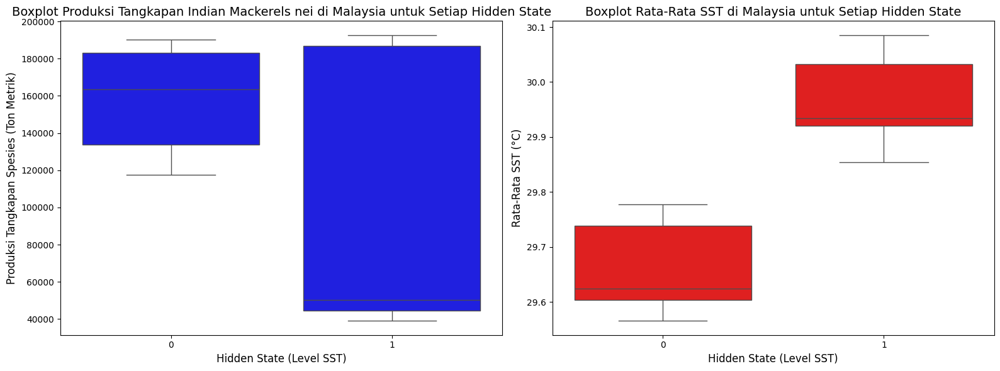

T-statistic: 2.205418493045714, P-value: 0.04066690195925485
Observation Data: 
 [[124858.   ]
 [141632.   ]
 [131272.   ]
 [117475.   ]
 [156687.   ]
 [170321.   ]
 [185490.   ]
 [186225.   ]
 [183590.   ]
 [187190.   ]
 [190942.   ]
 [181376.   ]
 [190088.   ]
 [192596.   ]
 [ 42953.   ]
 [ 48815.   ]
 [ 50318.027]
 [ 50280.176]
 [ 40960.   ]
 [ 39147.   ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1 1 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = indian_my, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Indian Mackerels nei di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = indian_my, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Malaysia untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
indian_my_0 = indian_my[indian_my["Hidden State (Interval)"] == 0]["VALUE"]
indian_my_1 = indian_my[indian_my["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(indian_my_0, indian_my_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
indian_my_hs_int = indian_my.pop("Hidden State (Interval)").values

indian_my_x = indian_my.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
indian_my_x = indian_my_x.values

print("Observation Data: \n", indian_my_x)
print("Hidden State - Interval: \n", indian_my_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(indian_my_x, indian_my_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(indian_my_x, indian_my_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [1 1 1 1 1 1 0 0 0 0 0 0 0 0 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [1 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 0 0 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 1 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [1 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

indian_my = pd.concat([indian_my.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

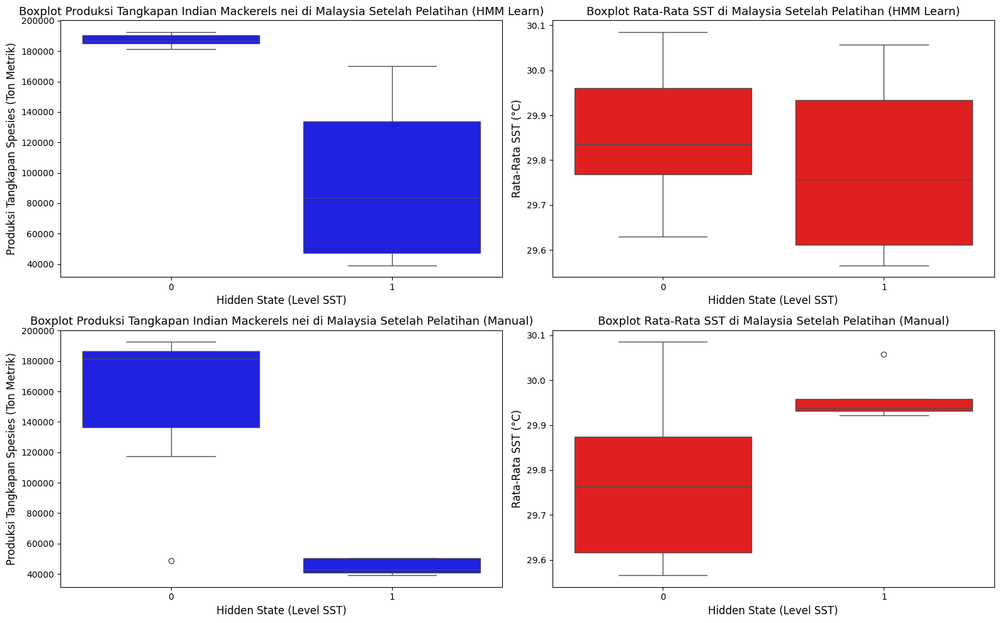

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=indian_my, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Indian Mackerels nei di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=indian_my, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=indian_my, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Indian Mackerels nei di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=indian_my, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Malaysia Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = indian_my.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = indian_my.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = indian_my.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.865151
1    29.776605
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.762223
1    29.961425
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.659935
1    29.964113
Name: Mean SST, dtype: float64


### Singapore

#### Extract Data

Min SST: 29.746875
Max SST: 30.52909722222222
Midpoint: 30.13798611111111


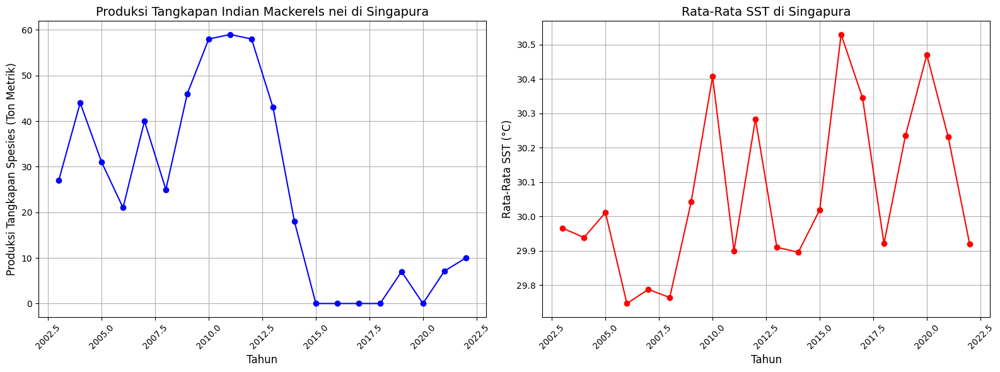

In [ ]:
# Extract Indian mackerels nei in Singapore
indian_sg = df_marine[(df_marine["Species"] == "Indian mackerels nei") & (df_marine["Country"] == "Singapore")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
indian_sg = indian_sg[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
indian_sg = indian_sg.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
indian_sg = indian_sg.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
indian_sg = hs_interval(indian_sg)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(indian_sg["PERIOD"], indian_sg["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Indian Mackerels nei di Singapura", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(indian_sg["PERIOD"], indian_sg["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Singapura", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
print(indian_sg)

stat, p_value = shapiro(indian_sg["VALUE"])
print("Stat:", stat)
print("P-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

    PERIOD  VALUE   Mean SST  Min SST  Max SST  Hidden State (Interval)
0     2003   27.0  29.965694    27.43    33.11                        0
1     2004   44.0  29.939028    27.57    34.27                        0
2     2005   31.0  30.011181    27.57    32.38                        0
3     2006   21.0  29.746875    28.30    31.65                        0
4     2007   40.0  29.787986    26.99    32.96                        0
5     2008   25.0  29.764236    27.86    32.96                        0
6     2009   46.0  30.042083    26.99    32.81                        0
7     2010   58.0  30.406597    28.30    33.11                        1
8     2011   59.0  29.900208    28.01    32.96                        0
9     2012   58.0  30.283636    28.15    32.52                        1
10    2013   43.0  29.910530    27.72    32.23                        0
11    2014   18.0  29.895833    26.41    32.67                        0
12    2015    0.0  30.019167    28.01    33.25                  

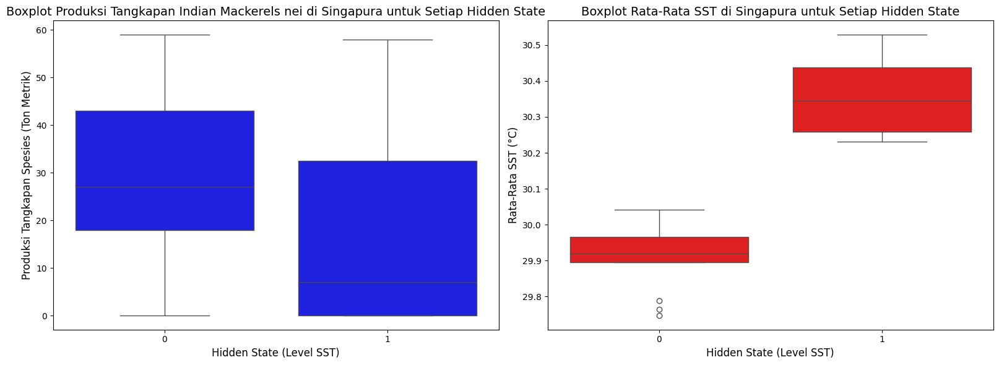

T-statistic: 0.9307277057517777, P-value: 0.3643101073703514
Observation Data: 
 [[27. ]
 [44. ]
 [31. ]
 [21. ]
 [40. ]
 [25. ]
 [46. ]
 [58. ]
 [59. ]
 [58. ]
 [43. ]
 [18. ]
 [ 0. ]
 [ 0. ]
 [ 0. ]
 [ 0. ]
 [ 7. ]
 [ 0. ]
 [ 7.1]
 [10. ]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1 0 1 1 1 0]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = indian_sg, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Indian Mackerels nei di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = indian_sg, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Singapura untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
indian_sg_0 = indian_sg[indian_sg["Hidden State (Interval)"] == 0]["VALUE"]
indian_sg_1 = indian_sg[indian_sg["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(indian_sg_0, indian_sg_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
indian_sg_hs_int = indian_sg.pop("Hidden State (Interval)").values

indian_sg_x = indian_sg.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
indian_sg_x = indian_sg_x.values

print("Observation Data: \n", indian_sg_x)
print("Hidden State - Interval: \n", indian_sg_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(indian_sg_x, indian_sg_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(indian_sg_x, indian_sg_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 0 0 0 0]
Actual HS (test):    [0 1 1 1 0]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 1 0 0 0 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 0]


### Thailand

#### Extract Data

Min SST: 29.41609906378594
Max SST: 30.068317877119004
Midpoint: 29.74220847045247


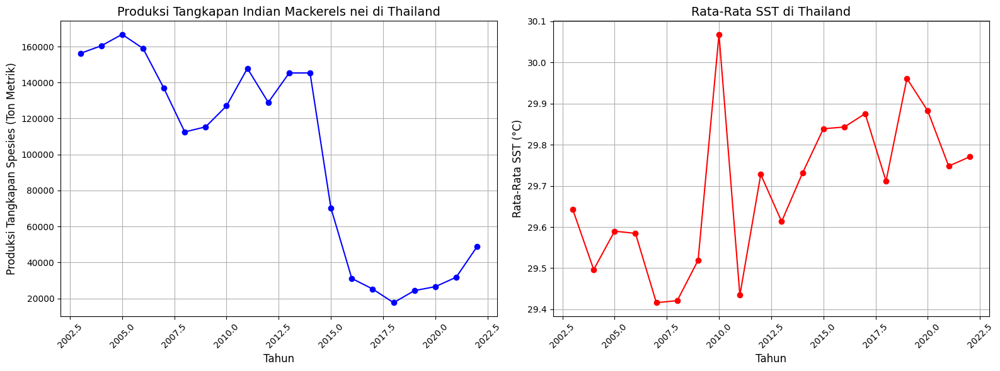

In [ ]:
# Extract Indian mackerels nei in Thailand
indian_th = df_marine[(df_marine["Species"] == "Indian mackerels nei") & (df_marine["Country"] == "Thailand")]

# Remove columns: UN_Code, 3A_Code, STATUS, and Country
indian_th = indian_th[["PERIOD", "VALUE", "Mean SST", "Min SST", "Max SST"]]
indian_th = indian_th.sort_values(by = "PERIOD")

# Combining capture production recorded on different regions
indian_th = indian_th.groupby("PERIOD").agg({"VALUE": "sum", "Mean SST": "first", "Min SST": "first", "Max SST": "first"}).reset_index()

# Assign hidden states by equal intervals
indian_th = hs_interval(indian_th)

# Plot
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharex = True)

axes[0].plot(indian_th["PERIOD"], indian_th["VALUE"], marker = "o", color = "blue")
axes[0].set_title("Produksi Tangkapan Indian Mackerels nei di Thailand", fontsize = 14)
axes[0].set_xlabel("Tahun", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)
axes[0].grid(True)
axes[0].tick_params(axis = "x", rotation = 45)

axes[1].plot(indian_th["PERIOD"], indian_th["Mean SST"], marker = "o", color = "red")
axes[1].set_title("Rata-Rata SST di Thailand", fontsize = 14)
axes[1].set_xlabel("Tahun", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)
axes[1].grid(True)
axes[1].tick_params(axis = "x", rotation = 45)

plt.tight_layout()
plt.show()

In [ ]:
print(indian_th)

stat, p_value = shapiro(indian_th["VALUE"])
print("Stat:", stat)
print("P-value:", p_value)

# if p-val is greater than alpha = 0.05, then data is distributed normally.

    PERIOD      VALUE   Mean SST  Min SST  Max SST  Hidden State (Interval)
0     2003  156223.00  29.642273    26.84    35.00                        0
1     2004  160398.00  29.496449    26.55    34.27                        0
2     2005  166766.00  29.589940    26.55    35.00                        0
3     2006  158979.00  29.584655    26.84    35.00                        0
4     2007  136839.00  29.416099    26.41    34.71                        0
5     2008  112557.00  29.421048    25.82    33.83                        0
6     2009  115378.00  29.519423    25.24    32.96                        0
7     2010  127006.00  30.068318    27.43    35.00                        1
8     2011  147852.00  29.434538    26.99    35.00                        0
9     2012  128958.00  29.727909    27.13    34.13                        0
10    2013  145300.00  29.613283    26.41    34.13                        0
11    2014  145341.00  29.731243    25.82    35.00                        0
12    2015  

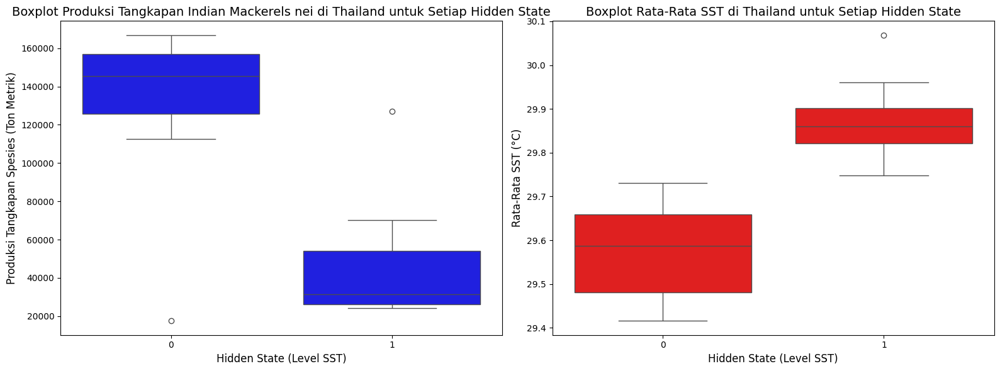

T-statistic: 4.8253429445303935, P-value: 0.00013568485264727547
Observation Data: 
 [[156223.  ]
 [160398.  ]
 [166766.  ]
 [158979.  ]
 [136839.  ]
 [112557.  ]
 [115378.  ]
 [127006.  ]
 [147852.  ]
 [128958.  ]
 [145300.  ]
 [145341.  ]
 [ 70303.  ]
 [ 31120.42]
 [ 25258.7 ]
 [ 17654.9 ]
 [ 24373.91]
 [ 26561.81]
 [ 31809.56]
 [ 48828.27]]
Hidden State - Interval: 
 [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1 0 1 1 1 1]


In [ ]:
# Boxplot for each Hidden State
fig, axes = plt.subplots(1, 2, figsize = (16, 6), sharey = False)

sns.boxplot(x = "Hidden State (Interval)", y = "VALUE", data = indian_th, ax = axes[0], color = "blue")
axes[0].set_title("Boxplot Produksi Tangkapan Indian Mackerels nei di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[0].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize = 12)

sns.boxplot(x = "Hidden State (Interval)", y = "Mean SST", data = indian_th, ax = axes[1], color = "red")
axes[1].set_title("Boxplot Rata-Rata SST di Thailand untuk Setiap Hidden State", fontsize = 14)
axes[1].set_xlabel("Hidden State (Level SST)", fontsize = 12)
axes[1].set_ylabel("Rata-Rata SST (°C)", fontsize = 12)

plt.tight_layout()
plt.show()

# t-test for each HS
indian_th_0 = indian_th[indian_th["Hidden State (Interval)"] == 0]["VALUE"]
indian_th_1 = indian_th[indian_th["Hidden State (Interval)"] == 1]["VALUE"]
t_stat, p_value = ttest_ind(indian_th_0, indian_th_1)
print(f"T-statistic: {t_stat}, P-value: {p_value}")

# X = Capture Production, Y = Actual Hidden State (from interval and quantile)
indian_th_hs_int = indian_th.pop("Hidden State (Interval)").values

indian_th_x = indian_th.drop(columns = ["PERIOD", "Mean SST", "Min SST", "Max SST"])
indian_th_x = indian_th_x.values

print("Observation Data: \n", indian_th_x)
print("Hidden State - Interval: \n", indian_th_hs_int)

#### Model

In [ ]:
# HMM Library
print("==========================================")
n_states = 2

print("HMM Library - Interval HS")
trained_startprob_hmm, trained_transmat_hmm, trained_means_hmm, trained_covars_hmm, init_startprob_hmm, init_transmat_hmm, init_means_hmm, init_covars_hmm, x_train_hmm, y_train_hmm, predhs_train_hmm, x_test_hmm, y_test_hmm, predhs_test_hmm = hmmlib(indian_th_x, indian_th_hs_int, n_states)

# Manual HMM Code
print("==========================================")
n_states = 2
n_iter = 100

print("Manual Code - Interval HS")
trained_startprob_mc, trained_transmat_mc, trained_means_mc, trained_covars_mc, init_startprob_mc, init_transmat_mc, init_means_mc, init_covars_mc, x_train_mc, y_train_mc, predhs_train_mc, x_test_mc, y_test_mc, predhs_test_mc = manualhmm(indian_th_x, indian_th_hs_int, n_states, n_iter)

HMM Library - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]
Manual Code - Interval HS
Predicted HS (train): [0 0 0 0 0 0 0 0 0 0 0 0 1 1 1]
Actual HS (train):    [0 0 0 0 0 0 0 1 0 0 0 0 1 1 1]
Predicted HS (test): [0 1 1 1 1]
Actual HS (test):    [0 1 1 1 1]


In [ ]:
# Concat predicted HS (HMMLearn code and manual code)
predhs_hmm = np.concatenate([predhs_train_hmm, predhs_test_hmm])
predhs_hmm = pd.DataFrame(predhs_hmm, columns = ["Predicted HS (HMM Learn)"])

predhs_mc = np.concatenate([predhs_train_mc, predhs_test_mc])
predhs_mc = pd.DataFrame(predhs_mc, columns = ["Predicted HS (Manual Code)"])

actualhs = np.concatenate([y_train_hmm, y_test_hmm])
actualhs = pd.DataFrame(actualhs, columns = ["Assigned Hidden State"])

indian_th = pd.concat([indian_th.reset_index(drop = True), actualhs, predhs_hmm, predhs_mc], axis = 1)

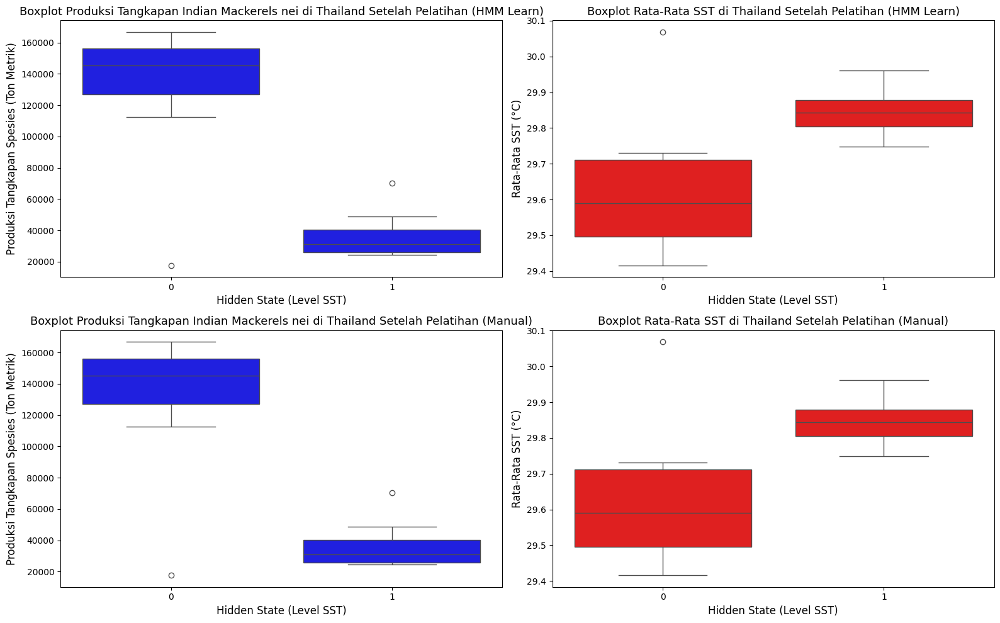

In [ ]:
# Boxplot for each HS (hmmlearn)
fig, axes = plt.subplots(2, 2, figsize = (16, 10), sharey = False)

sns.boxplot(x="Predicted HS (HMM Learn)", y="VALUE", data=indian_th, ax=axes[0, 0], color="blue")
axes[0, 0].set_title("Boxplot Produksi Tangkapan Indian Mackerels nei di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (HMM Learn)", y="Mean SST", data=indian_th, ax=axes[0, 1], color="red")
axes[0, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (HMM Learn)", fontsize=13)
axes[0, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[0, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()

# Boxplot for each HS (manual code)
sns.boxplot(x="Predicted HS (Manual Code)", y="VALUE", data=indian_th, ax=axes[1, 0], color="blue")
axes[1, 0].set_title("Boxplot Produksi Tangkapan Indian Mackerels nei di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 0].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 0].set_ylabel("Produksi Tangkapan Spesies (Ton Metrik)", fontsize=12)

sns.boxplot(x="Predicted HS (Manual Code)", y="Mean SST", data=indian_th, ax=axes[1, 1], color="red")
axes[1, 1].set_title("Boxplot Rata-Rata SST di Thailand Setelah Pelatihan (Manual)", fontsize=13)
axes[1, 1].set_xlabel("Hidden State (Level SST)", fontsize=12)
axes[1, 1].set_ylabel("Rata-Rata SST (°C)", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
# Mean of every state (trained HMM Learn model)
mean_sst_state = indian_th.groupby("Predicted HS (HMM Learn)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from HMM Learn model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = indian_th.groupby("Predicted HS (Manual Code)")["Mean SST"].mean()
print("Mean SST (based on predicted hidden state from manual code model): \n", mean_sst_state)

# Mean of every state (trained manual code)
mean_sst_state = indian_th.groupby("Assigned Hidden State")["Mean SST"].mean()
print("Mean SST (based on the actual/initially assigned hidden state): \n", mean_sst_state)

Mean SST (based on predicted hidden state from HMM Learn model): 
 Predicted HS (HMM Learn)
0    29.612068
1    29.845645
Name: Mean SST, dtype: float64
Mean SST (based on predicted hidden state from manual code model): 
 Predicted HS (Manual Code)
0    29.612068
1    29.845645
Name: Mean SST, dtype: float64
Mean SST (based on the actual/initially assigned hidden state): 
 Assigned Hidden State
0    29.574047
1    29.873479
Name: Mean SST, dtype: float64


In [ ]:
print(indian_th)

    PERIOD      VALUE   Mean SST  Min SST  Max SST  Assigned Hidden State  \
0     2003  156223.00  29.642273    26.84    35.00                      0   
1     2004  160398.00  29.496449    26.55    34.27                      0   
2     2005  166766.00  29.589940    26.55    35.00                      0   
3     2006  158979.00  29.584655    26.84    35.00                      0   
4     2007  136839.00  29.416099    26.41    34.71                      0   
5     2008  112557.00  29.421048    25.82    33.83                      0   
6     2009  115378.00  29.519423    25.24    32.96                      0   
7     2010  127006.00  30.068318    27.43    35.00                      1   
8     2011  147852.00  29.434538    26.99    35.00                      0   
9     2012  128958.00  29.727909    27.13    34.13                      0   
10    2013  145300.00  29.613283    26.41    34.13                      0   
11    2014  145341.00  29.731243    25.82    35.00                      0   